# LSTM


The three main steps for the LSTM part are:

1. Create a Dataset/DataLoader (for convenient batch training)

2. Define an LSTM model (primarily an encoder, but a simple reconstruction can also be included)

3. Train the model → Extract the trajectory embedding for each tract



(1) Reshape all datasets into time-series → X_panel, X_neigh, X_od

(2) Train on 13-year sequences

(3) Extract dynamic embeddings (128 dims)

(4) Combine embeddings with static 2022 features → X_full

(5) Run Dynamic ML:
      - KMeans_dynamic
      - RF_dynamic
      - MLP_dynamic
      - XGBoost_dynamic

(6) Compare Static vs Dynamic models:
      accuracy, stability, interpretability, clustering

(7) Visualize:
      embeddings, dynamic clusters, trajectories



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install -q pandas numpy matplotlib seaborn scikit-learn tqdm
!pip install -q geopandas folium contextily
!pip install -q shap

In [ ]:
import shap
import os
import glob
import pandas as pd
import geopandas as gpd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim

In [ ]:
import pickle

In [ ]:
from sklearn.cluster import KMeans
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier

In [ ]:
from torch.utils.data import Dataset, DataLoader

In [ ]:
from tqdm.auto import tqdm

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
import folium

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
from sklearn.pipeline import Pipeline

## Load data

In [ ]:
base = "/content/drive/MyDrive/AI_DATA/dataset"

In [ ]:
df_panel = pd.read_parquet(f"{base}/df_panel_ml.parquet")
df_neigh_all = pd.read_parquet(f"{base}/df_neigh_ml.parquet")
df_tr_all = pd.read_parquet(f"{base}/df_tr_ml.parquet")

In [ ]:
df_panel

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,log_JAFS_low_pc,log_JAFS_median_pc,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc
0,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,10.235815,11.769619,9.728845,8.671906,8.892242,9.600641,10.642985,9.726694,11.425959,10.069754
1,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,9.740153,11.248935,9.252492,8.184557,8.412884,9.093609,10.134488,9.070042,10.929444,9.584135
2,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,8.606847,10.158974,8.116778,7.078554,7.287259,7.945615,8.971247,7.975292,9.862615,8.447053
3,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,11.816592,12.623664,11.331216,10.392088,10.577775,11.060846,12.181256,11.296290,11.764716,11.680762
4,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,10.656289,12.552812,10.128651,9.035481,9.378179,10.009539,10.986117,10.282132,12.326788,10.504642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4142,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,10.821331,10.061236,5.875456,8.782998,8.846481,10.508005,10.128714,9.555923,9.961792,9.508316
4143,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,11.938391,11.179981,6.841081,10.036676,9.945355,11.602107,11.249129,10.723548,10.997401,10.685182
4144,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,14.125832,13.406971,9.342158,12.225462,12.245639,13.766192,13.475981,12.980630,13.085443,12.928746
4145,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,12.245042,11.533598,7.113793,10.388381,10.255018,11.898492,11.602310,10.837931,11.408634,11.017052


In [ ]:
base = "/content/drive/MyDrive/AI_DATA/dataset"
df_panal_res = pd.read_parquet(f"{base}/df_panel_res.parquet")

In [ ]:
df_panal_res

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc,LandUse,LandUseText
1,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,9.728845,8.671906,8.892242,9.600641,10.642985,9.726694,11.425959,10.069754,01,One & Two Family Buildings
2,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,9.252492,8.184557,8.412884,9.093609,10.134488,9.070042,10.929444,9.584135,01,One & Two Family Buildings
3,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,8.116778,7.078554,7.287259,7.945615,8.971247,7.975292,9.862615,8.447053,01,One & Two Family Buildings
4,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,11.331216,10.392088,10.577775,11.060846,12.181256,11.296290,11.764716,11.680762,04,Mixed Residential & Commercial Buildings
8,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,10.128651,9.035481,9.378179,10.009539,10.986117,10.282132,12.326788,10.504642,02,Multi-Family Walk-Up Buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4617,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,5.875456,8.782998,8.846481,10.508005,10.128714,9.555923,9.961792,9.508316,03,Multi-Family Elevator Buildings
4619,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,6.841081,10.036676,9.945355,11.602107,11.249129,10.723548,10.997401,10.685182,01,One & Two Family Buildings
4620,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,9.342158,12.225462,12.245639,13.766192,13.475981,12.980630,13.085443,12.928746,01,One & Two Family Buildings
4621,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,7.113793,10.388381,10.255018,11.898492,11.602310,10.837931,11.408634,11.017052,01,One & Two Family Buildings


In [ ]:
df_panel.shape
df_panel.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80', 'access_Office',
       'access_Industrial', 'access_Institutional', 'access_LocalServices',
       'resident_pop', 'JAFS_total_pc', 'JAFS_low_pc', 'JAFS_median_pc',
       'JAFS_high_pc', 'JAFS_low30_pc', 'JAFS_low50_pc', 'JAFS_low60_pc',
       'JAFS_low80_pc', 'JAFS_Office_pc', 'JAFS_Industrial_pc',
       'JAFS_Institutional_pc', 'JAFS_LocalServices_pc',
       'log_access_jobs_total', 'log_access_low_total',
       'log_access_median_total', 'log_access_high_total', 'log_access_low50',
       'log_access_low60', 'log_access_low80', 'log_access_Office',
       'log_access_Industrial', 'log_access_Institutional',
       'log_access_LocalServices', 'log_resident_pop', 'log_JAFS_total_pc',
       'log_JAFS_low_pc', 'log_JAFS_median_pc', 'log_JAFS_high_pc',
       'log_JAFS_low50_pc', 'log_JAFS_low60

In [ ]:
df_tr_all.columns

Index(['h_tract', 'w_tract', 'county_fips', 'region', 'BoroName', 'NTA2020',
       'NTAName', 'year', 'access_Office', 'access_Industrial',
       'access_Institutional', 'access_LocalServices', 'access_jobs_total'],
      dtype='object')

## LSTM Data Prepare

In [ ]:
print("Years in panel:", sorted(df_panel['year'].unique()))

Years in panel: [np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022)]


In [ ]:
# 只用 log_* 列 + log_resident_pop
log_feature_cols = [
    'log_access_jobs_total',
    'log_access_low_total',
    'log_access_median_total',
    'log_access_high_total',
    'log_access_low50',
    'log_access_low60',
    'log_access_low80',
    'log_access_Office',
    'log_access_Industrial',
    'log_access_Institutional',
    'log_access_LocalServices',
    'log_resident_pop',
    'log_JAFS_total_pc',
    'log_JAFS_low_pc',
    'log_JAFS_median_pc',
    'log_JAFS_high_pc',
    'log_JAFS_low50_pc',
    'log_JAFS_low60_pc',
    'log_JAFS_low80_pc',
    'log_JAFS_Office_pc',
    'log_JAFS_Industrial_pc',
    'log_JAFS_Institutional_pc',
    'log_JAFS_LocalServices_pc'
]

# 确保这些列都在 df_panel 里
missing = [c for c in log_feature_cols if c not in df_panel.columns]
print("Missing log feature columns:", missing)

Missing log feature columns: []


In [ ]:
# Check if each tract has a complete 13 years of data.
# 按 h_tract, year 排序
df_panel_sorted = df_panel.sort_values(['h_tract', 'year'])

# 每个 tract 的年份数
year_counts = df_panel_sorted.groupby('h_tract')['year'].nunique()
print("Unique year counts per tract:")
print(year_counts.value_counts().sort_index())

# 保留刚好有完整年份（比如 13 年）的 tract
full_years = year_counts.max()   # 理论上应该是 13
print("Max years per tract:", full_years)

valid_tracts = year_counts[year_counts == full_years].index
df_panel_sorted = df_panel_sorted[df_panel_sorted['h_tract'].isin(valid_tracts)].copy()

print("N_tracts with full years:", len(valid_tracts))

Unique year counts per tract:
year
13    319
Name: count, dtype: int64
Max years per tract: 13
N_tracts with full years: 319


In [ ]:
# Generate a NumPy array X_panel of shape (N_tracts, T, F).

# 再次排序，保证 tract 内部按年份有序
df_panel_sorted = df_panel_sorted.sort_values(['h_tract', 'year'])

tract_ids = df_panel_sorted['h_tract'].unique()
years = sorted(df_panel_sorted['year'].unique())
T = len(years)
F = len(log_feature_cols)

print("N_tracts:", len(tract_ids))
print("T_years:", T)
print("F_features:", F)

X_list = []
id_list = []   # 记录 tract 顺序，方便之后对齐 embedding

for h in tract_ids:
    df_h = df_panel_sorted[df_panel_sorted['h_tract'] == h].sort_values('year')

    # 安全检查：这个 tract 是否有完整年份
    if df_h['year'].nunique() != T:
        print(f"Warning: tract {h} does not have full {T} years, skipping.")
        continue

    # 取 log 特征矩阵，shape = (T, F)
    X_h = df_h[log_feature_cols].to_numpy(dtype=np.float32)
    X_list.append(X_h)
    id_list.append(h)

# 堆成 3D 数组： (N, T, F)
X_panel = np.stack(X_list, axis=0)
tract_ids_ordered = np.array(id_list)

print("X_panel shape:", X_panel.shape)  # (N_tracts, T, F)
print("Example tract_ids_ordered[:5]:", tract_ids_ordered[:5])

N_tracts: 319
T_years: 13
F_features: 23
X_panel shape: (319, 13, 23)
Example tract_ids_ordered[:5]: ['36005000200' '36005000400' '36005001600' '36005001901' '36005002001']


In [ ]:
# Standardize the log features.

N, T, F = X_panel.shape

# 展平成 2D： (N*T, F)，对所有 tract+year 统一标准化
X_flat = X_panel.reshape(-1, F)

scaler = StandardScaler()
X_flat_scaled = scaler.fit_transform(X_flat)

# 再 reshape 回 3D： (N, T, F)
X_panel_scaled = X_flat_scaled.reshape(N, T, F).astype(np.float32)

print("X_panel_scaled shape:", X_panel_scaled.shape)

X_panel_scaled shape: (319, 13, 23)


In [ ]:
# Converted to PyTorch tensor, intended for use with LSTM.

X_tensor = torch.from_numpy(X_panel_scaled)  # 或 X_panel，如果你暂时不做 scaling
print("X_tensor.shape:", X_tensor.shape)     # 预期: (N_tracts, 13, F)
print("X_tensor.dtype:", X_tensor.dtype)

X_tensor.shape: torch.Size([319, 13, 23])
X_tensor.dtype: torch.float32


In [ ]:
class TractSequenceDataset(Dataset):
    def __init__(self, X):
        # X: (N, T, F)
        self.X = X

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        # 返回一条序列 (T, F)
        return self.X[idx]

dataset = TractSequenceDataset(X_tensor)

# 你可以调整 batch_size，比如 16 / 32
batch_size = 32
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# 简单检查一下
for batch in dataloader:
    print("Batch shape:", batch.shape)  # 应该是 (batch_size, 13, F)
    break

Batch shape: torch.Size([32, 13, 23])


In [ ]:
class LSTMSequenceAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, num_layers=1, bidirectional=False):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional
        )
        self.bidirectional = bidirectional
        self.hidden_dim = hidden_dim

        # 将 hidden 映射回原始特征维度 F，用来重构序列
        out_dim = hidden_dim * (2 if bidirectional else 1)
        self.output_layer = nn.Linear(out_dim, input_dim)

    def forward(self, x):
        # x: (batch, T, F)
        output, (h_n, c_n) = self.lstm(x)   # output: (batch, T, H or 2H)

        # reconstruction: 对每个 time step 的 hidden 做线性变换
        recon = self.output_layer(output)   # (batch, T, F)

        # embedding: 取最后一层的最后一个 hidden state
        if self.bidirectional:
            # 双向时，拼接正向/反向
            h_last = torch.cat([h_n[-2], h_n[-1]], dim=-1)  # (batch, 2H)
        else:
            h_last = h_n[-1]  # (batch, H)

        # 返回重构序列和 embedding
        return recon, h_last

In [ ]:
# Initialize the model, loss function, and optimizer.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

N, T, F = X_tensor.shape

hidden_dim = 128   # 你可以改成 128
num_layers = 1
bidirectional = False

model = LSTMSequenceAutoencoder(
    input_dim=F,
    hidden_dim=hidden_dim,
    num_layers=num_layers,
    bidirectional=bidirectional
).to(device)

criterion = nn.MSELoss()  # 重构损失: 原序列 vs 重构序列
optimizer = optim.Adam(model.parameters(), lr=1e-3)

print(model)

Using device: cuda
LSTMSequenceAutoencoder(
  (lstm): LSTM(23, 128, batch_first=True)
  (output_layer): Linear(in_features=128, out_features=23, bias=True)
)


### Training an LSTM (self-supervised: reconstructing its own time series)

We train a 1-layer LSTM sequence autoencoder for 50 epochs using an MSE reconstruction loss…

In [ ]:
num_epochs = 50  # 可以先试 20，看 loss 是否降得稳定

model.train()
for epoch in range(num_epochs):
    running_loss = 0.0

    for batch in tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        batch = batch.to(device)  # (batch, T, F)

        optimizer.zero_grad()

        recon, embeddings = model(batch)   # recon: (batch,T,F), embeddings:(batch,H)

        loss = criterion(recon, batch)     # 和原序列做 MSE
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {avg_loss:.6f}")

Epoch 1/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 - Loss: 0.887401


Epoch 2/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 2/50 - Loss: 0.609772


Epoch 3/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 3/50 - Loss: 0.420262


Epoch 4/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 4/50 - Loss: 0.323659


Epoch 5/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 5/50 - Loss: 0.259620


Epoch 6/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 6/50 - Loss: 0.206602


Epoch 7/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 7/50 - Loss: 0.168848


Epoch 8/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 8/50 - Loss: 0.138235


Epoch 9/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 9/50 - Loss: 0.114403


Epoch 10/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 10/50 - Loss: 0.095144


Epoch 11/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 11/50 - Loss: 0.079285


Epoch 12/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 12/50 - Loss: 0.067577


Epoch 13/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 13/50 - Loss: 0.058449


Epoch 14/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 14/50 - Loss: 0.051045


Epoch 15/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 15/50 - Loss: 0.045711


Epoch 16/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 16/50 - Loss: 0.041190


Epoch 17/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 17/50 - Loss: 0.037466


Epoch 18/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 18/50 - Loss: 0.034525


Epoch 19/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 19/50 - Loss: 0.032041


Epoch 20/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 20/50 - Loss: 0.029849


Epoch 21/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 21/50 - Loss: 0.027786


Epoch 22/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 22/50 - Loss: 0.026086


Epoch 23/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 23/50 - Loss: 0.024458


Epoch 24/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 24/50 - Loss: 0.023019


Epoch 25/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 25/50 - Loss: 0.021642


Epoch 26/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 26/50 - Loss: 0.020430


Epoch 27/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 27/50 - Loss: 0.019272


Epoch 28/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 28/50 - Loss: 0.018282


Epoch 29/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 29/50 - Loss: 0.017345


Epoch 30/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 30/50 - Loss: 0.016508


Epoch 31/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 31/50 - Loss: 0.015663


Epoch 32/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 32/50 - Loss: 0.014748


Epoch 33/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 33/50 - Loss: 0.014058


Epoch 34/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 34/50 - Loss: 0.013252


Epoch 35/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 35/50 - Loss: 0.012580


Epoch 36/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 36/50 - Loss: 0.011931


Epoch 37/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 37/50 - Loss: 0.011311


Epoch 38/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 38/50 - Loss: 0.010765


Epoch 39/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 39/50 - Loss: 0.010248


Epoch 40/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 40/50 - Loss: 0.009812


Epoch 41/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 41/50 - Loss: 0.009334


Epoch 42/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 42/50 - Loss: 0.008894


Epoch 43/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 43/50 - Loss: 0.008583


Epoch 44/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 44/50 - Loss: 0.008289


Epoch 45/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 45/50 - Loss: 0.007900


Epoch 46/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 46/50 - Loss: 0.007615


Epoch 47/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 47/50 - Loss: 0.007270


Epoch 48/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 48/50 - Loss: 0.007004


Epoch 49/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 49/50 - Loss: 0.006769


Epoch 50/50:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 50/50 - Loss: 0.006511


### Extract embeddings for all tracts

In [ ]:
model.eval()
all_embeddings = []

with torch.no_grad():
    for batch in DataLoader(dataset, batch_size=batch_size, shuffle=False):
        batch = batch.to(device)
        _, emb = model(batch)         # emb: (batch, hidden_dim)
        all_embeddings.append(emb.cpu())

all_embeddings = torch.cat(all_embeddings, dim=0)  # (N_tracts, hidden_dim)

print("all_embeddings shape:", all_embeddings.shape)

all_embeddings shape: torch.Size([319, 128])


In [ ]:
# Then combine it with `tract_ids_ordered` to form a DataFrame.
emb_np = all_embeddings.numpy()

df_embed = pd.DataFrame(
    emb_np,
    columns=[f'emb_{i+1}' for i in range(emb_np.shape[1])]
)
df_embed['h_tract'] = tract_ids_ordered

df_embed.head()

,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,...,emb_120,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,h_tract
0,0.715458,-0.318995,-0.117484,0.621456,0.587894,0.106214,-0.361675,-0.759580,0.555955,0.651614,...,0.618009,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,36005000200
1,0.555306,-0.253372,-0.090996,0.743200,0.608039,0.271714,-0.646154,-0.637700,0.589387,0.671796,...,0.419529,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,36005000400
2,0.455342,-0.279993,-0.283784,0.640884,0.561420,0.337454,-0.850802,-0.489841,0.793553,0.547853,...,-0.027784,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,36005001600
3,0.813481,-0.190972,0.310255,0.547153,0.681360,0.427895,-0.238229,-0.781945,0.424807,0.577173,...,0.808477,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,36005001901
4,0.709497,-0.333299,-0.208544,0.581291,0.574978,0.251667,-0.400796,-0.742752,0.578809,0.617605,...,0.528099,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,36005002001


In [ ]:
print("all_embeddings shape:", all_embeddings.shape)

all_embeddings shape: torch.Size([319, 128])


## KMeans_dynamic

In [ ]:
# 1. Standardize LSTM embeddings
emb_np = all_embeddings.numpy()

scaler_dyn = StandardScaler()
emb_scaled = scaler_dyn.fit_transform(emb_np)

print("Scaled embedding shape:", emb_scaled.shape)

Scaled embedding shape: (319, 128)


In [ ]:
# 2. Run KMeans with K = 4
K = 4
km_dyn = KMeans(n_clusters=K, random_state=42, n_init=10)

dyn_labels = km_dyn.fit_predict(emb_scaled)

print("Cluster counts:", pd.Series(dyn_labels).value_counts())

Cluster counts: 3    110
1     83
0     67
2     59
Name: count, dtype: int64


In [ ]:
# 3. Store results in df_embed

df_embed = pd.DataFrame(
    emb_np,
    columns=[f'emb_{i+1}' for i in range(emb_np.shape[1])]
)

df_embed['h_tract'] = tract_ids_ordered
df_embed['dyn_cluster'] = dyn_labels

df_embed.head()

,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,...,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,h_tract,dyn_cluster
0,0.715458,-0.318995,-0.117484,0.621456,0.587894,0.106214,-0.361675,-0.759580,0.555955,0.651614,...,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,36005000200,3
1,0.555306,-0.253372,-0.090996,0.743200,0.608039,0.271714,-0.646154,-0.637700,0.589387,0.671796,...,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,36005000400,1
2,0.455342,-0.279993,-0.283784,0.640884,0.561420,0.337454,-0.850802,-0.489841,0.793553,0.547853,...,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,36005001600,1
3,0.813481,-0.190972,0.310255,0.547153,0.681360,0.427895,-0.238229,-0.781945,0.424807,0.577173,...,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,36005001901,2
4,0.709497,-0.333299,-0.208544,0.581291,0.574978,0.251667,-0.400796,-0.742752,0.578809,0.617605,...,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,36005002001,3


In [ ]:
base = "/content/drive/MyDrive/AI_DATA/dataset/created"
df_embed.to_parquet(f"{base}/df_dynamic_embeddings.parquet", index=False)

In [ ]:
df_embed

,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,...,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,h_tract,dyn_cluster
0,0.715458,-0.318995,-0.117484,0.621456,0.587894,0.106214,-0.361675,-0.759580,0.555955,0.651614,...,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,36005000200,3
1,0.555306,-0.253372,-0.090996,0.743200,0.608039,0.271714,-0.646154,-0.637700,0.589387,0.671796,...,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,36005000400,1
2,0.455342,-0.279993,-0.283784,0.640884,0.561420,0.337454,-0.850802,-0.489841,0.793553,0.547853,...,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,36005001600,1
3,0.813481,-0.190972,0.310255,0.547153,0.681360,0.427895,-0.238229,-0.781945,0.424807,0.577173,...,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,36005001901,2
4,0.709497,-0.333299,-0.208544,0.581291,0.574978,0.251667,-0.400796,-0.742752,0.578809,0.617605,...,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,36005002001,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,0.658211,-0.343627,-0.488818,0.607147,0.513291,0.162340,-0.499963,-0.668782,0.666067,0.532944,...,-0.510981,0.518581,-0.505228,-0.143757,0.545836,-0.527041,0.413015,0.067559,36005046206,3
315,0.698969,-0.345182,-0.334701,0.691624,0.590370,0.125124,-0.363031,-0.727785,0.509153,0.638849,...,-0.571773,0.614241,-0.681262,0.026081,0.393321,-0.459685,0.457362,-0.054270,36005046208,1
316,0.811053,-0.366398,-0.012700,0.768746,0.598291,0.077668,-0.094393,-0.823618,0.230535,0.666471,...,-0.579000,0.808243,-0.930730,-0.037507,-0.453308,-0.168311,0.449506,-0.395649,36005046209,2
317,0.824657,-0.344366,-0.250941,0.518866,0.567080,0.113745,-0.137814,-0.797822,0.460634,0.532700,...,-0.583787,0.710342,-0.839252,-0.227705,0.460816,-0.341521,0.280334,-0.115110,36005048401,2


Static features for 2015+2019+2022

Dynamic cluster labels for 2010–2022

Used for plotting maps & transition matrix & RF/MLP dynamic input

In [ ]:
# base = "/content/drive/MyDrive/AI_DATA/dataset"
# df_panel = pd.read_parquet(f"{base}/df_panel_ml.parquet")
# df_neigh_all = pd.read_parquet(f"{base}/df_neigh_ml.parquet")
# df_tr_all = pd.read_parquet(f"{base}/df_tr_ml.parquet")

In [ ]:
years_static = [2015, 2019, 2022]

df_full_static = (
    df_panel[df_panel['year'].isin(years_static)]
    .merge(df_embed, on='h_tract', how='left')
    .copy()
)

In [ ]:
df_full_static

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,emb_120,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,dyn_cluster
0,36005000200,2015,18889558.0,7313222.0,6175993.0,4495346,0,1122365.0,2974248.0,3216609,...,0.618009,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,3
1,36005000400,2015,24230714.0,9796001.0,7747923.0,5280163,0,1335853.0,3507170.0,4952978,...,0.419529,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,1
2,36005001600,2015,25818114.0,10507877.0,8233708.0,5405155,0,1454138.0,3579344.0,5474395,...,-0.027784,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,1
3,36005001901,2015,4049787.0,1776856.0,1077489.0,924481,0,270799.0,692749.0,813308,...,0.808477,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,2
4,36005002001,2015,19020244.0,7280173.0,5773231.0,4272674,0,1127893.0,2893574.0,3258706,...,0.528099,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,0.313993,-0.510981,0.518581,-0.505228,-0.143757,0.545836,-0.527041,0.413015,0.067559,3
953,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,0.581341,-0.571773,0.614241,-0.681262,0.026081,0.393321,-0.459685,0.457362,-0.054270,1
954,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,0.902771,-0.579000,0.808243,-0.930730,-0.037507,-0.453308,-0.168311,0.449506,-0.395649,2
955,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,0.764045,-0.583787,0.710342,-0.839252,-0.227705,0.460816,-0.341521,0.280334,-0.115110,2


In [ ]:
base = "/content/drive/MyDrive/AI_DATA/dataset/created"
df_full_static.to_parquet(f"{base}/df_full_static.parquet", index=False)

In [ ]:
# 动态：用完整 panel（2010–2022）
df_full_dynamic = df_panel.merge(
    df_embed,   # 包含 emb_1..emb_H + dyn_cluster
    on='h_tract',
    how='left'
)

print("df_full_dynamic shape:", df_full_dynamic.shape)
print(df_full_dynamic[['h_tract', 'year']].head())

df_full_dynamic shape: (4147, 179)
       h_tract  year
0  36005000200  2010
1  36005000400  2010
2  36005001600  2010
3  36005001901  2010
4  36005002001  2010


In [ ]:
base = "/content/drive/MyDrive/AI_DATA/dataset/created"
df_full_dynamic.to_parquet(f"{base}/df_full_dynamic.parquet", index=False)

A. UMAP/t-SNE visualization of dynamic clusters (showing the time series shape of 5 types of embeddings)

B. Cross-matrix of static vs. dynamic clusters (revealing that "areas that appear to be HighOpp are actually deteriorating")

C. Performing dynamic RF/MLP (using embeddings + static features → classification)

D. Mapping clusters to a map

### Mapping Mean Trajectory 2010-2022

Result:
0: 'Desert', 1: 'HighOpp', 2: 'Service', 3: 'Balanced'

In [ ]:
# Merge dyn_cluster into full 2010–2022 panel
df_panel_dyn = df_panel.merge(
    df_embed[['h_tract', 'dyn_cluster']],
    on='h_tract',
    how='left'
)

df_panel_dyn.head()

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,log_JAFS_median_pc,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc,dyn_cluster
0,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,11.769619,9.728845,8.671906,8.892242,9.600641,10.642985,9.726694,11.425959,10.069754,3
1,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,11.248935,9.252492,8.184557,8.412884,9.093609,10.134488,9.070042,10.929444,9.584135,1
2,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,10.158974,8.116778,7.078554,7.287259,7.945615,8.971247,7.975292,9.862615,8.447053,1
3,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,12.623664,11.331216,10.392088,10.577775,11.060846,12.181256,11.296290,11.764716,11.680762,2
4,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,12.552812,10.128651,9.035481,9.378179,10.009539,10.986117,10.282132,12.326788,10.504642,3


In [ ]:
df_panel_dyn.shape

(4147, 51)

In [ ]:
# Step 1 — Define variable groupings (keep them consistent with those in static code)
job_access_vars = [
    "log_access_jobs_total",
    "log_access_low_total",
    "log_access_median_total",
    "log_access_high_total",
    "log_resident_pop",
]

industry_vars = [
    "log_access_Office",
    "log_access_Industrial",
    "log_access_Institutional",
    "log_access_LocalServices",
]

skill_vars = [
    "log_access_low50",
    "log_access_low60",
    "log_access_low80",
]

jafs_vars = [
    "log_JAFS_total_pc",
    "log_JAFS_low_pc",
    "log_JAFS_median_pc",
    "log_JAFS_high_pc",
    "log_JAFS_low50_pc",
    "log_JAFS_low60_pc",
    "log_JAFS_low80_pc",
    "log_JAFS_Office_pc",
    "log_JAFS_Industrial_pc",
    "log_JAFS_Institutional_pc",
    "log_JAFS_LocalServices_pc",
]

profile_cols = job_access_vars + industry_vars + skill_vars + jafs_vars

In [ ]:
# step 2 Calculate the cluster profile for the entire period from 2010 to 2022.

profile_dyn_all = (
    df_panel_dyn
    .groupby("dyn_cluster")[profile_cols]
    .mean()
)

print("=== Dynamic Cluster Profile (2010–2022 mean) ===")
display(profile_dyn_all)

=== Dynamic Cluster Profile (2010–2022 mean) ===


,log_access_jobs_total,log_access_low_total,log_access_median_total,log_access_high_total,log_resident_pop,log_access_Office,log_access_Industrial,log_access_Institutional,log_access_LocalServices,log_access_low50,...,log_JAFS_low_pc,log_JAFS_median_pc,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc
dyn_cluster,,,,,,,,,,,,,,,,,,,,,
0,16.137652,15.088316,15.208022,13.665306,4.410584,14.935335,13.975181,14.868105,14.424320,13.314265,...,10.698239,10.817998,9.275692,8.924001,9.222737,10.124472,10.545316,9.585232,10.478097,10.034327
1,17.256823,16.203059,16.331071,14.819301,5.107538,16.093675,15.112605,15.921368,15.577044,14.449421,...,11.104079,11.231041,9.720786,9.351218,9.675449,10.505531,10.993885,10.013041,10.821266,10.477652
2,16.800268,15.727798,15.876528,14.324128,3.197748,15.588458,14.656976,15.497968,15.081560,13.951254,...,12.561496,12.702991,11.160155,10.789452,11.117502,11.982242,12.425712,11.496463,12.321057,11.920206
3,16.754400,15.698075,15.829237,14.301184,5.087499,15.577509,14.605722,15.431928,15.067291,13.943686,...,10.609385,10.741460,9.214880,8.856112,9.176302,10.014698,10.489435,9.518553,10.344649,9.979413


In [ ]:
#  mapping 前，先运行这段完整函数：
def auto_align_clusters_full23(profile_df):
    """
    使用全部22个 log 变量 + 四大 Job Opportunity 维度
    自动识别 HighOpp / Service / Balanced / Desert
    """

    # ---- 1) Z-score 标准化（按列） ----
    z = (profile_df - profile_df.mean()) / profile_df.std(ddof=0)

    # ---- 2) 四大类别变量 ----
    # job_access_vars = [
    #     "log_access_jobs_total",
    #     "log_access_low_total",
    #     "log_access_median_total",
    #     "log_access_high_total",
    #     "log_resident_pop",
    # ]

    # industry_vars = [
    #     "log_access_Office",
    #     "log_access_Industrial",
    #     "log_access_Institutional",
    #     "log_access_LocalServices",
    # ]

    # skill_vars = [
    #     "log_access_low50",
    #     "log_access_low60",
    #     "log_access_low80",
    # ]

    # jafs_vars = [
    #     "log_JAFS_total_pc",
    #     "log_JAFS_low_pc",
    #     "log_JAFS_median_pc",
    #     "log_JAFS_high_pc",
    #     "log_JAFS_low50_pc",
    #     "log_JAFS_low60_pc",
    #     "log_JAFS_low80_pc",
    #     "log_JAFS_Office_pc",
    #     "log_JAFS_Industrial_pc",
    #     "log_JAFS_Institutional_pc",
    #     "log_JAFS_LocalServices_pc",
    # ]

    # ---- 3) 根据四大维度计算 scoring ----
    score_job = z[job_access_vars].mean(axis=1)
    score_industry = z[industry_vars].mean(axis=1)
    score_skill = z[skill_vars].mean(axis=1)
    score_jafs = z[jafs_vars].mean(axis=1)

    # HighOpp = 四类全部都高
    score_high = score_job + score_industry + score_skill + score_jafs

    # Service = 行业结构偏向服务业 + 低技能 + 服务 per capita
    score_service = (
        z["log_access_LocalServices"]
        + z["log_JAFS_LocalServices_pc"]
        + score_skill
    )

    # Balanced = 越接近 0 越平衡
    score_balanced = -z.abs().mean(axis=1)

    # Desert = HighOpp 的反向
    score_desert = -score_high

    mapping = {}

    # ---- 4) 自动选择 cluster 类型 ----

    # HighOpp
    c_high = score_high.idxmax()
    mapping[c_high] = "HighOpp"

    # Desert（不能与 HighOpp 重叠）
    c_desert = score_desert.drop(index=[c_high]).idxmax()
    mapping[c_desert] = "Desert"

    # Service（不能与前两个重叠）
    c_service = score_service.drop(index=[c_high, c_desert]).idxmax()
    mapping[c_service] = "Service"

    # Balanced（剩下的 cluster）
    remaining = list(set(profile_df.index) - set(mapping.keys()))
    if len(remaining) == 1:
        mapping[remaining[0]] = "Balanced"
    else:
        c_balanced = score_balanced.loc[remaining].idxmax()
        mapping[c_balanced] = "Balanced"

    return mapping

In [ ]:
mapping_dyn = auto_align_clusters_full23(profile_dyn_all)
print("Dynamic cluster mapping:", mapping_dyn)

Dynamic cluster mapping: {np.int32(1): 'HighOpp', np.int32(0): 'Desert', np.int32(2): 'Service', 3: 'Balanced'}


In [ ]:
with open("mapping_dyn.pkl", "wb") as f:
    pickle.dump(mapping_dyn, f)

In [ ]:
# # read the mapping dyn
# with open("mapping_dyn.pkl", "rb") as f:
#     mapping_dyn_loaded = pickle.load(f)

In [ ]:
df_full_dynamic["dyn_cluster_type"] = df_full_dynamic["dyn_cluster"].map(mapping_dyn)

In [ ]:
df_full_dynamic[["h_tract", "dyn_cluster", "dyn_cluster_type"]].head()

,h_tract,dyn_cluster,dyn_cluster_type
0,36005000200,3,Balanced
1,36005000400,1,HighOpp
2,36005001600,1,HighOpp
3,36005001901,2,Service
4,36005002001,3,Balanced


In [ ]:
df_full_dynamic["dyn_cluster_type"].value_counts()

,count
dyn_cluster_type,
Balanced,1430
HighOpp,1079
Desert,871
Service,767


In [ ]:
df_full_dynamic

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,dyn_cluster,dyn_cluster_type
0,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,3,Balanced
1,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,1,HighOpp
2,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,1,HighOpp
3,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,2,Service
4,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,3,Balanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4142,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,-0.510981,0.518581,-0.505228,-0.143757,0.545836,-0.527041,0.413015,0.067559,3,Balanced
4143,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,-0.571773,0.614241,-0.681262,0.026081,0.393321,-0.459685,0.457362,-0.054270,1,HighOpp
4144,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,-0.579000,0.808243,-0.930730,-0.037507,-0.453308,-0.168311,0.449506,-0.395649,2,Service
4145,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,-0.583787,0.710342,-0.839252,-0.227705,0.460816,-0.341521,0.280334,-0.115110,2,Service


In [ ]:
df_full_dynamic.to_parquet(f"{base}/df_full_dynamic_text.parquet", index=False)

In [ ]:
df_full_static

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,emb_120,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,dyn_cluster
0,36005000200,2015,18889558.0,7313222.0,6175993.0,4495346,0,1122365.0,2974248.0,3216609,...,0.618009,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,3
1,36005000400,2015,24230714.0,9796001.0,7747923.0,5280163,0,1335853.0,3507170.0,4952978,...,0.419529,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,1
2,36005001600,2015,25818114.0,10507877.0,8233708.0,5405155,0,1454138.0,3579344.0,5474395,...,-0.027784,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,1
3,36005001901,2015,4049787.0,1776856.0,1077489.0,924481,0,270799.0,692749.0,813308,...,0.808477,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,2
4,36005002001,2015,19020244.0,7280173.0,5773231.0,4272674,0,1127893.0,2893574.0,3258706,...,0.528099,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,0.313993,-0.510981,0.518581,-0.505228,-0.143757,0.545836,-0.527041,0.413015,0.067559,3
953,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,0.581341,-0.571773,0.614241,-0.681262,0.026081,0.393321,-0.459685,0.457362,-0.054270,1
954,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,0.902771,-0.579000,0.808243,-0.930730,-0.037507,-0.453308,-0.168311,0.449506,-0.395649,2
955,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,0.764045,-0.583787,0.710342,-0.839252,-0.227705,0.460816,-0.341521,0.280334,-0.115110,2


In [ ]:
df_full_static["dyn_cluster_type"] = df_full_static["dyn_cluster"].map(mapping_dyn)

In [ ]:
df_full_static.to_parquet(f"{base}/df_full_static_text.parquet", index=False)

# RF + MLP + XGBoost

( n , 180) means, the cluster type text was added.

In [ ]:
df_full_static.shape

(957, 180)

In [ ]:
df_full_dynamic.shape

(4147, 180)

### Load the saved data fron K-Means

df_full_static

df_full_dynamic

In [ ]:
df_embed

,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,...,emb_120,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,h_tract
0,0.042070,0.724413,0.079272,-0.509174,-0.419333,-0.601947,-0.371639,-0.558334,-0.381917,0.016445,...,0.079155,0.590833,0.451864,0.061156,0.597825,0.593150,0.399466,-0.694090,0.459132,36005000200
1,0.131433,0.718122,0.004019,-0.539544,-0.445378,-0.308650,-0.252478,-0.627126,-0.505377,0.132773,...,0.280463,0.669388,0.521973,0.292440,0.530120,0.653103,0.441199,-0.658346,0.297167,36005000400
2,0.116416,0.707612,0.067176,-0.733045,-0.530756,0.097373,-0.202829,-0.579446,-0.783924,0.169572,...,0.339549,0.718229,0.517472,0.699349,0.201280,0.689201,0.496359,-0.516083,0.298686,36005001600
3,0.265330,0.712945,0.309459,-0.364287,-0.261975,-0.838458,-0.507579,-0.353444,-0.132826,0.350085,...,0.265024,0.299935,0.578695,-0.010332,0.728607,0.441404,0.469484,-0.587846,0.513328,36005001901
4,0.039349,0.726104,0.175227,-0.537314,-0.477543,-0.482886,-0.346096,-0.525448,-0.451158,0.085705,...,0.155672,0.627322,0.484653,0.081445,0.559133,0.590430,0.513767,-0.641030,0.493458,36005002001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,-0.063799,0.718809,0.067481,-0.649270,-0.553109,-0.179888,-0.277360,-0.521404,-0.624576,-0.017330,...,-0.148684,0.689407,0.414632,0.222023,0.414848,0.636443,0.439939,-0.604199,0.476310,36005046206
315,-0.065853,0.726993,0.092826,-0.484799,-0.514441,-0.424447,-0.298053,-0.580099,-0.430090,0.080533,...,-0.167819,0.644301,0.468125,0.065869,0.606182,0.581648,0.467506,-0.710401,0.432960,36005046208
316,-0.069642,0.737899,0.253296,-0.208161,-0.306122,-0.805478,-0.453763,-0.610026,-0.101895,0.285137,...,-0.597894,0.176678,0.474836,-0.009491,0.844402,0.232456,0.421244,-0.864177,0.481631,36005046209
317,0.088131,0.738496,0.243340,-0.409296,-0.520234,-0.753710,-0.472319,-0.504140,-0.306049,0.155497,...,-0.226072,0.497679,0.511543,-0.035767,0.683671,0.397736,0.433996,-0.753957,0.578593,36005048401


In [ ]:
base = "/content/drive/MyDrive/AI_DATA/Data from Task4"
df_full_static = pd.read_parquet(f"{base}/df_full_static.parquet")
df_full_dynamic = pd.read_parquet(f"{base}/df_full_dynamic.parquet")
df_embed = pd.read_parquet(f"{base}/df_dynamic_embeddings.parquet")

In [ ]:
df_full_static.shape

(957, 179)

In [ ]:
df_full_dynamic.shape

(4147, 179)

In [ ]:
df_full_static.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_120', 'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125',
       'emb_126', 'emb_127', 'emb_128', 'dyn_cluster'],
      dtype='object', length=179)

In [ ]:
df_full_dynamic.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_120', 'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125',
       'emb_126', 'emb_127', 'emb_128', 'dyn_cluster'],
      dtype='object', length=179)

In [ ]:
df_full_dynamic.head()

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,emb_120,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,dyn_cluster
0,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,0.150329,0.177021,-0.089214,-0.815978,0.498417,-0.694172,-0.484038,0.544691,0.126882,3
1,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,0.280624,-0.002561,-0.179455,-0.644003,0.511573,-0.709121,-0.532033,0.601325,-0.009957,0
2,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,0.831363,-0.066231,-0.308527,-0.383655,0.403555,-0.763018,-0.361428,0.669489,-0.302396,0
3,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,0.004619,0.484017,0.280604,-0.919249,0.852208,-0.535610,-0.430784,0.641346,0.459068,2
4,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,0.221581,0.187961,-0.165824,-0.767484,0.475699,-0.726011,-0.409037,0.587631,0.096933,3


In [ ]:
df_embed.head()

,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,...,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,h_tract,dyn_cluster
0,0.659101,0.196611,0.425217,0.507616,-0.871557,-0.738035,0.701325,-0.496450,0.463178,-0.102998,...,0.177021,-0.089214,-0.815978,0.498417,-0.694172,-0.484038,0.544691,0.126882,36005000200,3
1,0.640420,0.118479,0.684966,0.451213,-0.897686,-0.737190,0.752846,-0.688201,0.369291,-0.113297,...,-0.002561,-0.179455,-0.644003,0.511573,-0.709121,-0.532033,0.601325,-0.009957,36005000400,0
2,0.606808,0.031756,0.604564,0.373551,-0.809655,-0.714740,0.759067,-0.627455,0.309018,-0.033252,...,-0.066231,-0.308527,-0.383655,0.403555,-0.763018,-0.361428,0.669489,-0.302396,36005001600,0
3,0.657853,0.175341,0.258255,0.548196,-0.889749,-0.744343,0.470682,-0.378409,0.539782,0.225349,...,0.484017,0.280604,-0.919249,0.852208,-0.535610,-0.430784,0.641346,0.459068,36005001901,2
4,0.676200,0.210399,0.324689,0.485469,-0.828429,-0.737862,0.716140,-0.491482,0.414315,0.045573,...,0.187961,-0.165824,-0.767484,0.475699,-0.726011,-0.409037,0.587631,0.096933,36005002001,3


Result: 0: 'HighOpp', 1: 'Desert', 2: 'Service', 3: 'Balanced'

In [ ]:
cluster_map = {
    0: 'HighOpp',
    1: 'Desert',
    2: 'Service',
    3: 'Balanced'
}

In [ ]:
df_full_dynamic['dyn_cluster_type'] = df_full_dynamic['dyn_cluster'].map(cluster_map)
df_full_static['dyn_cluster_type'] = df_full_static['dyn_cluster'].map(cluster_map)

In [ ]:
df_full_dynamic.shape

(4147, 180)

In [ ]:
df_embed.shape

(319, 130)

if I need to drop the TEXT in dataset

df_full = df_full.drop(columns=['dyn_cluster_type'])

### Step 1 — feature sets
A. Static-only (baseline)

B. Static + Embedding (dynamic)

In [ ]:
# A. Static feature columns
static_cols = [c for c in df_full_static.columns
               if c not in ['h_tract', 'year', 'dyn_cluster', 'dyn_cluster_type']
               and not c.startswith('emb_')]

# B. Dynamic embedding columns
embed_cols = [c for c in df_full_static.columns if c.startswith('emb_')]

print("Static features:", len(static_cols))
print("Embedding features:", len(embed_cols))

Static features: 48
Embedding features: 128


In [ ]:
list(df_full_static.columns)

['h_tract',
 'year',
 'access_jobs_total',
 'access_low_total',
 'access_median_total',
 'access_high_total',
 'access_low30',
 'access_low50',
 'access_low60',
 'access_low80',
 'access_Office',
 'access_Industrial',
 'access_Institutional',
 'access_LocalServices',
 'resident_pop',
 'JAFS_total_pc',
 'JAFS_low_pc',
 'JAFS_median_pc',
 'JAFS_high_pc',
 'JAFS_low30_pc',
 'JAFS_low50_pc',
 'JAFS_low60_pc',
 'JAFS_low80_pc',
 'JAFS_Office_pc',
 'JAFS_Industrial_pc',
 'JAFS_Institutional_pc',
 'JAFS_LocalServices_pc',
 'log_access_jobs_total',
 'log_access_low_total',
 'log_access_median_total',
 'log_access_high_total',
 'log_access_low50',
 'log_access_low60',
 'log_access_low80',
 'log_access_Office',
 'log_access_Industrial',
 'log_access_Institutional',
 'log_access_LocalServices',
 'log_resident_pop',
 'log_JAFS_total_pc',
 'log_JAFS_low_pc',
 'log_JAFS_median_pc',
 'log_JAFS_high_pc',
 'log_JAFS_low50_pc',
 'log_JAFS_low60_pc',
 'log_JAFS_low80_pc',
 'log_JAFS_Office_pc',
 'log_JAF

### Step 2 — Train / Test split

In [ ]:
# Step 2 — Train / Test split

X_static  = df_full_static[static_cols].values
X_dynamic = df_full_static[static_cols + embed_cols].values
y         = df_full_static['dyn_cluster'].values

# 一次性切 static、dynamic、y，保证行完全对齐
X_train_s, X_test_s, X_train_d, X_test_d, y_train, y_test = train_test_split(
    X_static,
    X_dynamic,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("X_train_s:", X_train_s.shape)
print("X_train_d:", X_train_d.shape)
print("y_train:", y_train.shape)

X_train_s: (765, 48)
X_train_d: (765, 176)
y_train: (765,)


In [ ]:
X_train_s.shape

(765, 48)

In [ ]:
X_test_s.shape

(192, 48)

In [ ]:
X_train_d.shape

(765, 176)

In [ ]:
X_test_d.shape

(192, 176)

### Step 3 — StandardScaler

In [ ]:
df_panel.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80', 'access_Office',
       'access_Industrial', 'access_Institutional', 'access_LocalServices',
       'resident_pop', 'JAFS_total_pc', 'JAFS_low_pc', 'JAFS_median_pc',
       'JAFS_high_pc', 'JAFS_low30_pc', 'JAFS_low50_pc', 'JAFS_low60_pc',
       'JAFS_low80_pc', 'JAFS_Office_pc', 'JAFS_Industrial_pc',
       'JAFS_Institutional_pc', 'JAFS_LocalServices_pc',
       'log_access_jobs_total', 'log_access_low_total',
       'log_access_median_total', 'log_access_high_total', 'log_access_low50',
       'log_access_low60', 'log_access_low80', 'log_access_Office',
       'log_access_Industrial', 'log_access_Institutional',
       'log_access_LocalServices', 'log_resident_pop', 'log_JAFS_total_pc',
       'log_JAFS_low_pc', 'log_JAFS_median_pc', 'log_JAFS_high_pc',
       'log_JAFS_low50_pc', 'log_JAFS_low60

In [ ]:
scaler_s = StandardScaler()
X_train_s = scaler_s.fit_transform(X_train_s)
X_test_s = scaler_s.transform(X_test_s)

scaler_d = StandardScaler()
X_train_d = scaler_d.fit_transform(X_train_d)
X_test_d = scaler_d.transform(X_test_d)

### Step 4 — Random Forest（Static baseline vs Dynamic enhanced）

In [ ]:
rf_s = RandomForestClassifier(n_estimators=1000, random_state=42)
rf_s.fit(X_train_s, y_train)
y_pred_s = rf_s.predict(X_test_s)

rf_d = RandomForestClassifier(n_estimators=1000, random_state=42)
rf_d.fit(X_train_d, y_train)
y_pred_d = rf_d.predict(X_test_d)

print("RF Static Accuracy:", accuracy_score(y_test, y_pred_s))
print("RF Dynamic Accuracy:", accuracy_score(y_test, y_pred_d))

RF Static Accuracy: 0.8177083333333334
RF Dynamic Accuracy: 1.0


In [ ]:
df_embed.shape
df_embed.columns[-5:]

Index(['emb_126', 'emb_127', 'emb_128', 'h_tract', 'dyn_cluster'], dtype='object')

In [ ]:
# 1. 准备类别顺序 & 名称（用 dyn_cluster → HighOpp 等）
classes = np.sort(np.unique(y_train))   # [0,1,2,3] 之类
target_names = [mapping_dyn[c] for c in classes]

print("Classes:", classes)
print("Target names:", target_names)

# ===========================
# A. Random Forest — Static
# ===========================
rf_s = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=10,
    random_state=42,
    n_jobs=-1,
)

rf_s.fit(X_train_s, y_train)
y_pred_s = rf_s.predict(X_test_s)

print("\n=== Random Forest (Static) — Accuracy ===")
print(accuracy_score(y_test, y_pred_s))

print("\n=== Random Forest (Static) — Classification Report ===")
print(classification_report(y_test, y_pred_s, labels=classes, target_names=target_names))

print("=== Confusion Matrix (RF Static) ===")
print(confusion_matrix(y_test, y_pred_s, labels=classes))

# ===========================
# B. Random Forest — Dynamic
# ===========================
rf_d = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=10,
    random_state=42,
    n_jobs=-1,
)

rf_d.fit(X_train_d, y_train)
y_pred_d = rf_d.predict(X_test_d)

print("\n=== Random Forest (Dynamic) — Accuracy ===")
print(accuracy_score(y_test, y_pred_d))

print("\n=== Random Forest (Dynamic) — Classification Report ===")
print(classification_report(y_test, y_pred_d, labels=classes, target_names=target_names))

print("=== Confusion Matrix (RF Dynamic) ===")
print(confusion_matrix(y_test, y_pred_d, labels=classes))

Classes: [0 1 2 3]
Target names: ['Desert', 'HighOpp', 'Service', 'Balanced']

=== Random Forest (Static) — Accuracy ===
0.8333333333333334

=== Random Forest (Static) — Classification Report ===
              precision    recall  f1-score   support

      Desert       0.85      0.82      0.84        40
     HighOpp       0.82      0.90      0.86        50
     Service       0.72      0.78      0.75        36
    Balanced       0.92      0.82      0.86        66

    accuracy                           0.83       192
   macro avg       0.82      0.83      0.83       192
weighted avg       0.84      0.83      0.83       192

=== Confusion Matrix (RF Static) ===
[[33  0  4  3]
 [ 0 45  4  1]
 [ 3  4 28  1]
 [ 3  6  3 54]]

=== Random Forest (Dynamic) — Accuracy ===
0.9947916666666666

=== Random Forest (Dynamic) — Classification Report ===
              precision    recall  f1-score   support

      Desert       0.98      1.00      0.99        40
     HighOpp       1.00      1.00      1.0

#### SHAP for RF — Static model

In [ ]:
print("len(static_cols):", len(static_cols))
print("X_train_s.shape:", X_train_s.shape)
print("X_test_s.shape:", X_test_s.shape)
print("rf_s.n_features_in_:", rf_s.n_features_in_)

len(static_cols): 48
X_train_s.shape: (765, 48)
X_test_s.shape: (192, 48)
rf_s.n_features_in_: 48


In [ ]:
# feature_names_s = static_cols

# # For background data, use part of the training set
# X_bg_s = X_train_s

# # New-style explainer (preferred)
# explainer_s = shap.Explainer(rf_s, X_bg_s, feature_names=feature_names_s)

# # Data you want to explain
# X_shap_s = X_test_s   # shape (N, 48)

# shap_exp_s = explainer_s(X_shap_s)

# print("shap_exp_s.values.shape:", shap_exp_s.values.shape)

 95%|=================== | 733/768 [00:12<00:00]       

shap_exp_s.values.shape: (192, 48, 4)


In [ ]:
# Background data for the model
explainer_s = shap.Explainer(rf_s, X_train_s, feature_names=static_cols)

# Use the ENTIRE dataset for SHAP analysis
X_shap_s = scaler_s.transform(df_full_static[static_cols].values)

# Compute SHAP values
shap_exp_s = explainer_s(X_shap_s)

print("shap_exp_s.values.shape:", shap_exp_s.values.shape)

 99%|===================| 3783/3828 [01:01<00:00]       

shap_exp_s.values.shape: (957, 48, 4)


X_sample = scaler_s.transform(df_full[static_cols].values)

shap_exp_s = explainer_s(X_sample)

TEST by one type

In [ ]:
# 1.1 Choose a class and plot (Static RF)
classes = np.sort(np.unique(y_train))
target_names = [mapping_dyn[c] for c in classes]
print(classes, target_names)

[0 1 2 3] ['Desert', 'HighOpp', 'Service', 'Balanced']


In [ ]:
if "HighOpp" in target_names:
    k = target_names.index("HighOpp")
else:
    k = 0

print("Plotting SHAP for class:", classes[k], target_names[k])

Plotting SHAP for class: 1 HighOpp


In [ ]:
# this is the code for

# # Extract SHAP for class k → shape (N, 48)
# shap_values_s_k = shap_exp_s.values[:, :, k]

# # Beeswarm plot
# shap.summary_plot(
#     shap_values_s_k,
#     X_shap_s,
#     feature_names=feature_names_s
# )

# # Bar plot (global importance)
# shap.summary_plot(
#     shap_values_s_k,
#     X_shap_s,
#     feature_names=feature_names_s,
#     plot_type="bar"
# )

shap_exp_s = explainer_s(X_sample)

Saving SHAP plots to: /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots

=== SHAP for cluster: Desert ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_beeswarm_static_Desert.png


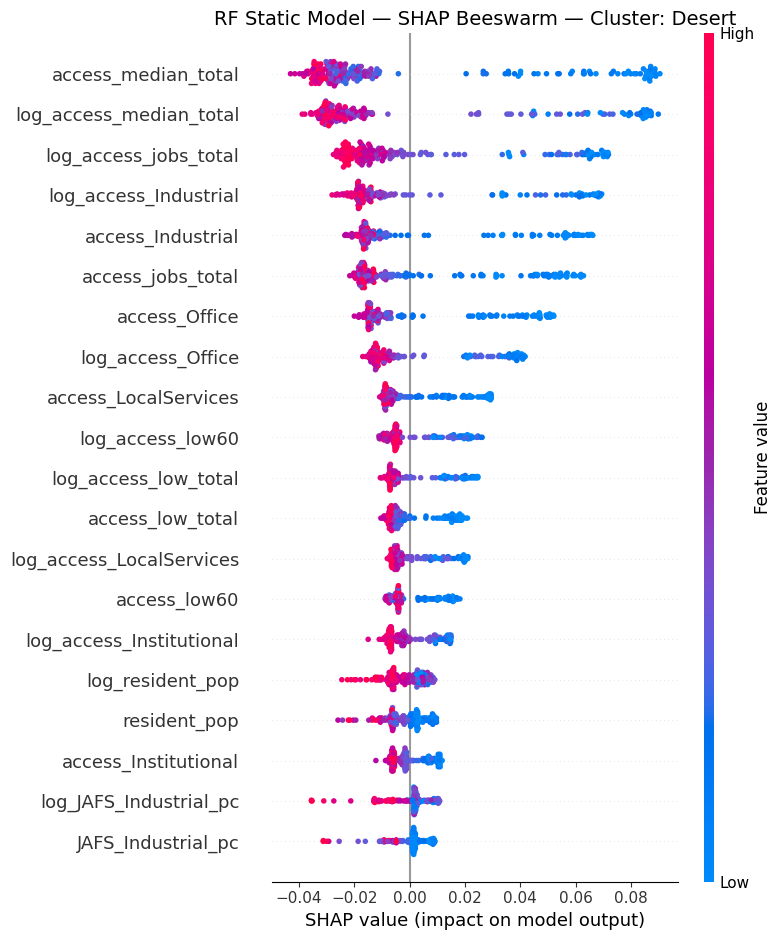

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_bar_static_Desert.png


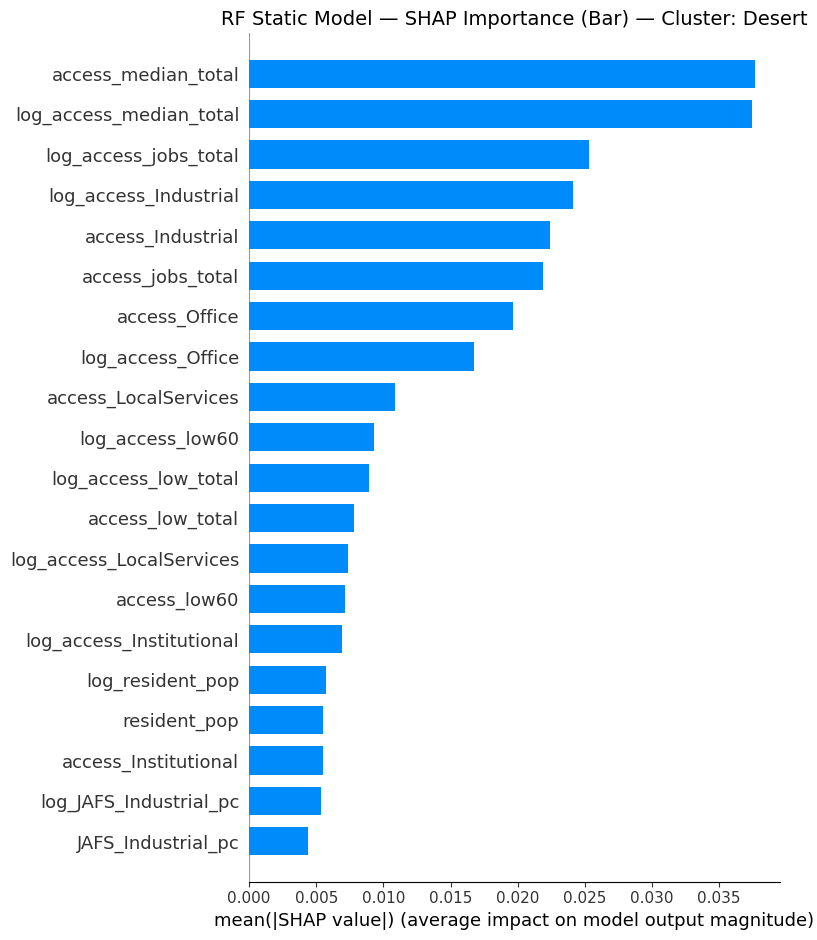


=== SHAP for cluster: HighOpp ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_beeswarm_static_HighOpp.png


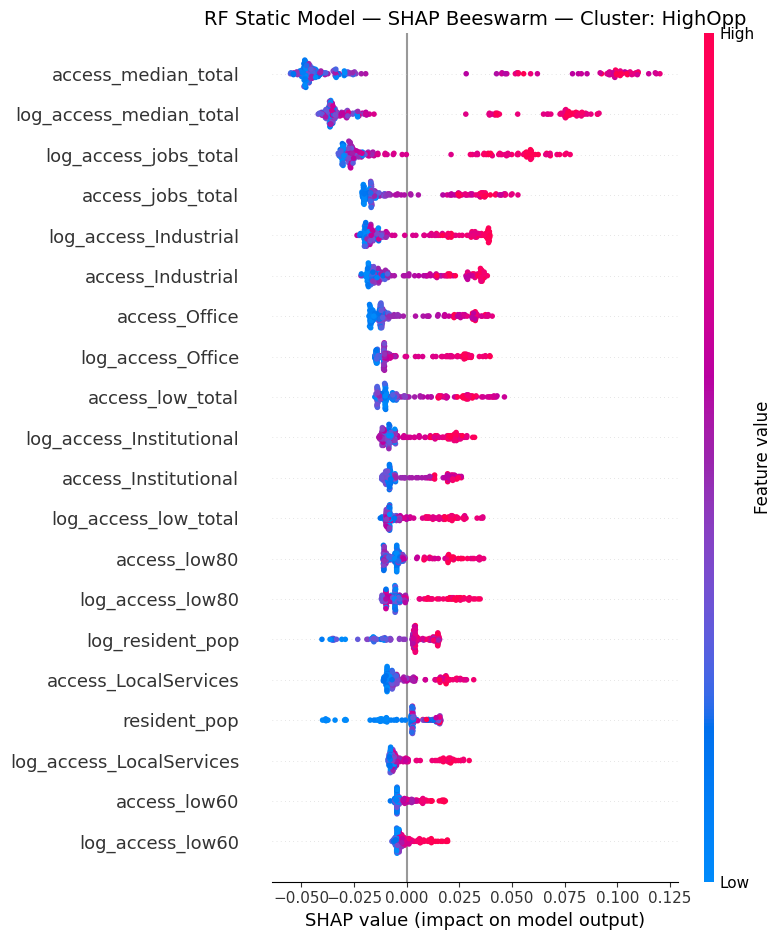

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_bar_static_HighOpp.png


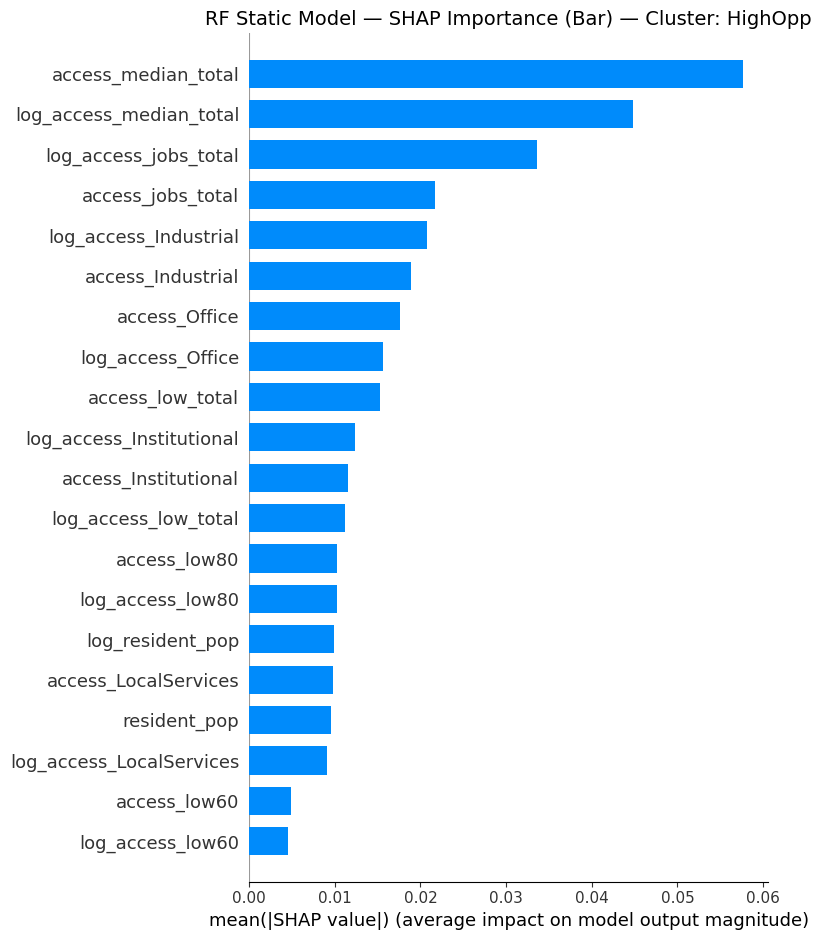


=== SHAP for cluster: Service ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_beeswarm_static_Service.png


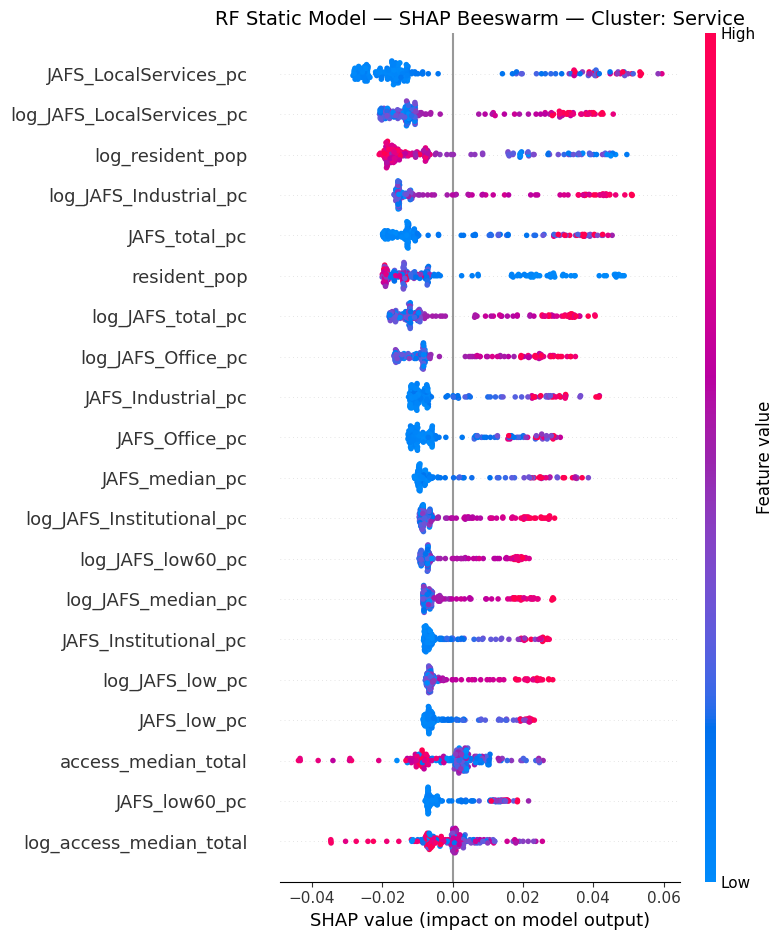

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_bar_static_Service.png


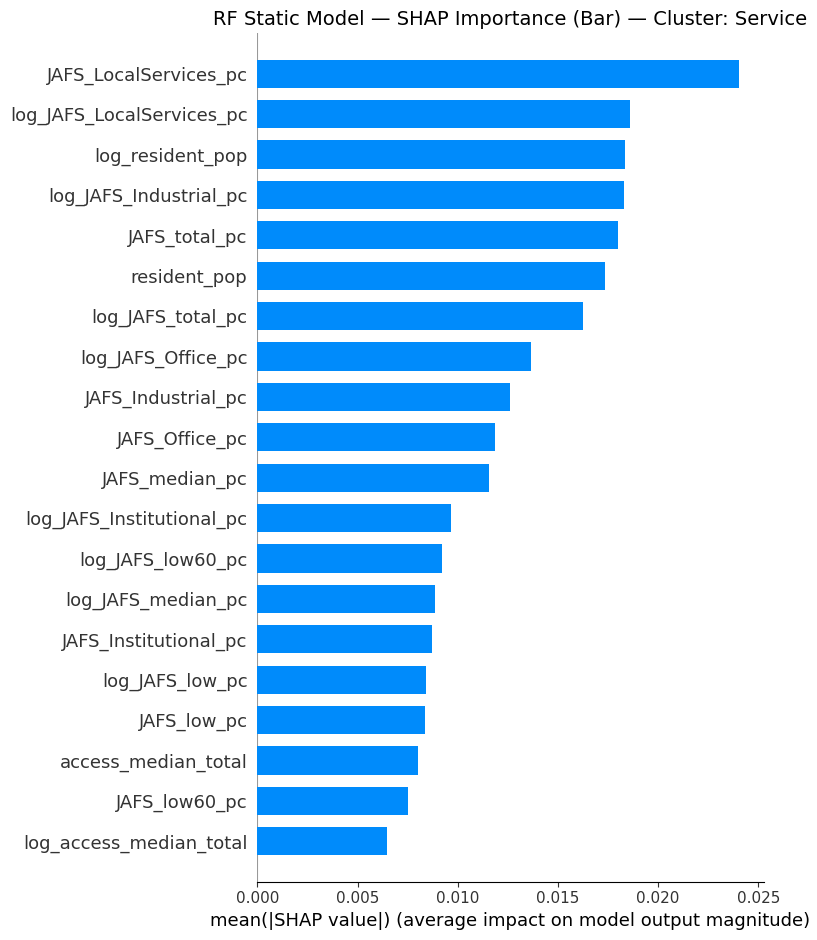


=== SHAP for cluster: Balanced ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_beeswarm_static_Balanced.png


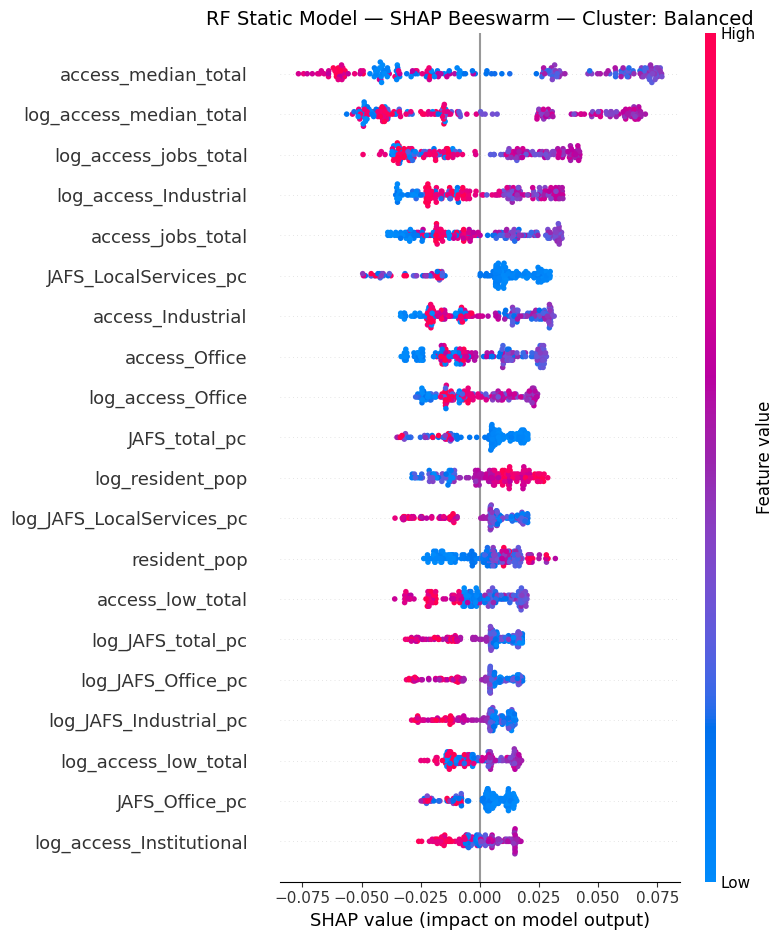

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/RF_static_cluster_plots/shap_bar_static_Balanced.png


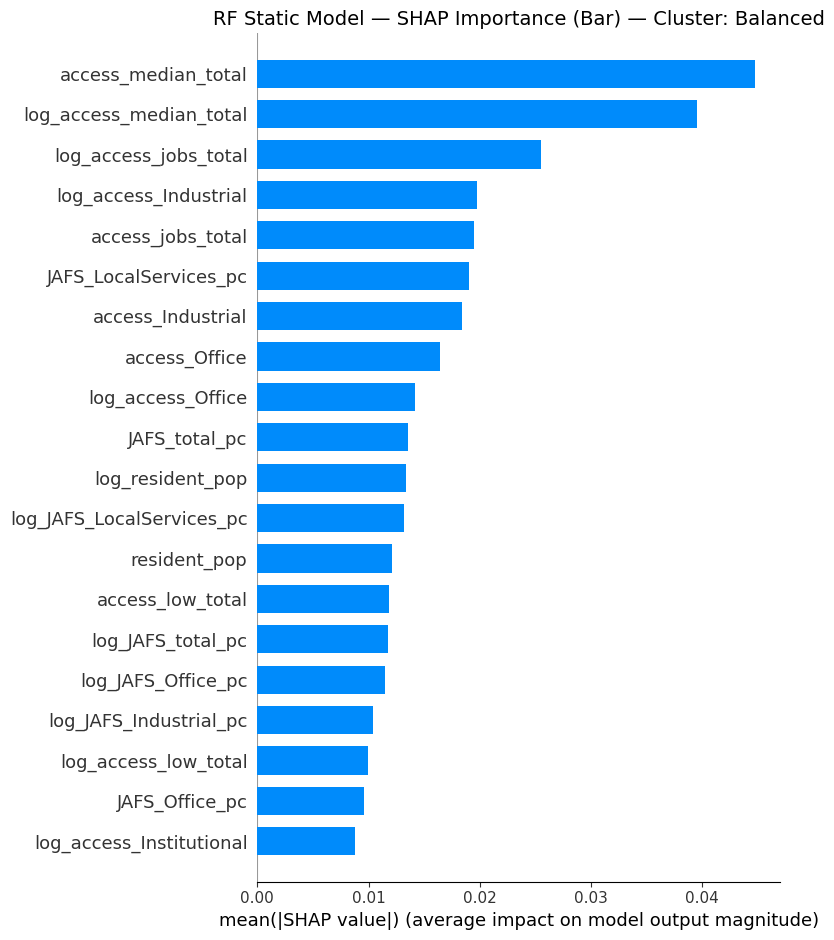

In [ ]:
folder_name = "RF_static_cluster_plots"
save_dir = os.path.join(base, folder_name)

os.makedirs(save_dir, exist_ok=True)
print("Saving SHAP plots to:", save_dir)


# ==========================================
# 2) 你的原本变量
# ==========================================
class_names = target_names    # ['HighOpp', 'Desert', 'Service', 'Balanced']

shap_values_raw = shap_exp_s.values     # (N, 48, 4)
X_sample = X_shap_s                     # same (N, 48)
feature_names = feature_names_s         # = static_cols


# ==========================================
# 3) Loop over clusters & 保存图像
# ==========================================
for cname in class_names:
    class_idx = class_names.index(cname)

    # SHAP values for this cluster (N, 48)
    shap_values_for_class = shap_values_raw[:, :, class_idx]

    print(f"\n=== SHAP for cluster: {cname} ===")

    # ------------------------------------------
    # 1) Beeswarm
    # ------------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        show=False
    )
    plt.title(f"RF Static Model — SHAP Beeswarm — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    beeswarm_path = os.path.join(save_dir, f"shap_beeswarm_static_{cname}.png")
    plt.savefig(beeswarm_path, dpi=300)
    print(f"Saved beeswarm → {beeswarm_path}")

    plt.show()

    # ------------------------------------------
    # 2) Bar plot
    # ------------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        plot_type="bar",
        show=False
    )
    plt.title(f"RF Static Model — SHAP Importance (Bar) — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    bar_path = os.path.join(save_dir, f"shap_bar_static_{cname}.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved bar → {bar_path}")

    plt.show()

#### SHAP for RF — Dynamic model

In [ ]:
df_full_dynamic.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125', 'emb_126',
       'emb_127', 'emb_128', 'dyn_cluster', 'dyn_cluster_type'],
      dtype='object', length=180)

In [ ]:
# 1) 把 embedding + dyn_cluster merge 回 2010–2022 panel
df_full_dynamic = df_panel.merge(
    df_embed,        # 包含 emb_* + dyn_cluster + h_tract
    on="h_tract",
    how="left"
)

print("df_full_dynamic shape:", df_full_dynamic.shape)
print(df_full_dynamic[["h_tract", "year"]].head())
# 这里行数应该是 ~ 4000+（≈ N_tracts * 13 years）

df_full_dynamic shape: (4147, 179)
       h_tract  year
0  36005000200  2010
1  36005000400  2010
2  36005001600  2010
3  36005001901  2010
4  36005002001  2010


In [ ]:
# A. 特征列
static_cols = [
    c for c in df_full_dynamic.columns
    if c not in ["h_tract", "year", "dyn_cluster", "dyn_cluster_type"]
    and not c.startswith("emb_")
]
embed_cols = [c for c in df_full_dynamic.columns if c.startswith("emb_")]

print("Static features:", len(static_cols))
print("Embedding features:", len(embed_cols))

# B. X, y
X_dynamic = df_full_dynamic[static_cols + embed_cols].values
y_dynamic = df_full_dynamic["dyn_cluster"].values

# C. train / test split
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(
    X_dynamic,
    y_dynamic,
    test_size=0.2,
    random_state=42,
    stratify=y_dynamic
)

# D. StandardScaler
scaler_d = StandardScaler()
X_train_d = scaler_d.fit_transform(X_train_d)
X_test_d = scaler_d.transform(X_test_d)

# E. Random Forest 动态模型
rf_d = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=10,
    random_state=42,
    n_jobs=-1,
)

rf_d.fit(X_train_d, y_train_d)
y_pred_d = rf_d.predict(X_test_d)

print("\n=== Random Forest (Dynamic, 2010–2022 panel) ===")
print("Accuracy:", accuracy_score(y_test_d, y_pred_d))

classes = np.sort(np.unique(y_train_d))
target_names = [mapping_dyn[c] for c in classes]
print("\nClassification report:")
print(classification_report(y_test_d, y_pred_d, labels=classes, target_names=target_names))

print("Confusion matrix:")
print(confusion_matrix(y_test_d, y_pred_d, labels=classes))

Static features: 48
Embedding features: 128

=== Random Forest (Dynamic, 2010–2022 panel) ===
Accuracy: 1.0

Classification report:
              precision    recall  f1-score   support

      Desert       1.00      1.00      1.00       174
     HighOpp       1.00      1.00      1.00       216
     Service       1.00      1.00      1.00       154
    Balanced       1.00      1.00      1.00       286

    accuracy                           1.00       830
   macro avg       1.00      1.00      1.00       830
weighted avg       1.00      1.00      1.00       830

Confusion matrix:
[[174   0   0   0]
 [  0 216   0   0]
 [  0   0 154   0]
 [  0   0   0 286]]


In [ ]:
df_full_dynamic.shape

(4147, 179)

##### sample = all 4147

In [ ]:
# 1) 特征名
feature_names_d = static_cols + embed_cols

# 2) 背景样本（用训练集）
X_bg_d = X_train_d

explainer_d = shap.Explainer(
    rf_d,
    X_bg_d,
    feature_names=feature_names_d
)

# 3) 对 2010–2022 全 panel 做 SHAP（样本非常多）
X_shap_d = scaler_d.transform(df_full_dynamic[static_cols + embed_cols].values)
shap_exp_d = explainer_d(X_shap_d)

print("shap_exp_d.values.shape:", shap_exp_d.values.shape)
# 预期: (N_panel ≈ 4000+,  F_dyn = 48+128=176,  4 classes)

100%|===================| 16518/16588 [03:40<00:00]       

shap_exp_d.values.shape: (4147, 176, 4)



=== Dynamic RF — SHAP for cluster: HighOpp ===


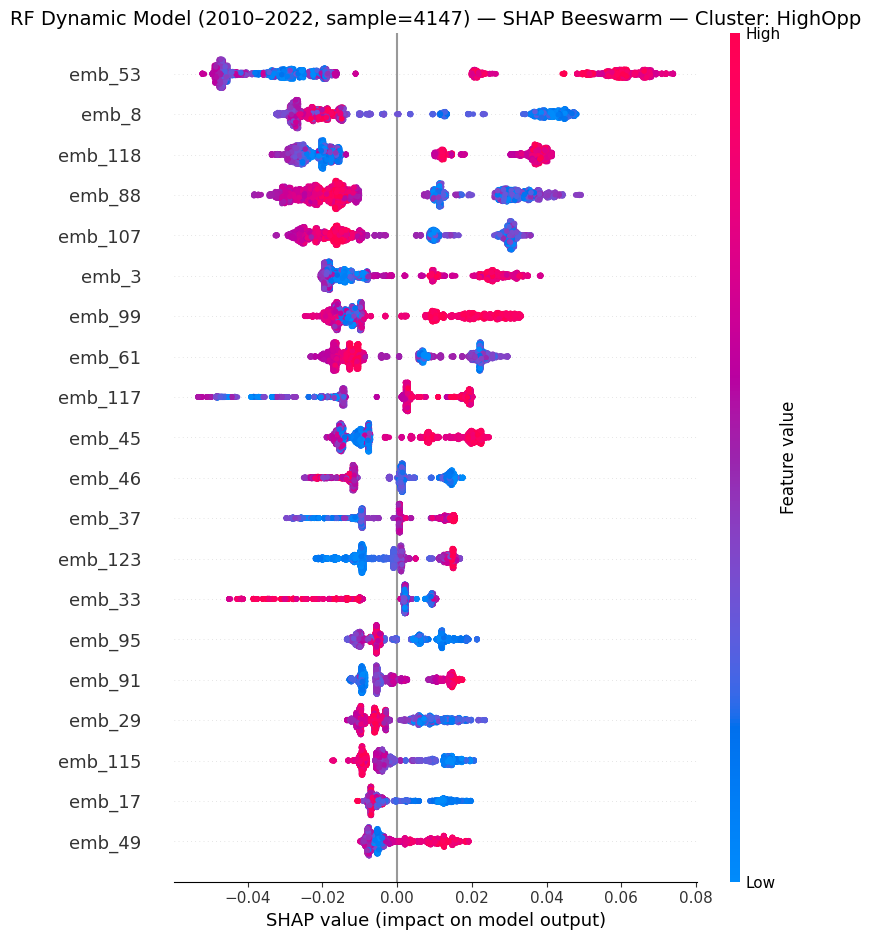

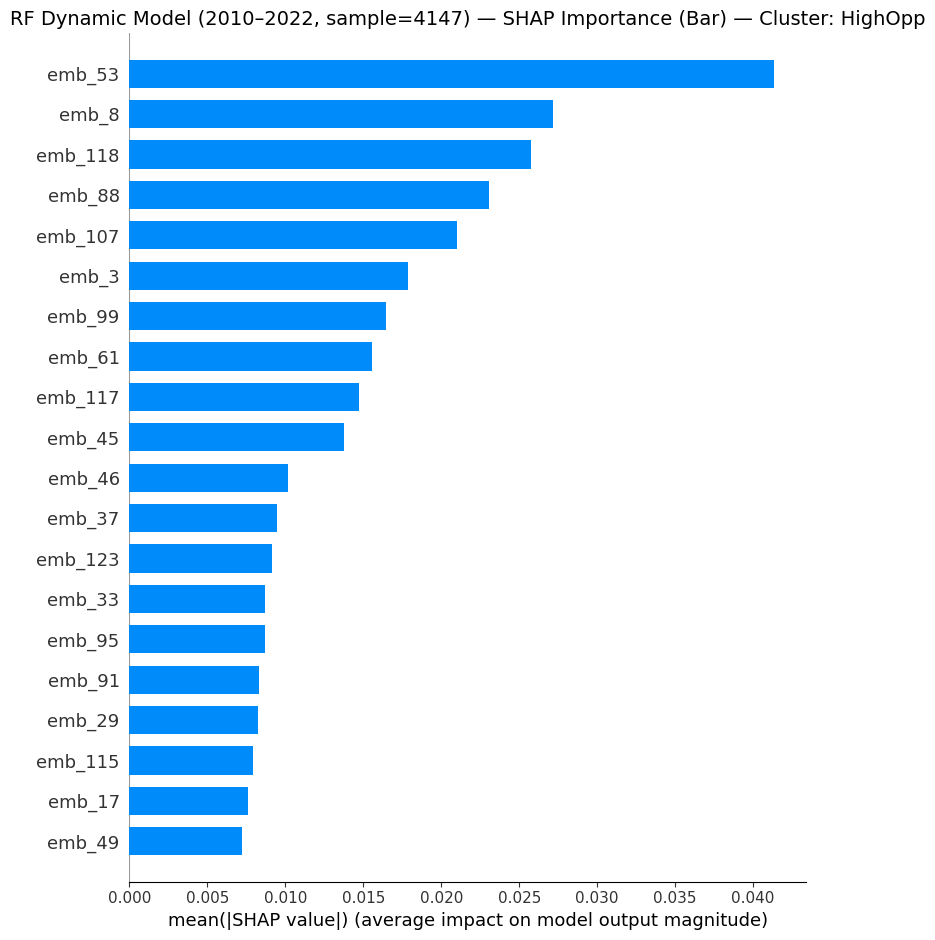


=== Dynamic RF — SHAP for cluster: Desert ===


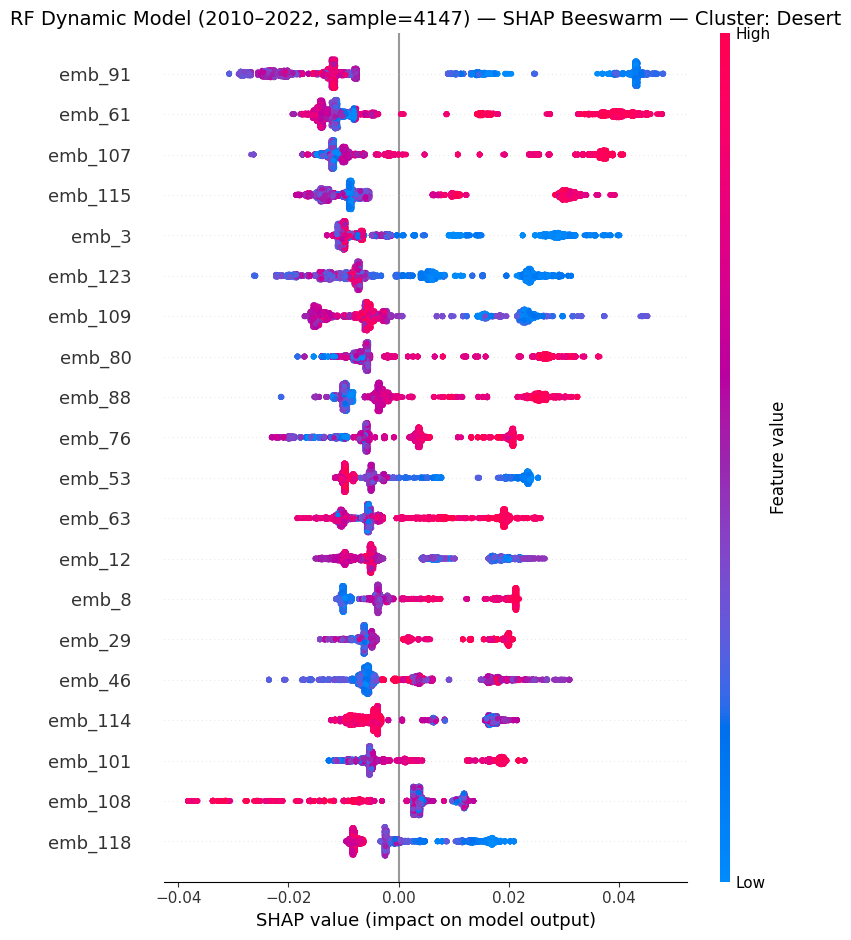

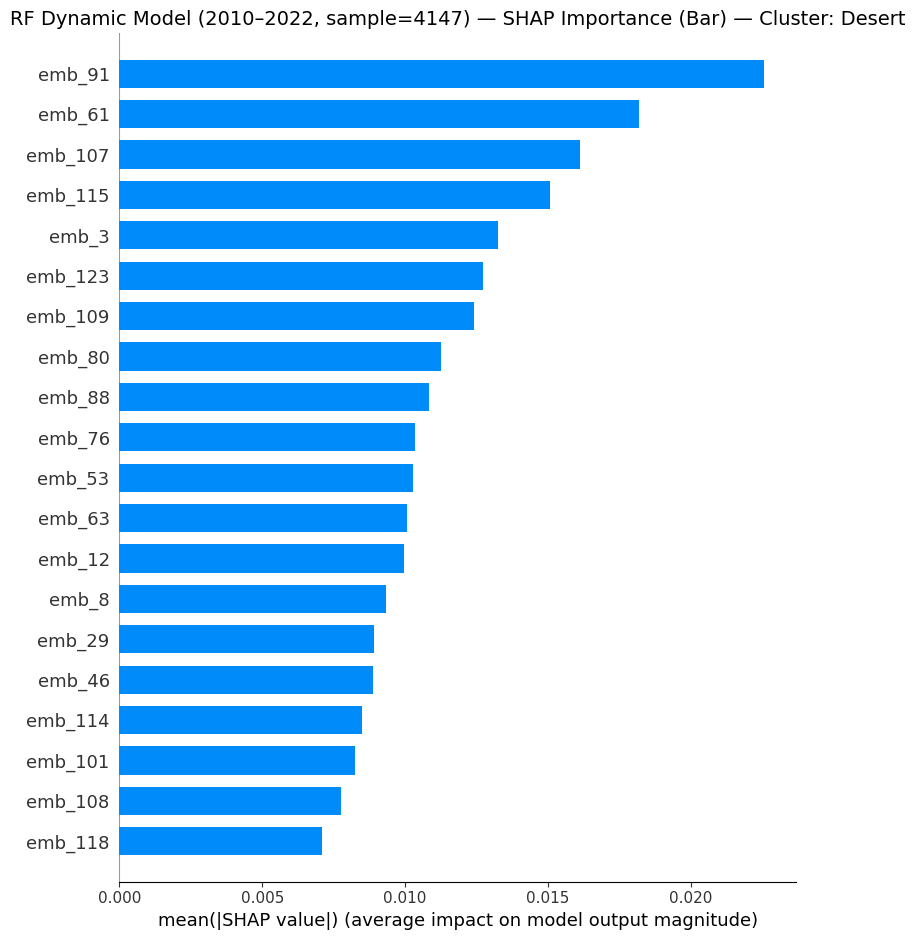


=== Dynamic RF — SHAP for cluster: Service ===


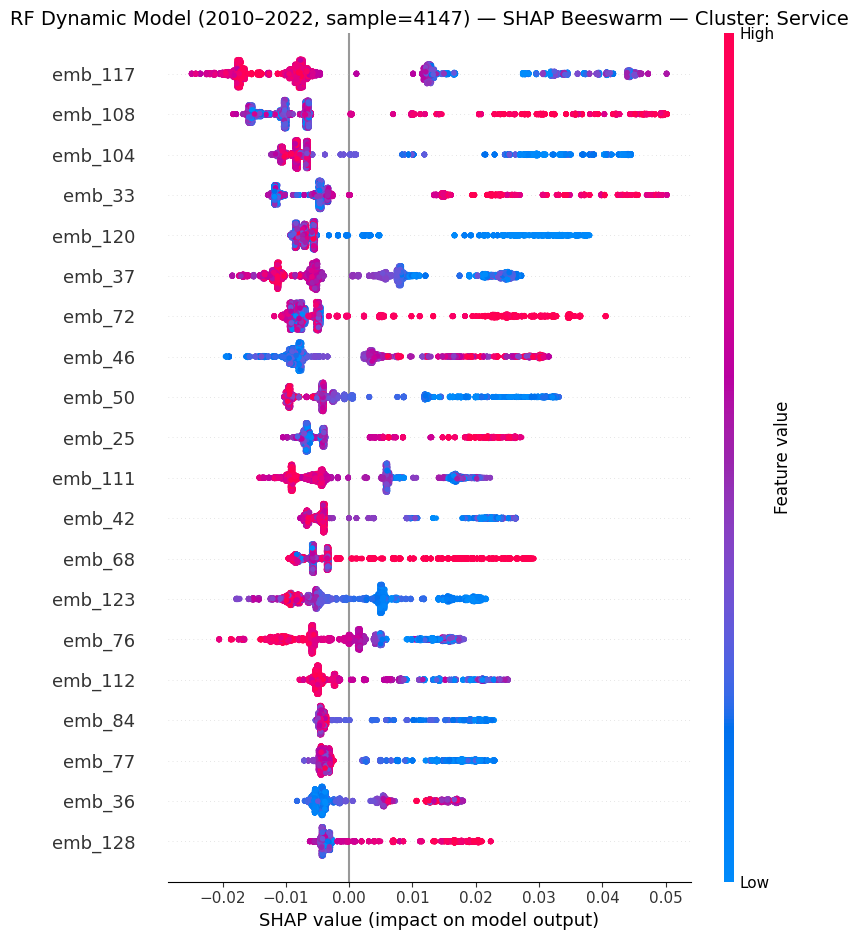

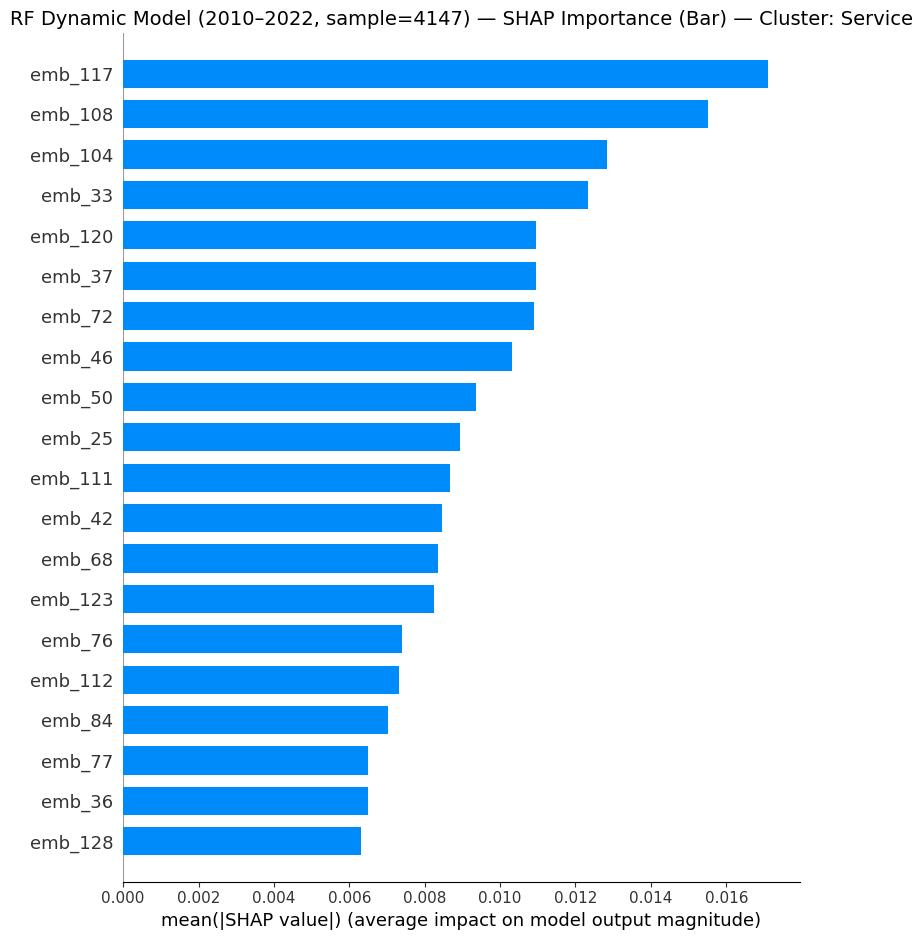


=== Dynamic RF — SHAP for cluster: Balanced ===


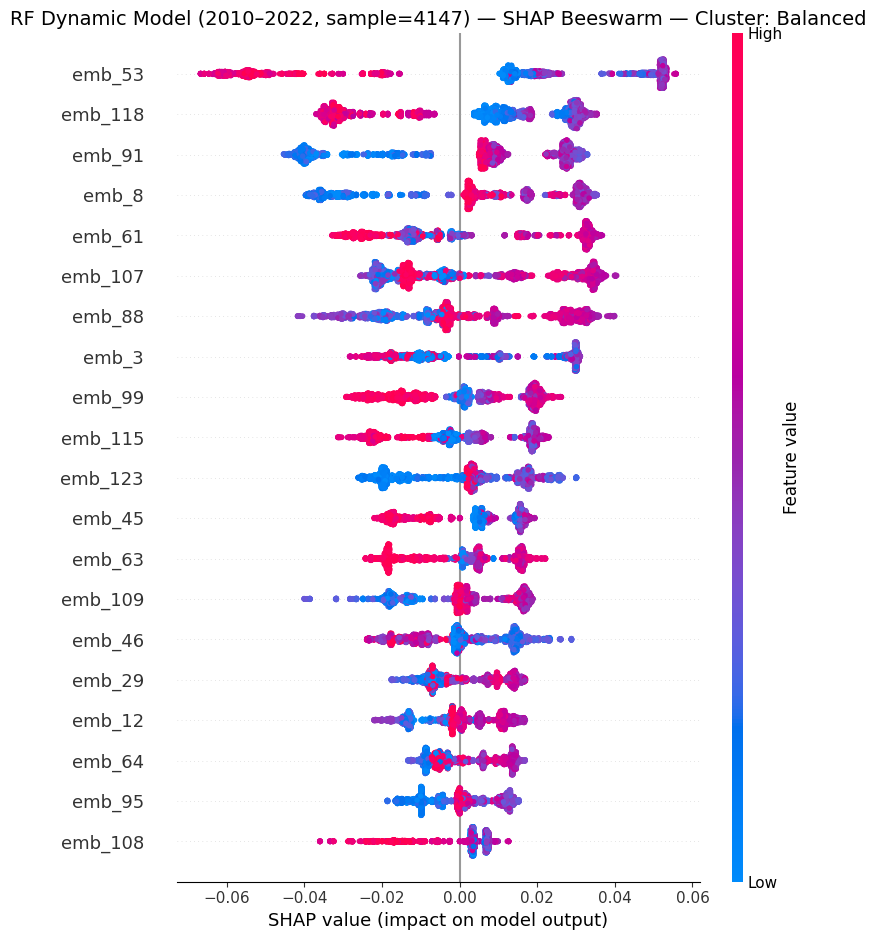

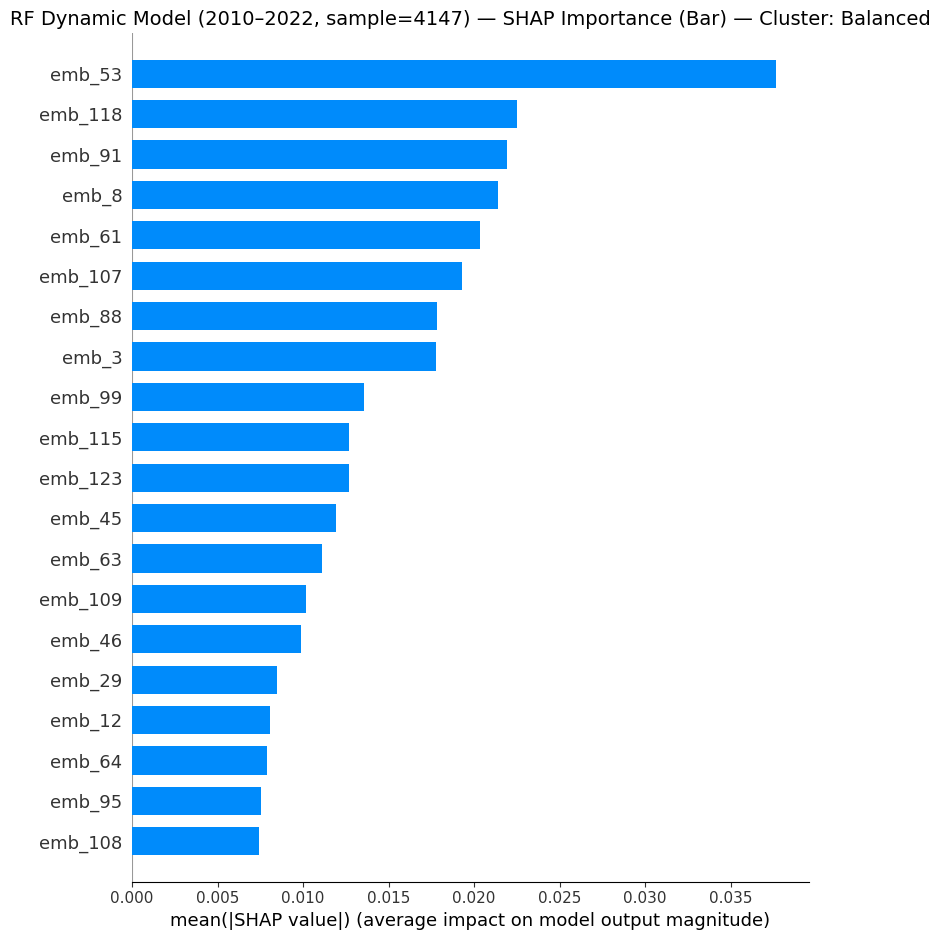

In [ ]:
# # class
# class_names = target_names    # ['HighOpp', 'Desert', 'Service', 'Balanced']

# # shap values: (N_sample, F_dyn, 4)
# shap_values_raw = shap_exp_d.values

# X_sample = X_shap_d           # (N_sample, F_dyn)
# feature_names = feature_names_d

# for cname in class_names:
#     class_idx = class_names.index(cname)

#     # 该 cluster 的 SHAP 值：(N_sample, F_dyn)
#     shap_values_for_class = shap_values_raw[:, :, class_idx]

#     print(f"\n=== Dynamic RF — SHAP for cluster: {cname} ===")

#     # 1️⃣ Beeswarm
#     plt.figure(figsize=(10, 6))
#     shap.summary_plot(
#         shap_values_for_class,
#         X_sample,
#         feature_names=feature_names,
#         show=False
#     )
#     plt.title(
#         f"RF Dynamic Model (2010–2022, sample={X_sample.shape[0]}) — "
#         f"SHAP Beeswarm — Cluster: {cname}",
#         fontsize=14
#     )
#     plt.tight_layout()
#     plt.show()

#     # 2️⃣ Bar plot
#     plt.figure(figsize=(10, 6))
#     shap.summary_plot(
#         shap_values_for_class,
#         X_sample,
#         feature_names=feature_names,
#         plot_type="bar",
#         show=False
#     )
#     plt.title(
#         f"RF Dynamic Model (2010–2022, sample={X_sample.shape[0]}) — "
#         f"SHAP Importance (Bar) — Cluster: {cname}",
#         fontsize=14
#     )
#     plt.tight_layout()
#     plt.show()

In [ ]:
X_shap_d.shape

(4147, 176)

In [ ]:
X_bg_d.shape

(3317, 176)

##### sample size  = 1000

In [ ]:
# 3) 对 2010–2022 全 panel 做 SHAP（只抽样 1000 行）
X_all_d = scaler_d.transform(df_full_dynamic[static_cols + embed_cols].values)

# 随机抽样 1000（如果总样本不足 1000 则取全部）
sample_size = min(1000, X_all_d.shape[0])
idx_sample = np.random.choice(X_all_d.shape[0], sample_size, replace=False)

X_shap_d = X_all_d[idx_sample]

# 计算 SHAP（基于 sample）
shap_exp_d = explainer_d(X_shap_d)

print("X_shap_d shape:", X_shap_d.shape)
print("shap_exp_d.values.shape:", shap_exp_d.values.shape)

100%|===================| 3980/4000 [00:53<00:00]       

X_shap_d shape: (1000, 176)
shap_exp_d.values.shape: (1000, 176, 4)



=== Dynamic RF — SHAP for cluster: Desert ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_beeswarm_dynamic_Desert.png


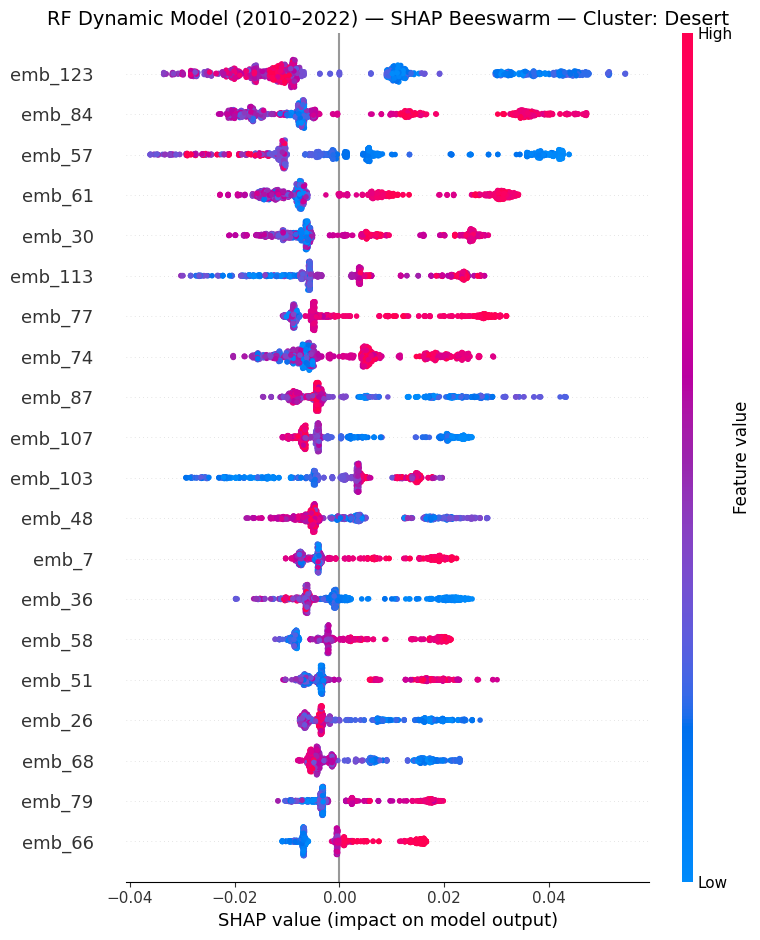

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_bar_dynamic_Desert.png


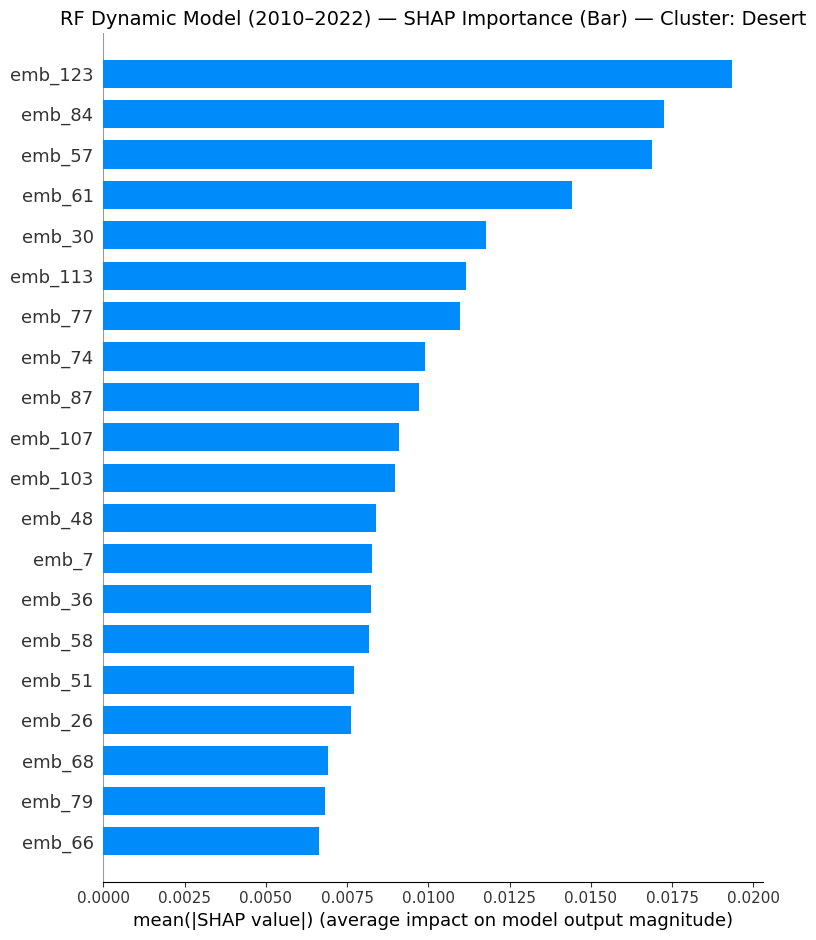


=== Dynamic RF — SHAP for cluster: HighOpp ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_beeswarm_dynamic_HighOpp.png


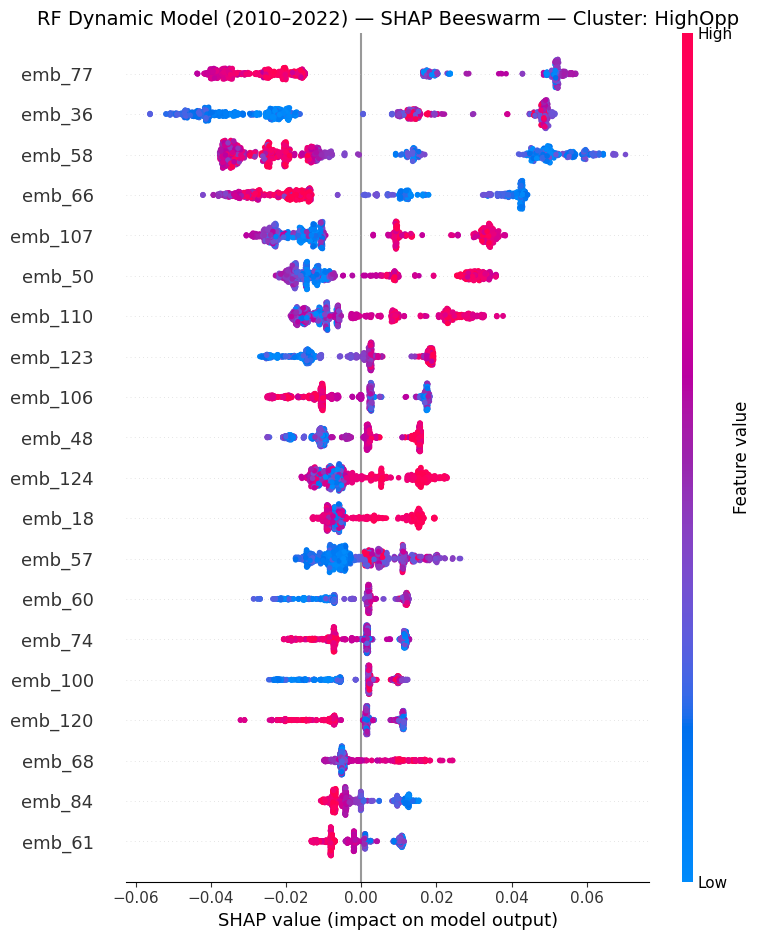

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_bar_dynamic_HighOpp.png


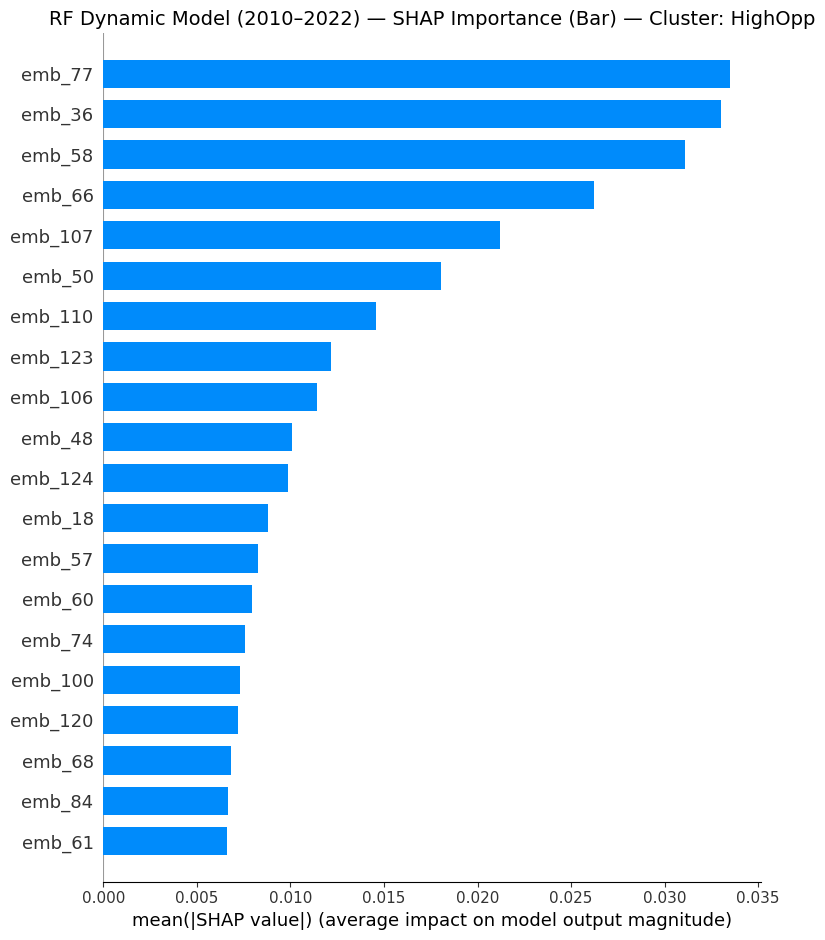


=== Dynamic RF — SHAP for cluster: Service ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_beeswarm_dynamic_Service.png


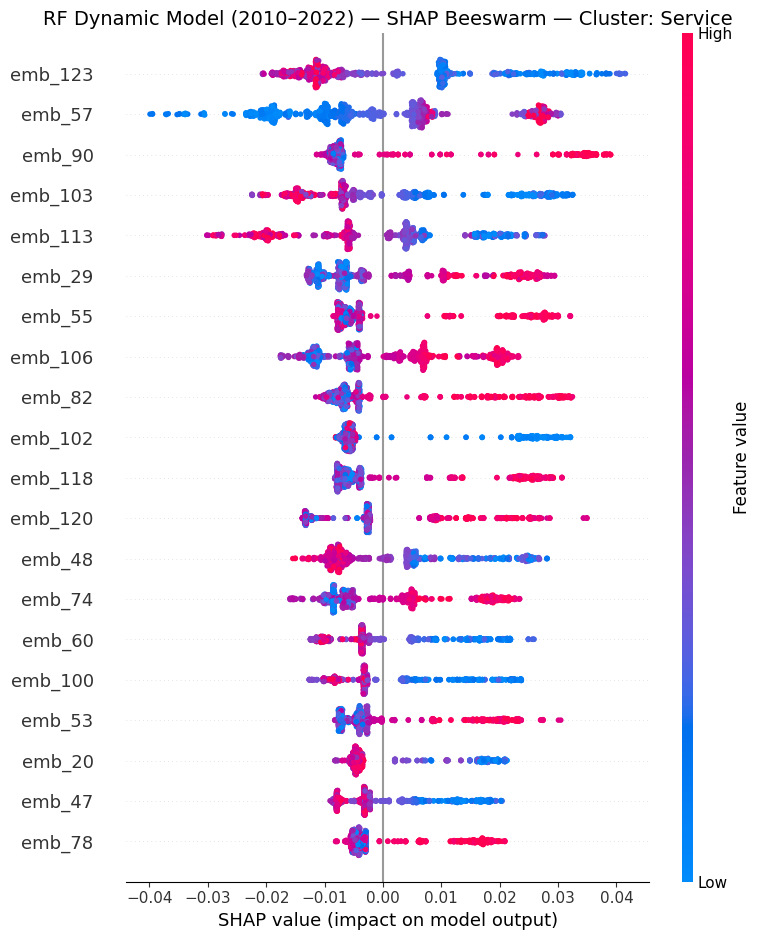

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_bar_dynamic_Service.png


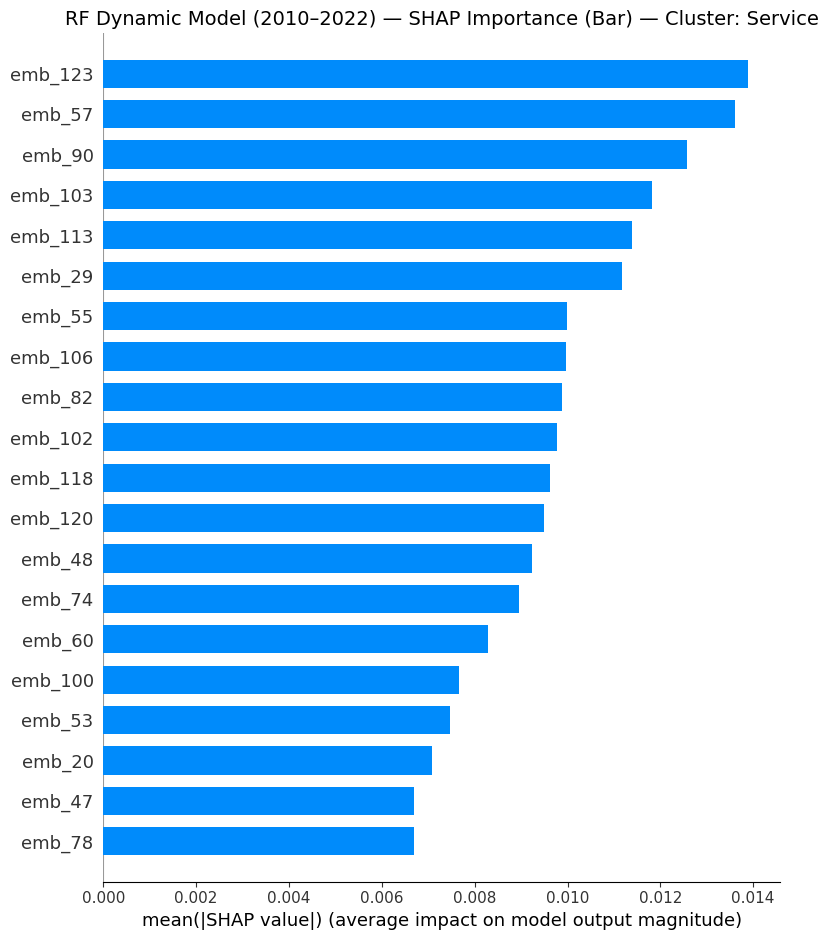


=== Dynamic RF — SHAP for cluster: Balanced ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_beeswarm_dynamic_Balanced.png


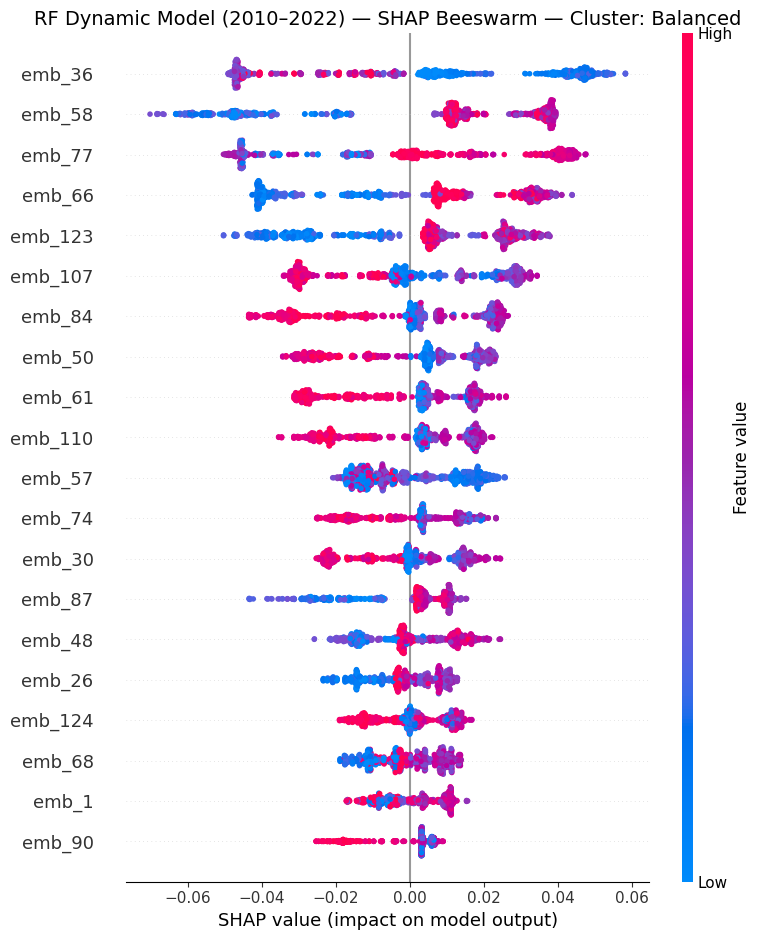

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/RF_dynamic_cluster_plots/shap_bar_dynamic_Balanced.png


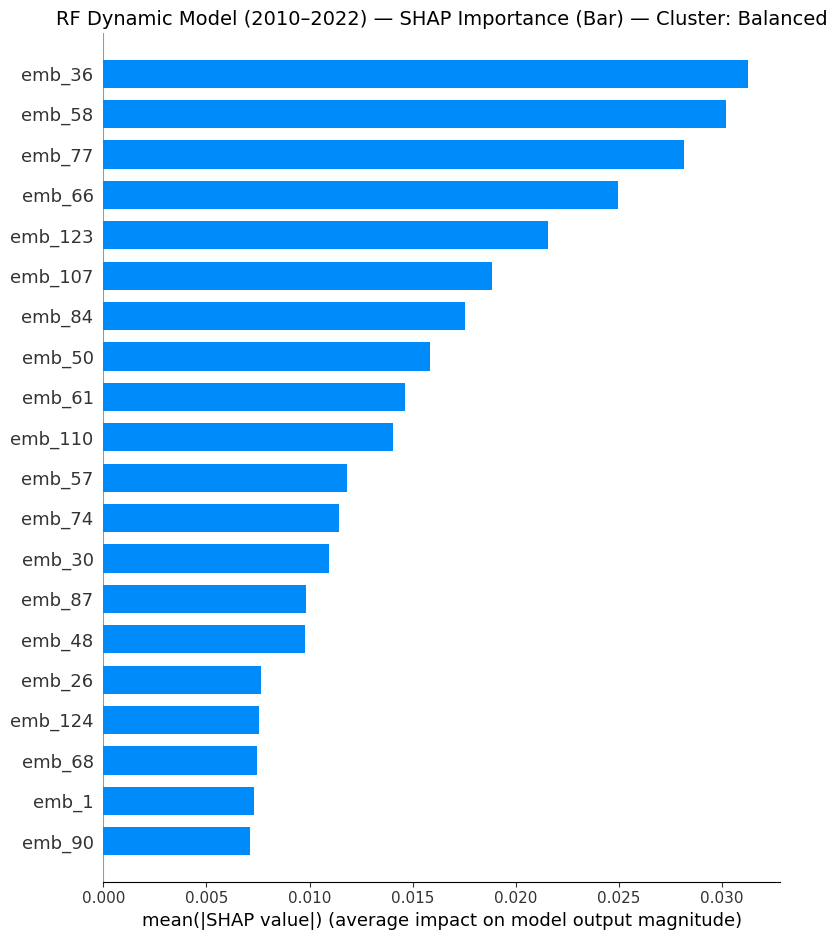

In [ ]:
# 子文件夹名称
folder_name = "RF_dynamic_cluster_plots"

# 拼接完整路径
save_dir = os.path.join(base, folder_name)

# 创建最终保存目录
os.makedirs(save_dir, exist_ok=True)



# class 名称（与 static 一样）
class_names = target_names    # ['HighOpp', 'Desert', 'Service', 'Balanced']

# shap values: (N_sample, F_dyn, 4)
shap_values_raw = shap_exp_d.values

X_sample = X_shap_d           # (N_sample, F_dyn)
feature_names = feature_names_d

for cname in class_names:
    class_idx = class_names.index(cname)

    # 该 cluster 的 SHAP 值：(N_sample, F_dyn)
    shap_values_for_class = shap_values_raw[:, :, class_idx]

    print(f"\n=== Dynamic RF — SHAP for cluster: {cname} ===")

    # -----------------------------------------
    # 1️⃣ Beeswarm  (保存文件)
    # -----------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        show=False
    )
    plt.title(
        f"RF Dynamic Model (2010–2022) — "
        f"SHAP Beeswarm — Cluster: {cname}",
        fontsize=14
    )
    plt.tight_layout()

    # 保存 PNG
    beeswarm_path = os.path.join(save_dir, f"shap_beeswarm_dynamic_{cname}.png")
    plt.savefig(beeswarm_path, dpi=300)
    print(f"Saved beeswarm plot → {beeswarm_path}")

    plt.show()

    # -----------------------------------------
    # 2️⃣ Bar plot (保存文件)
    # -----------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        plot_type="bar",
        show=False
    )
    plt.title(
        f"RF Dynamic Model (2010–2022) — "
        f"SHAP Importance (Bar) — Cluster: {cname}",
        fontsize=14
    )
    plt.tight_layout()

    # 保存 PNG
    bar_path = os.path.join(save_dir, f"shap_bar_dynamic_{cname}.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved bar plot → {bar_path}")

    plt.show()

#### RADAR

In [ ]:
# 1. Aggregate SHAP values ​​by variable group (mean |SHAP|)
def grouped_shap_mean_abs(shap_values_2d, feature_names, groups_dict):
    """
    shap_values_2d: (N, F) for 某一个 cluster 的 SHAP
    feature_names: list of length F
    groups_dict: {group_name: [var1, var2, ...]}

    return: dict {group_name: mean(|SHAP|) 的总和}
    """
    mean_abs = np.mean(np.abs(shap_values_2d), axis=0)  # (F,)
    name_to_idx = {name: i for i, name in enumerate(feature_names)}

    group_scores = {}
    for gname, vars_list in groups_dict.items():
        idxs = [name_to_idx[v] for v in vars_list if v in name_to_idx]
        if len(idxs) == 0:
            group_scores[gname] = 0.0
        else:
            group_scores[gname] = float(mean_abs[idxs].sum())
    return group_scores

HighOpp

In [ ]:
# 2. Extract the 2D matrix of "a certain cluster" from SHAP.
# 选择 cluster
cluster_name = "HighOpp"    # 改成 "Service" / "Desert" / "Balanced" 也可以
k = target_names.index(cluster_name)

# Static SHAP: (N_s, F_s, 4)
shap_values_s_k = shap_exp_s.values[:, :, k]             # (N_s, F_s)
feature_names_s = static_cols                            # 只包含静态特征

# Dynamic SHAP: 用 sample 的那份 (1000, F_d, 4) 或 full
shap_values_d_k = shap_exp_d.values[:, :, k]             # (N_d, F_d)
feature_names_d = static_cols + embed_cols               # 包含静态 + embedding

In [ ]:
# 3. Calculate SHAP values ​​for each group: Static vs. Dynamic (only using static features from the Dynamic group).
groups = {
    "JobAccess": job_access_vars,
    "Industry":  industry_vars,
    "Skills":    skill_vars,
    "JAFS":      jafs_vars,
}

# Static：直接按 feature_names_s 聚合
group_scores_static = grouped_shap_mean_abs(
    shap_values_s_k,
    feature_names_s,
    groups
)

# Dynamic：只聚合 static 部分（用 feature_names_d 但 groups 里都是 log_* 名称）
group_scores_dynamic = grouped_shap_mean_abs(
    shap_values_d_k,
    feature_names_d,    # 这里面既有 static 也有 emb_，我们只会用到 static 那些名字
    groups
)

print("Static group scores:", group_scores_static)
print("Dynamic group scores:", group_scores_dynamic)

Static group scores: {'JobAccess': 0.10143008484907087, 'Industry': 0.057897161528682455, 'Skills': 0.015907538422560367, 'JAFS': 0.026512157086392235}
Dynamic group scores: {'JobAccess': 0.00010986144877808511, 'Industry': 0.0005030964317541649, 'Skills': 0.00010819339118879769, 'JAFS': 0.0006280150139009504}


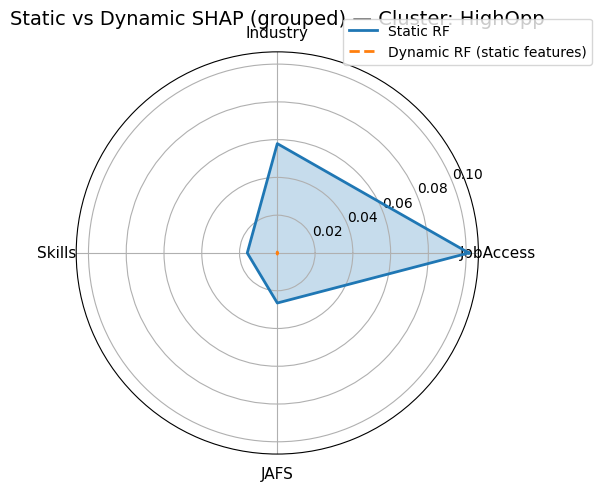

In [ ]:
# 4. Drawing a Radar Chart: Static vs. Dynamic (Four Axes)
# 轴名称 & 顺序
labels = list(groups.keys())   # ["JobAccess", "Industry", "Skills", "JAFS"]
num_vars = len(labels)

# 对齐 static & dynamic 的数组顺序
values_static = [group_scores_static[l] for l in labels]
values_dynamic = [group_scores_dynamic[l] for l in labels]

# 为了闭合雷达图，首尾拼接
values_static += values_static[:1]
values_dynamic += values_dynamic[:1]

angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

# 画 static（可换颜色 / alpha）
ax.plot(angles, values_static, linewidth=2, linestyle='solid', label='Static RF')
ax.fill(angles, values_static, alpha=0.25)

# 画 dynamic（只用 static features 的贡献）
ax.plot(angles, values_dynamic, linewidth=2, linestyle='dashed', label='Dynamic RF (static features)')
ax.fill(angles, values_dynamic, alpha=0.25)

# 设置刻度 & 标签
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=11)

# 可选：归一化刻度，让图更对比清楚
# ax.set_ylim(0, max(max(values_static), max(values_dynamic)) * 1.1)

ax.set_title(f"Static vs Dynamic SHAP (grouped) — Cluster: {cluster_name}", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout()
plt.show()

In [ ]:
group_scores_static = grouped_shap_mean_abs(
    shap_values_s_k,
    feature_names_s,
    groups
)

group_scores_dynamic = grouped_shap_mean_abs(
    shap_values_d_k,
    feature_names_d,
    groups
)

In [ ]:
labels = list(groups.keys())   # ["JobAccess", "Industry", "Skills", "JAFS"]

# 原始值 → 数组
vals_static_raw  = np.array([group_scores_static[l]  for l in labels], dtype=float)
vals_dynamic_raw = np.array([group_scores_dynamic[l] for l in labels], dtype=float)

# 防止全 0 的情况
sum_static  = vals_static_raw.sum()
sum_dynamic = vals_dynamic_raw.sum()

if sum_static > 0:
    vals_static_norm = vals_static_raw / sum_static
else:
    vals_static_norm = np.zeros_like(vals_static_raw)

if sum_dynamic > 0:
    vals_dynamic_norm = vals_dynamic_raw / sum_dynamic
else:
    vals_dynamic_norm = np.zeros_like(vals_dynamic_raw)

print("Static normalized:", vals_static_norm)
print("Dynamic normalized:", vals_dynamic_norm)

Static normalized: [0.50275897 0.28697913 0.07884897 0.13141293]
Dynamic normalized: [0.08142914 0.37289431 0.08019278 0.46548377]


Saving radar charts to: /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots
Saved radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots/radar_SHAP_HighOpp.png


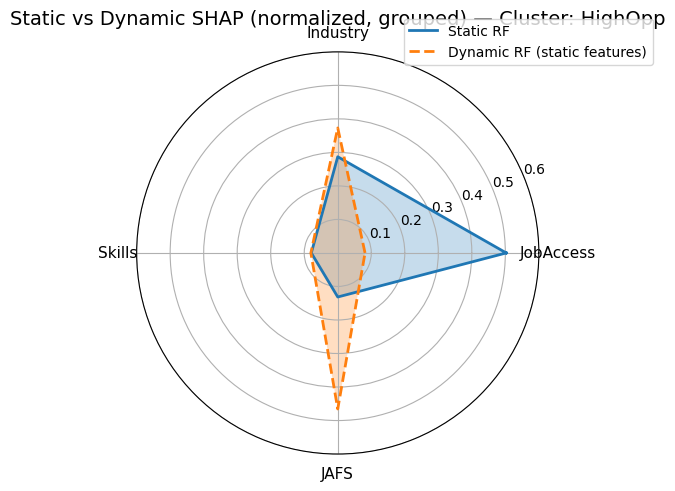

In [ ]:
folder_name = "RF_radar_plots"
save_dir = os.path.join(base, folder_name)

os.makedirs(save_dir, exist_ok=True)
print("Saving radar charts to:", save_dir)


# ==========================================
# 2) 原始你的 radar chart 代码（加入保存）
# ==========================================

values_static  = vals_static_norm.tolist()
values_dynamic = vals_dynamic_norm.tolist()

values_static  += values_static[:1]
values_dynamic += values_dynamic[:1]

num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

# Static
ax.plot(angles, values_static, linewidth=2, linestyle='solid', label='Static RF')
ax.fill(angles, values_static, alpha=0.25)

# Dynamic（只看 static 部分）
ax.plot(angles, values_dynamic, linewidth=2, linestyle='dashed', label='Dynamic RF (static features)')
ax.fill(angles, values_dynamic, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=11)

ax.set_ylim(0, 0.6)

ax.set_title(
    f"Static vs Dynamic SHAP (normalized, grouped) — Cluster: {cluster_name}",
    fontsize=14,
    pad=20
)
ax.legend(loc='lower right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout()

# ------------------------------------------
# 3) 保存 PNG 文件
# ------------------------------------------
save_path = os.path.join(save_dir, f"radar_SHAP_{cluster_name}.png")
plt.savefig(save_path, dpi=300)

print(f"Saved radar chart → {save_path}")

plt.show()

Saving radar charts to: /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots

=== Radar for cluster: Desert ===
  Static normalized: [0.46298934 0.32383026 0.07425908 0.13892131]
  Dynamic normalized: [0.24777911 0.39309403 0.1119586  0.24716826]
  Saved radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots/radar_SHAP_Desert.png


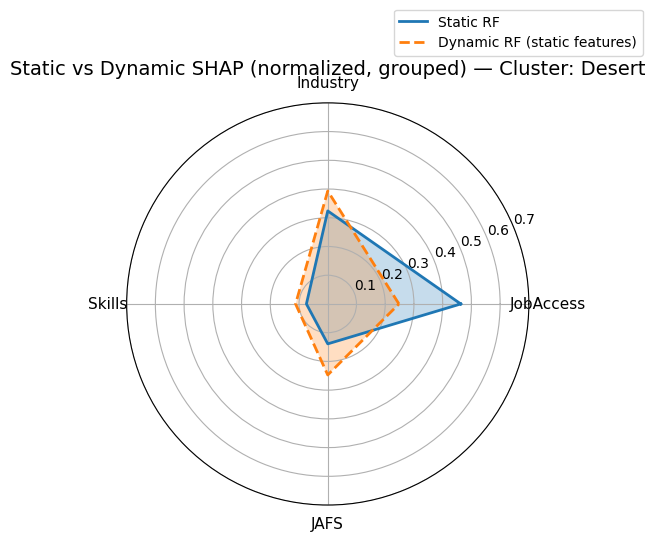


=== Radar for cluster: HighOpp ===
  Static normalized: [0.50275897 0.28697913 0.07884897 0.13141293]
  Dynamic normalized: [0.08142914 0.37289431 0.08019278 0.46548377]
  Saved radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots/radar_SHAP_HighOpp.png


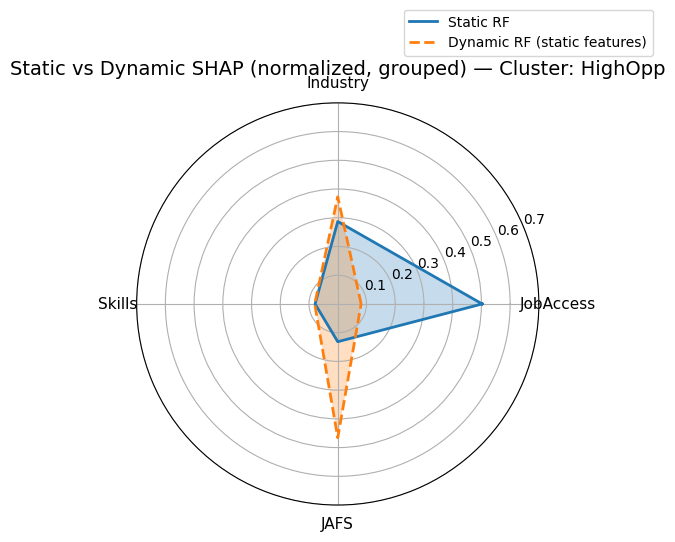


=== Radar for cluster: Service ===
  Static normalized: [0.20450661 0.08502835 0.02126147 0.68920358]
  Dynamic normalized: [0.10622096 0.3299251  0.02937709 0.53447685]
  Saved radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots/radar_SHAP_Service.png


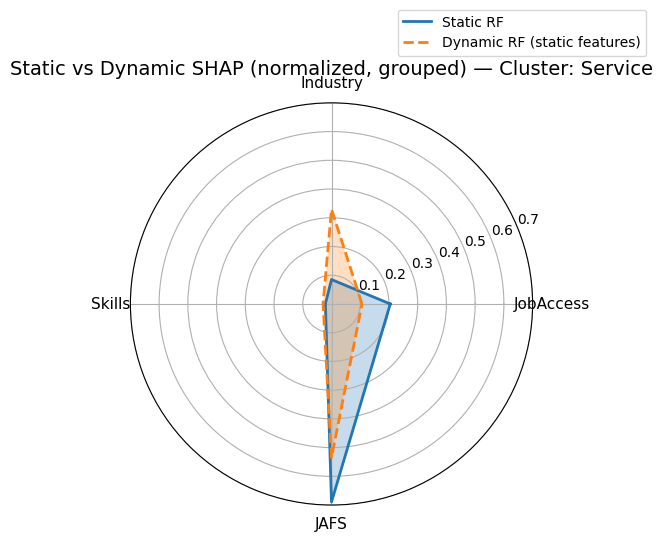


=== Radar for cluster: Balanced ===
  Static normalized: [0.39302077 0.21600121 0.07551363 0.31546438]
  Dynamic normalized: [0.13824211 0.26226598 0.07014051 0.5293514 ]
  Saved radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/RF_radar_plots/radar_SHAP_Balanced.png


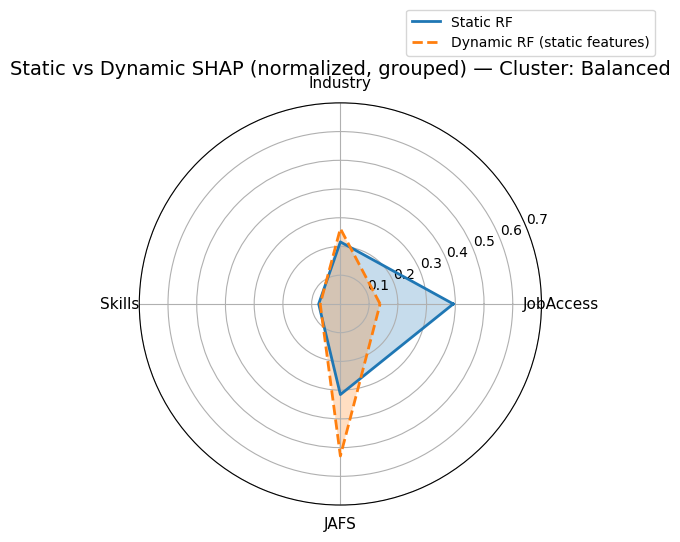

In [ ]:
# 1. 分组定义（你已有）
groups = {
    "JobAccess": job_access_vars,
    "Industry":  industry_vars,
    "Skills":    skill_vars,
    "JAFS":      jafs_vars,
}
labels = list(groups.keys())   # ["JobAccess", "Industry", "Skills", "JAFS"]

# 2. 输出文件夹
folder_name = "RF_radar_plots"
save_dir = os.path.join(base, folder_name)
os.makedirs(save_dir, exist_ok=True)
print("Saving radar charts to:", save_dir)

# 3. 对四个 cluster 逐个画图
for cluster_name in target_names:   # e.g. 'HighOpp','Desert','Service','Balanced'
    print(f"\n=== Radar for cluster: {cluster_name} ===")
    k = target_names.index(cluster_name)

    # --- Static SHAP for this cluster ---
    shap_values_s_k = shap_exp_s.values[:, :, k]          # (N_s, F_s)
    feature_names_s = static_cols

    # --- Dynamic SHAP for this cluster ---
    shap_values_d_k = shap_exp_d.values[:, :, k]          # (N_d, F_d)
    feature_names_d = static_cols + embed_cols            # static + emb

    # --- 按四大组聚合 SHAP（绝对值均值求和） ---
    group_scores_static = grouped_shap_mean_abs(
        shap_values_s_k,
        feature_names_s,
        groups
    )

    group_scores_dynamic = grouped_shap_mean_abs(
        shap_values_d_k,
        feature_names_d,   # 这里面既有 static 也有 emb_，但 groups 只会匹配 log_* 名称
        groups
    )

    # --- 转成向量，并做归一化（和 = 1） ---
    vals_static_raw  = np.array([group_scores_static[l]  for l in labels], dtype=float)
    vals_dynamic_raw = np.array([group_scores_dynamic[l] for l in labels], dtype=float)

    sum_static  = vals_static_raw.sum()
    sum_dynamic = vals_dynamic_raw.sum()

    if sum_static > 0:
        vals_static_norm = vals_static_raw / sum_static
    else:
        vals_static_norm = np.zeros_like(vals_static_raw)

    if sum_dynamic > 0:
        vals_dynamic_norm = vals_dynamic_raw / sum_dynamic
    else:
        vals_dynamic_norm = np.zeros_like(vals_dynamic_raw)

    print("  Static normalized:", vals_static_norm)
    print("  Dynamic normalized:", vals_dynamic_norm)

    # --- 为雷达图准备闭合数据 ---
    values_static  = vals_static_norm.tolist()
    values_dynamic = vals_dynamic_norm.tolist()

    values_static  += values_static[:1]
    values_dynamic += values_dynamic[:1]

    num_vars = len(labels)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # --- 画雷达图 ---
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Static 曲线
    ax.plot(angles, values_static, linewidth=2, linestyle='solid', label='Static RF')
    ax.fill(angles, values_static, alpha=0.25)

    # Dynamic 曲线（只看 static 特征的 SHAP）
    ax.plot(angles, values_dynamic, linewidth=2, linestyle='dashed',
            label='Dynamic RF (static features)')
    ax.fill(angles, values_dynamic, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=11)

    ax.set_ylim(0, 0.7)   # 比例 0~1

    ax.set_title(
        f"Static vs Dynamic SHAP (normalized, grouped) — Cluster: {cluster_name}",
        fontsize=14,
        pad=20
    )
    ax.legend(loc='lower right', bbox_to_anchor=(1.3, 1.1))

    plt.tight_layout()

    # 保存 PNG
    save_path = os.path.join(save_dir, f"radar_SHAP_{cluster_name}.png")
    plt.savefig(save_path, dpi=300)
    print(f"  Saved radar chart → {save_path}")

    plt.show()

  ## Step 4 — MLP（Static baseline vs Dynamic enhanced）

In [ ]:
# A. MLP — Static
# ===========================
mlp_s = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        hidden_layer_sizes=(64, 32),
        activation="relu",
        solver="adam",
        max_iter=500,
        random_state=42
    ))
])

mlp_s.fit(X_train_s, y_train)
y_pred_s = mlp_s.predict(X_test_s)

print("\n=== MLP (Static) — Accuracy ===")
print(accuracy_score(y_test, y_pred_s))

print("\n=== MLP (Static) — Classification Report ===")
print(classification_report(y_test, y_pred_s, labels=classes, target_names=target_names))

print("=== Confusion Matrix (MLP Static) ===")
print(confusion_matrix(y_test, y_pred_s, labels=classes))

# ===========================
# B. MLP — Dynamic
# ===========================
mlp_d = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        hidden_layer_sizes=(64, 32),
        activation="relu",
        solver="adam",
        max_iter=500,
        random_state=42
    ))
])

mlp_d.fit(X_train_d, y_train)
y_pred_d = mlp_d.predict(X_test_d)

print("\n=== MLP (Dynamic) — Accuracy ===")
print(accuracy_score(y_test, y_pred_d))

print("\n=== MLP (Dynamic) — Classification Report ===")
print(classification_report(y_test, y_pred_d, labels=classes, target_names=target_names))

print("=== Confusion Matrix (MLP Dynamic) ===")
print(confusion_matrix(y_test, y_pred_d, labels=classes))


=== MLP (Static) — Accuracy ===
0.8229166666666666

=== MLP (Static) — Classification Report ===
              precision    recall  f1-score   support

      Desert       0.78      0.88      0.82        40
     HighOpp       0.85      0.88      0.86        50
     Service       0.69      0.67      0.68        36
    Balanced       0.92      0.83      0.87        66

    accuracy                           0.82       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.83      0.82      0.82       192

=== Confusion Matrix (MLP Static) ===
[[35  0  4  1]
 [ 0 44  4  2]
 [ 6  4 24  2]
 [ 4  4  3 55]]

=== MLP (Dynamic) — Accuracy ===
0.9947916666666666

=== MLP (Dynamic) — Classification Report ===
              precision    recall  f1-score   support

      Desert       0.98      1.00      0.99        40
     HighOpp       1.00      1.00      1.00        50
     Service       1.00      1.00      1.00        36
    Balanced       1.00      0.98      0.99        

### SHAP for MLP — Static model

In [ ]:
#background data
bg_size = min(200, X_train_s.shape[0])
bg_idx = np.random.choice(X_train_s.shape[0], bg_size, replace=False)
X_bg_mlp = X_train_s[bg_idx]

In [ ]:
# KernelExplainer
explainer_mlp_s = shap.KernelExplainer(
    mlp_s.predict_proba,
    X_bg_mlp,
)

In [ ]:
# do SHAP now, by all data

X_shap_mlp_s = scaler_s.transform(df_full_static[static_cols].values)
shap_vals_list = explainer_mlp_s.shap_values(X_shap_mlp_s)

  0%|          | 0/957 [00:00<?, ?it/s]

In [ ]:
print("Before fix (static):", shap_values_raw_mlp.shape)

# (F, C, N) → (N, F, C)
shap_values_raw_mlp = np.transpose(shap_values_raw_mlp, (2, 0, 1))

print("After fix (static):", shap_values_raw_mlp.shape)
# 预期: (957, 48, 4)

Before fix (static): (48, 4, 957)
After fix (static): (957, 48, 4)


In [ ]:
shap_values_raw_mlp.shape

(957, 48, 4)

In [ ]:
# The result is transformed into (N, F, 4).

shap_values_raw_mlp = np.stack(shap_vals_list, axis=2)
# shape = (N_samples, 48_features, 4_classes)

shap graphs

Saving SHAP plots to: /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots

=== SHAP for cluster: Desert ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_beeswarm_static_Desert.png


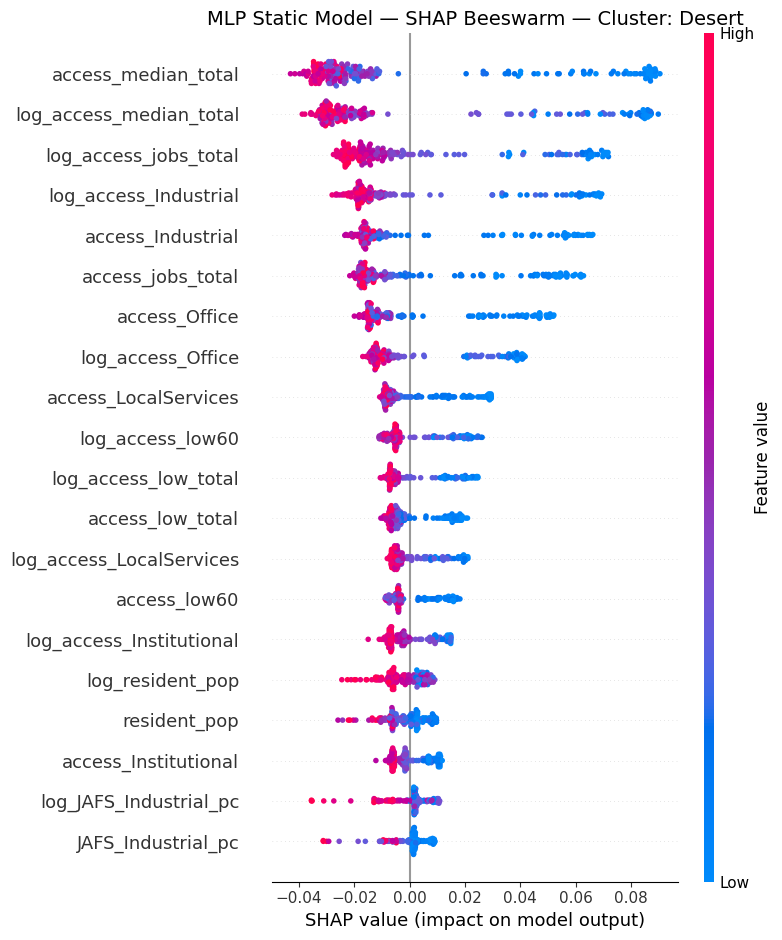

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_bar_static_Desert.png


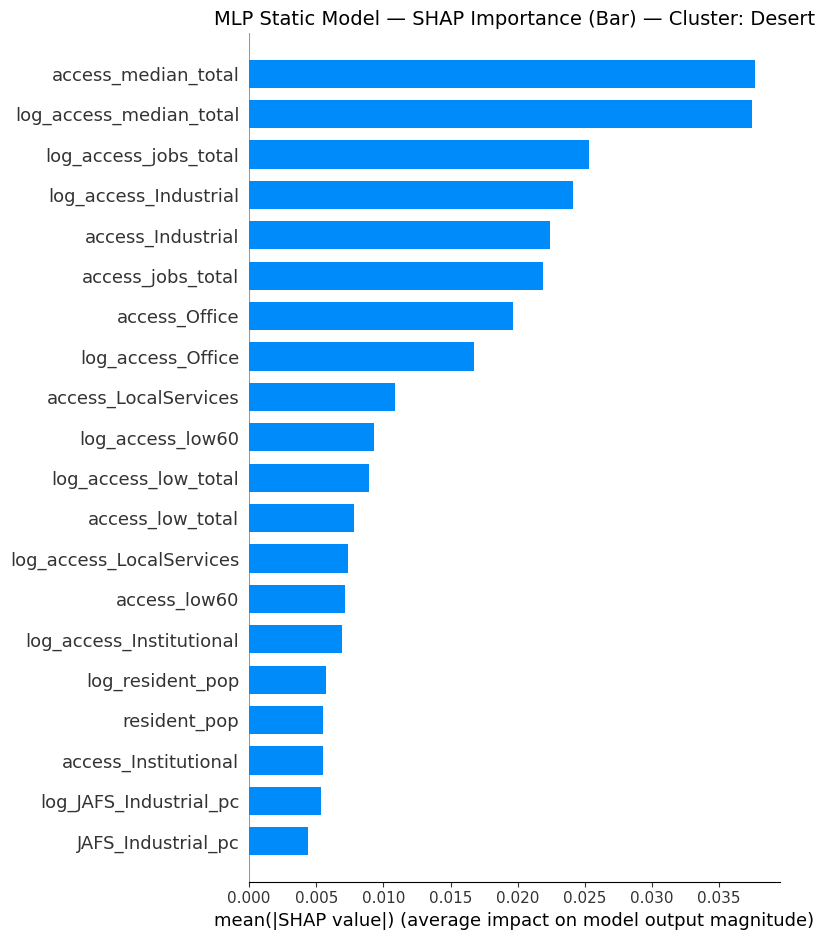


=== SHAP for cluster: HighOpp ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_beeswarm_static_HighOpp.png


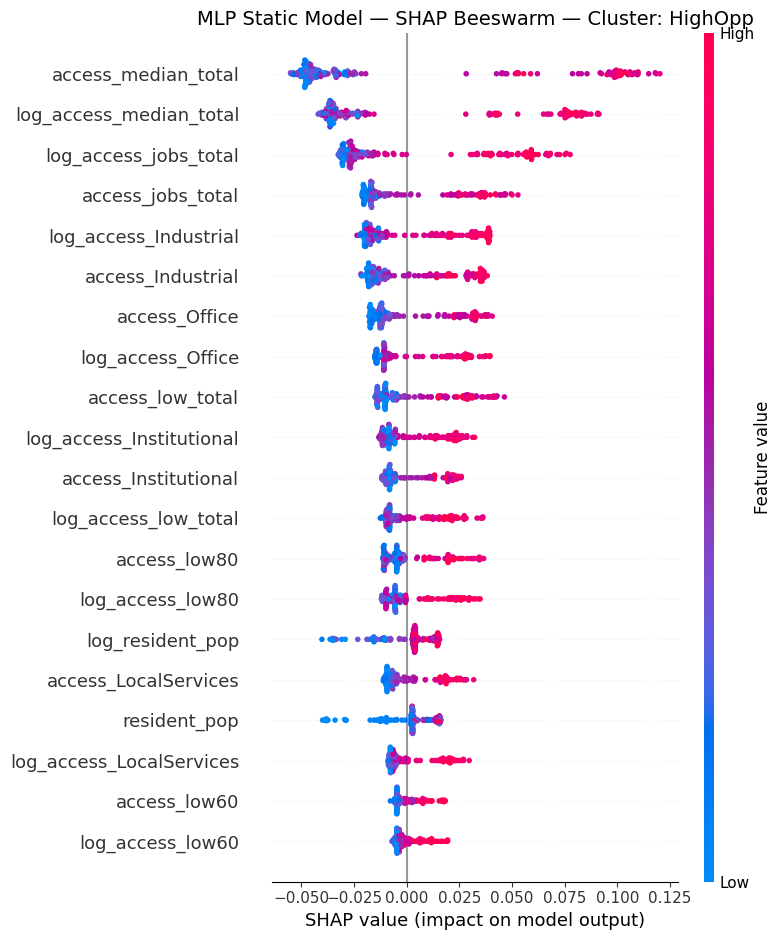

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_bar_static_HighOpp.png


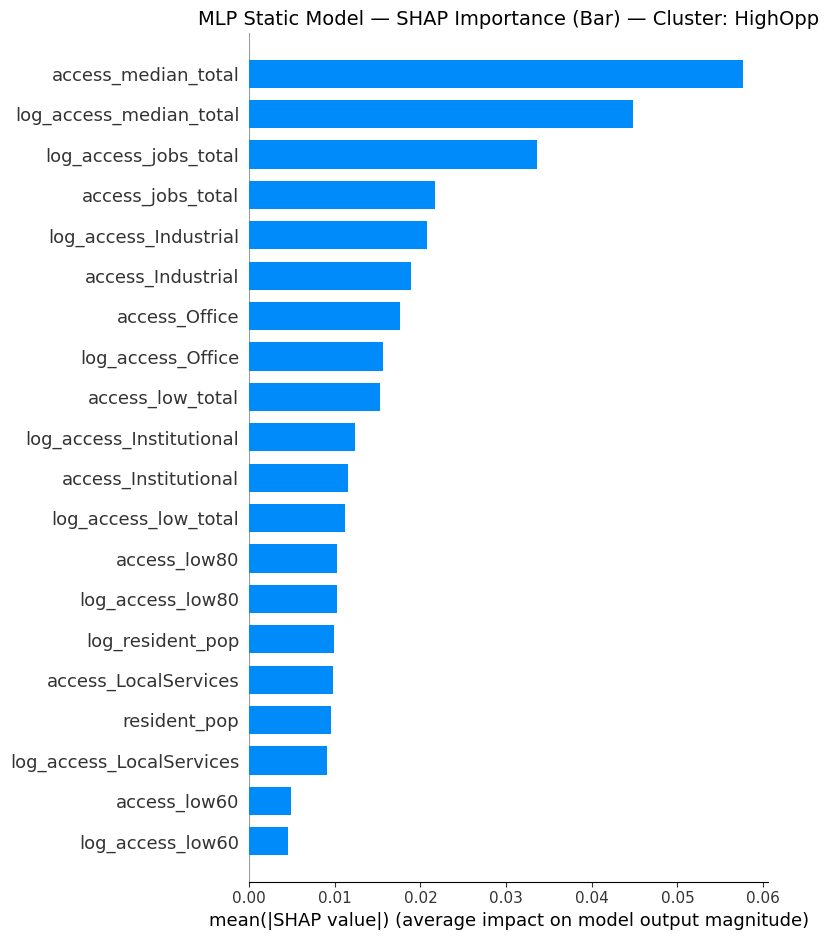


=== SHAP for cluster: Service ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_beeswarm_static_Service.png


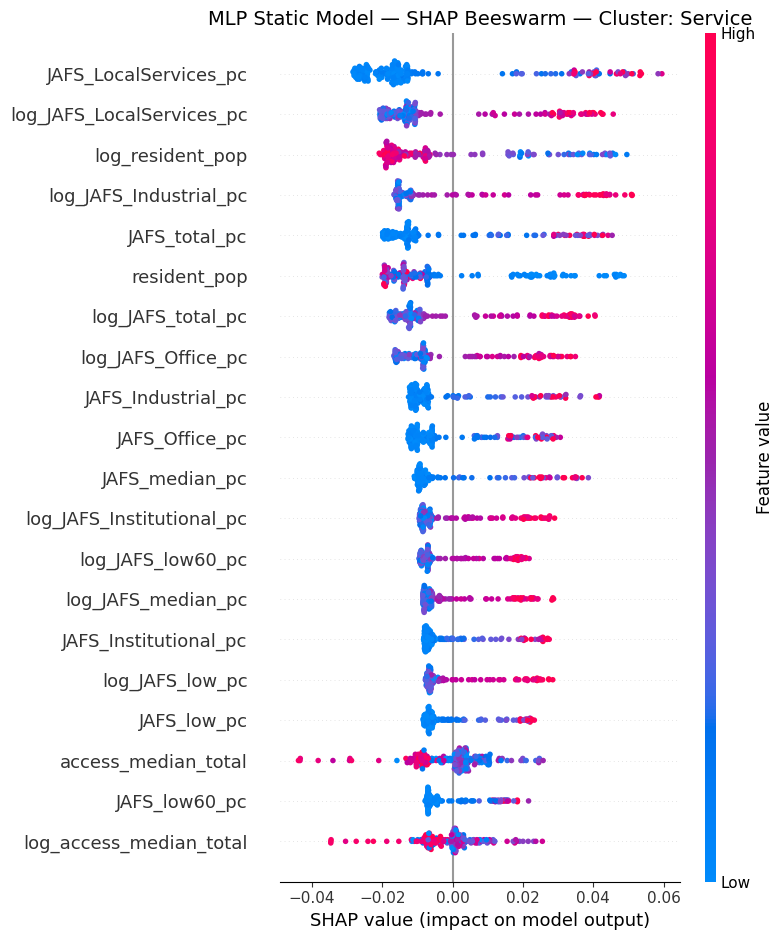

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_bar_static_Service.png


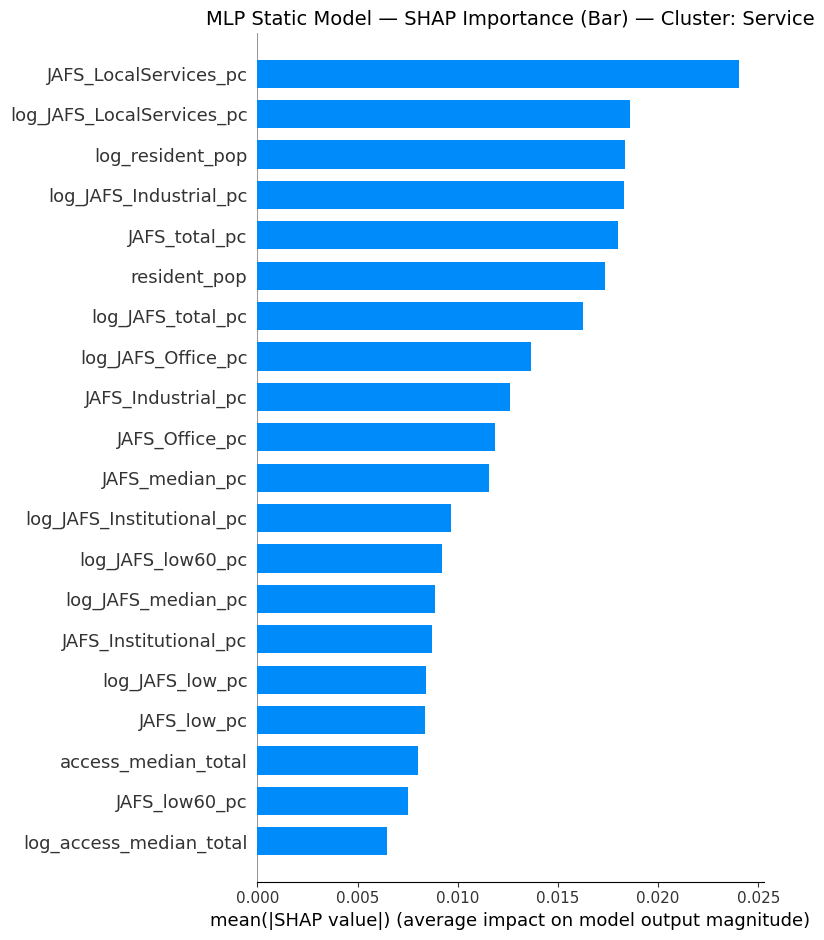


=== SHAP for cluster: Balanced ===
Saved beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_beeswarm_static_Balanced.png


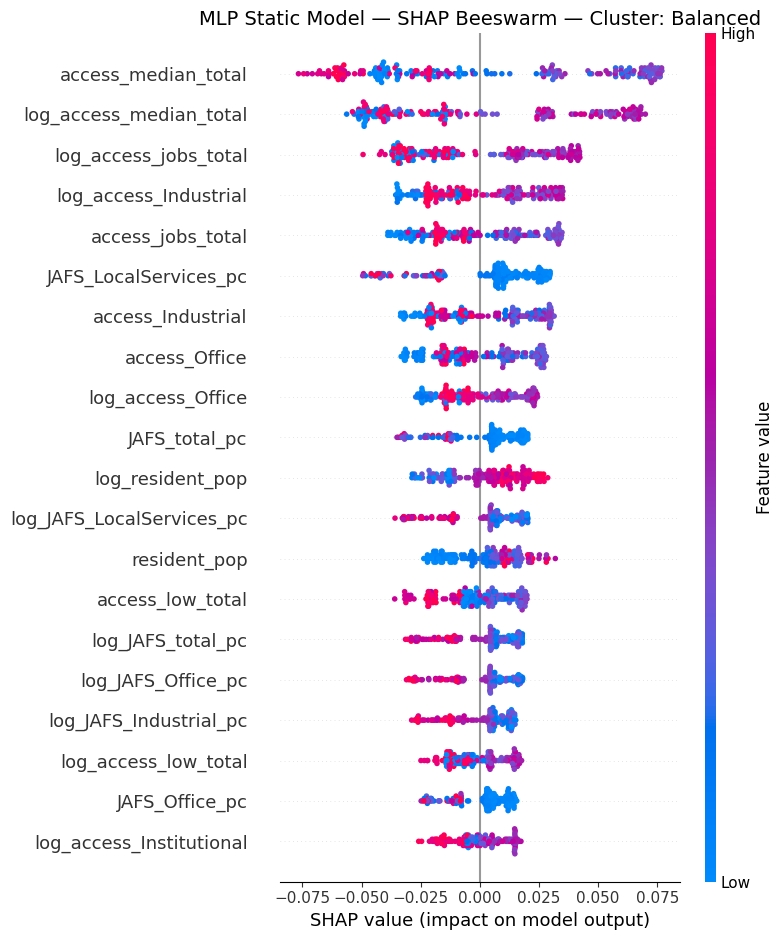

Saved bar → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_static_cluster_plots/shap_bar_static_Balanced.png


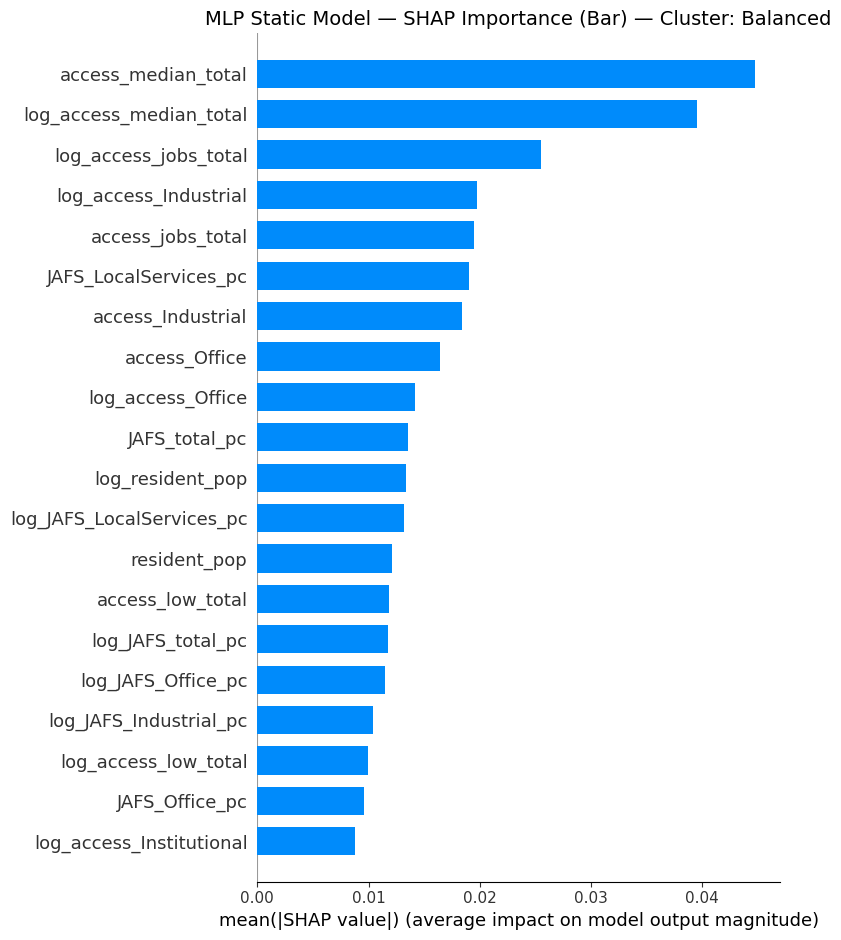

In [ ]:
folder_name = "MLP_static_cluster_plots"
save_dir = os.path.join(base, folder_name)

os.makedirs(save_dir, exist_ok=True)
print("Saving SHAP plots to:", save_dir)


# ==========================================
# 2) 你的原本变量
# ==========================================
class_names = target_names    # ['HighOpp', 'Desert', 'Service', 'Balanced']

shap_values_raw = shap_exp_s.values     # (N, 48, 4)
X_sample = X_shap_s                     # same (N, 48)
feature_names = feature_names_s         # = static_cols


# ==========================================
# 3) Loop over clusters & 保存图像
# ==========================================
for cname in class_names:
    class_idx = class_names.index(cname)

    # SHAP values for this cluster (N, 48)
    shap_values_for_class = shap_values_raw[:, :, class_idx]

    print(f"\n=== SHAP for cluster: {cname} ===")

    # ------------------------------------------
    # 1) Beeswarm
    # ------------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        show=False
    )
    plt.title(f"MLP Static Model — SHAP Beeswarm — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    beeswarm_path = os.path.join(save_dir, f"shap_beeswarm_static_{cname}.png")
    plt.savefig(beeswarm_path, dpi=300)
    print(f"Saved beeswarm → {beeswarm_path}")

    plt.show()

    # ------------------------------------------
    # 2) Bar plot
    # ------------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        plot_type="bar",
        show=False
    )
    plt.title(f"MLP Static Model — SHAP Importance (Bar) — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    bar_path = os.path.join(save_dir, f"shap_bar_static_{cname}.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved bar → {bar_path}")

    plt.show()

### SHAP for MLP — Dynamic model

In [ ]:
# ===== 1) Background data for Dynamic MLP =====
bg_size_d = min(200, X_train_d.shape[0])
bg_idx_d = np.random.choice(X_train_d.shape[0], bg_size_d, replace=False)
X_bg_mlp_d = X_train_d[bg_idx_d]

# KernelExplainer for Dynamic MLP
explainer_mlp_d = shap.KernelExplainer(
    mlp_d.predict_proba,   # Pipeline(Scaler + MLP)
    X_bg_mlp_d,
)

In [ ]:
# 所有动态特征 = static + embedding
feature_names_d = static_cols + embed_cols

# 全部 panel 数据 → 按外层 scaler_d 做 transform
X_all_dynamic = scaler_d.transform(
    df_full_dynamic[feature_names_d].values
)

# 抽样 1000 行做 SHAP（如果总行数 < 1000，则用全部）
sample_size_d = min(1000, X_all_dynamic.shape[0])
idx_sample_d = np.random.choice(X_all_dynamic.shape[0], sample_size_d, replace=False)

X_shap_mlp_d = X_all_dynamic[idx_sample_d]

print("X_shap_mlp_d shape:", X_shap_mlp_d.shape)
# 预期: (sample_size_d, 48 + 128 = 176)

X_shap_mlp_d shape: (1000, 176)


👇The code ran around 25 mins.

In [ ]:
# shap_values_list_d 是一个长度 = n_classes 的 list
# 每个元素 shape = (N_sample_d, F_dyn)
shap_vals_list_d = explainer_mlp_d.shap_values(X_shap_mlp_d)

# 转成 (N_sample_d, F_dyn, 4)
shap_values_raw_mlp_d = np.stack(shap_vals_list_d, axis=2)

print("shap_values_raw_mlp_d.shape:", shap_values_raw_mlp_d.shape)
# 预期: (sample_size_d, 176, 4)

  0%|          | 0/1000 [00:00<?, ?it/s]

shap_values_raw_mlp_d.shape: (176, 4, 1000)


In [ ]:
# 现在是 (F, C, N) → 转成 (N, F, C)
shap_values_raw_mlp_d = np.transpose(shap_values_raw_mlp_d, (2, 0, 1))
print("fixed shap_values_raw_mlp_d.shape:", shap_values_raw_mlp_d.shape)
# 预期: (1000, 176, 4)

fixed shap_values_raw_mlp_d.shape: (1000, 176, 4)



=== Dynamic MLP — SHAP for cluster: Desert ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_beeswarm_dynamic_Desert.png


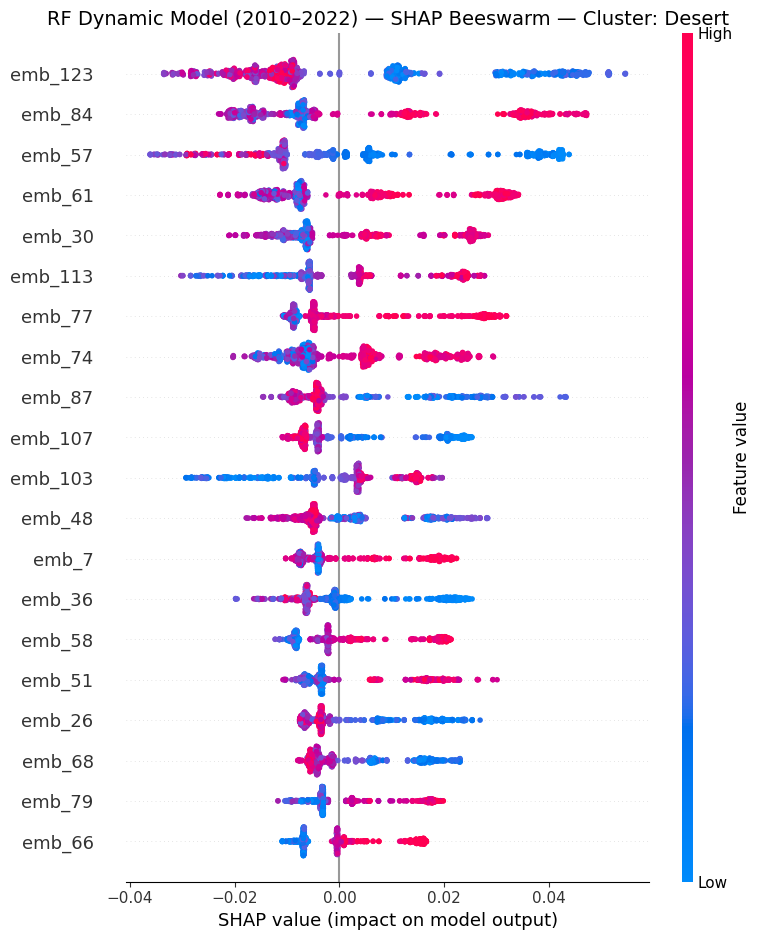

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_bar_dynamic_Desert.png


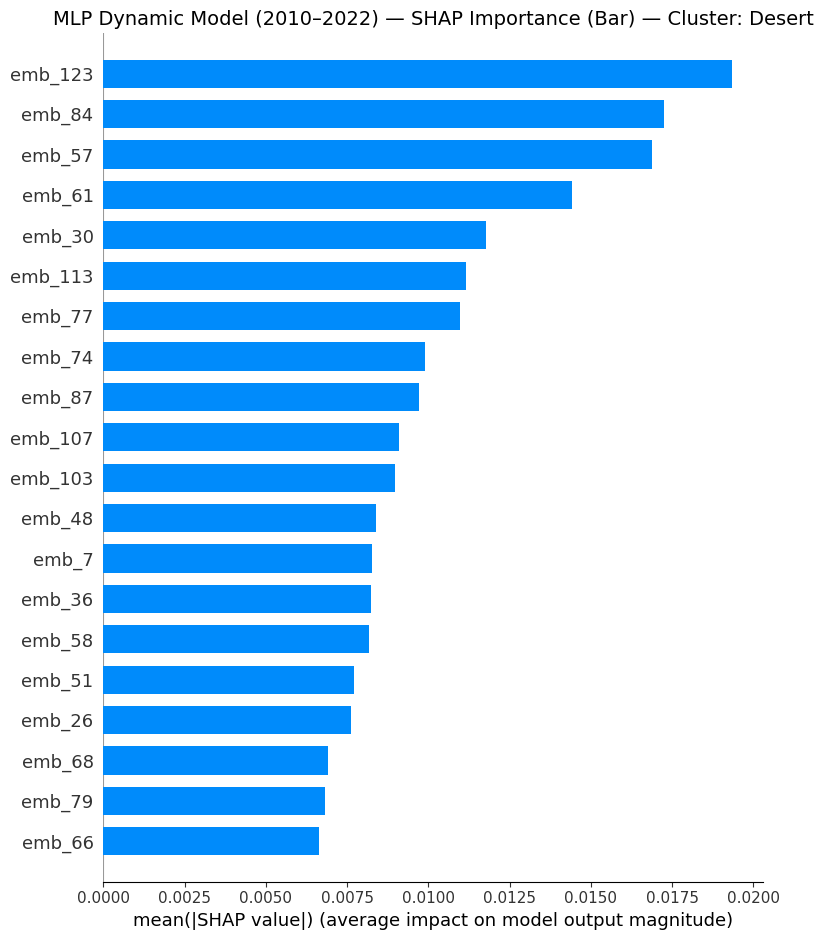


=== Dynamic MLP — SHAP for cluster: HighOpp ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_beeswarm_dynamic_HighOpp.png


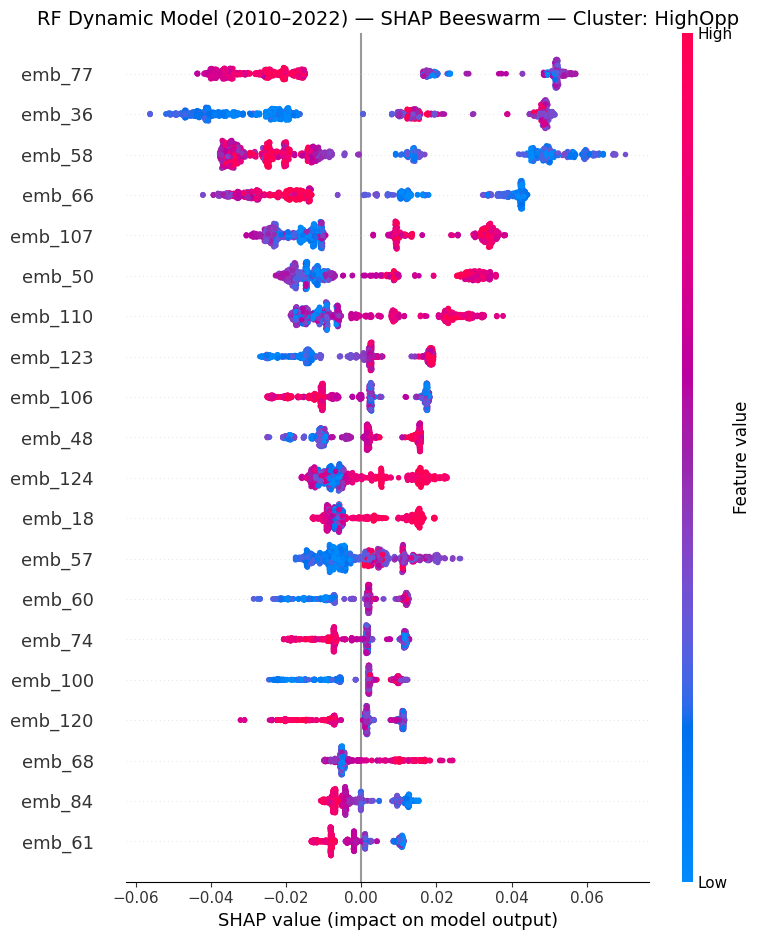

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_bar_dynamic_HighOpp.png


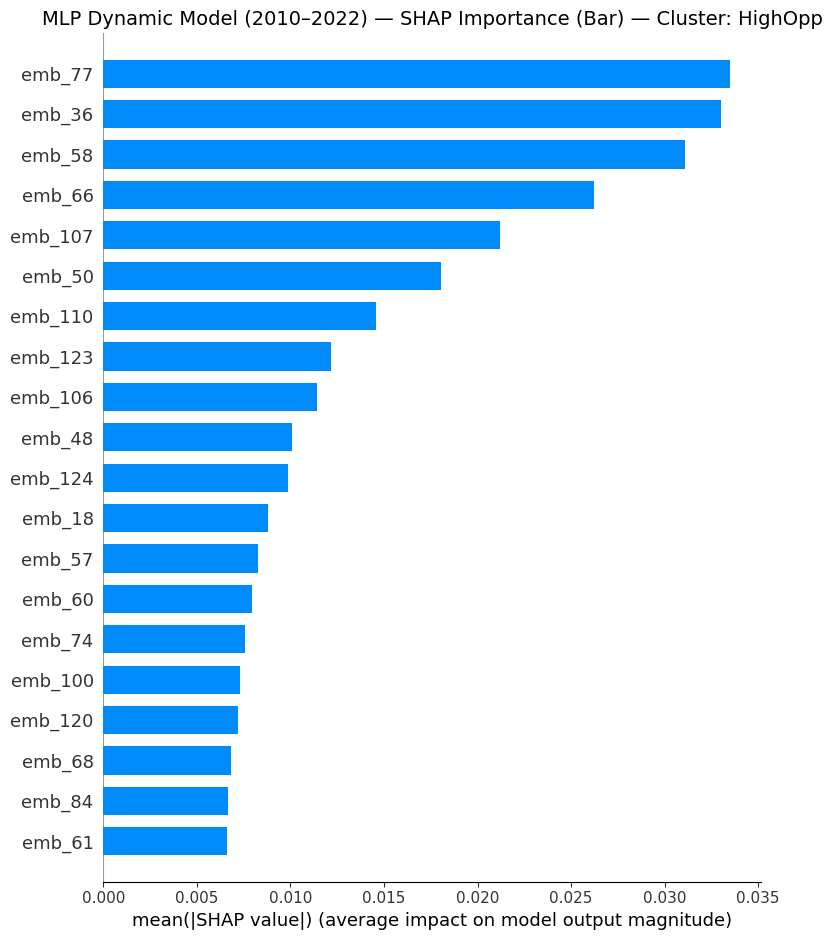


=== Dynamic MLP — SHAP for cluster: Service ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_beeswarm_dynamic_Service.png


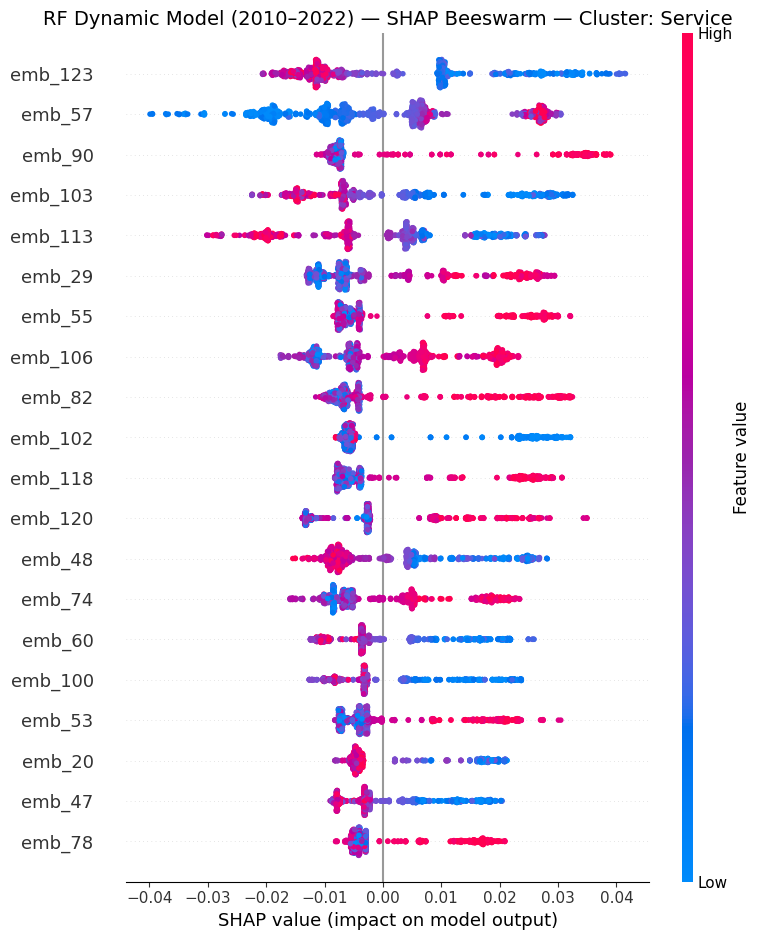

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_bar_dynamic_Service.png


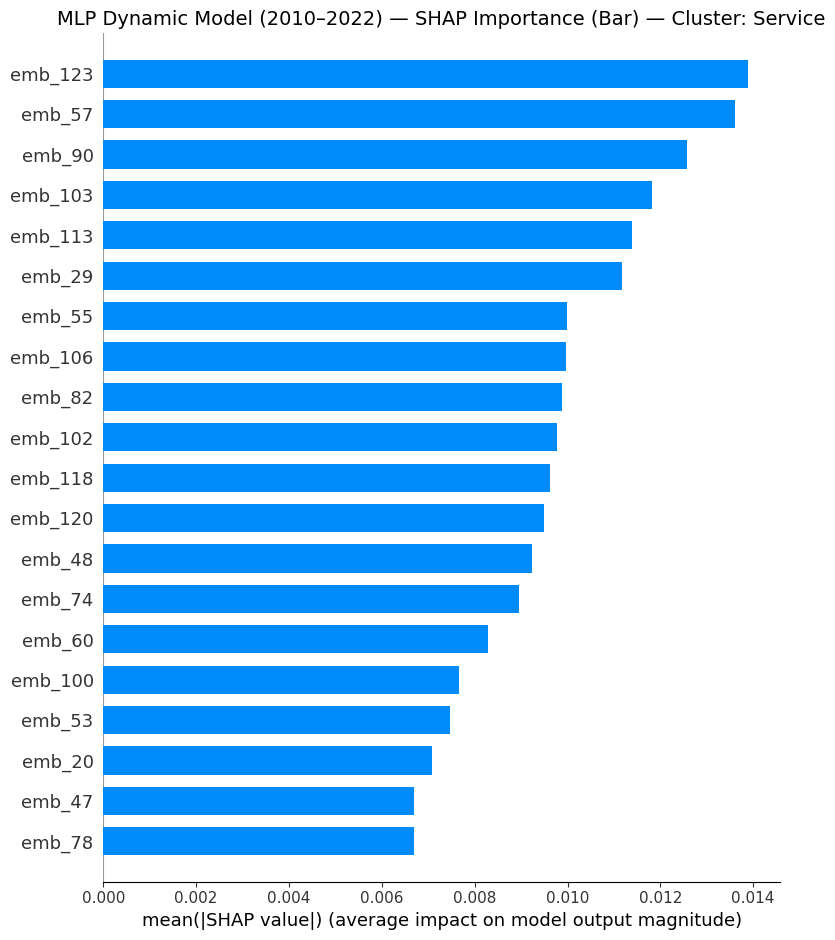


=== Dynamic MLP — SHAP for cluster: Balanced ===
Saved beeswarm plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_beeswarm_dynamic_Balanced.png


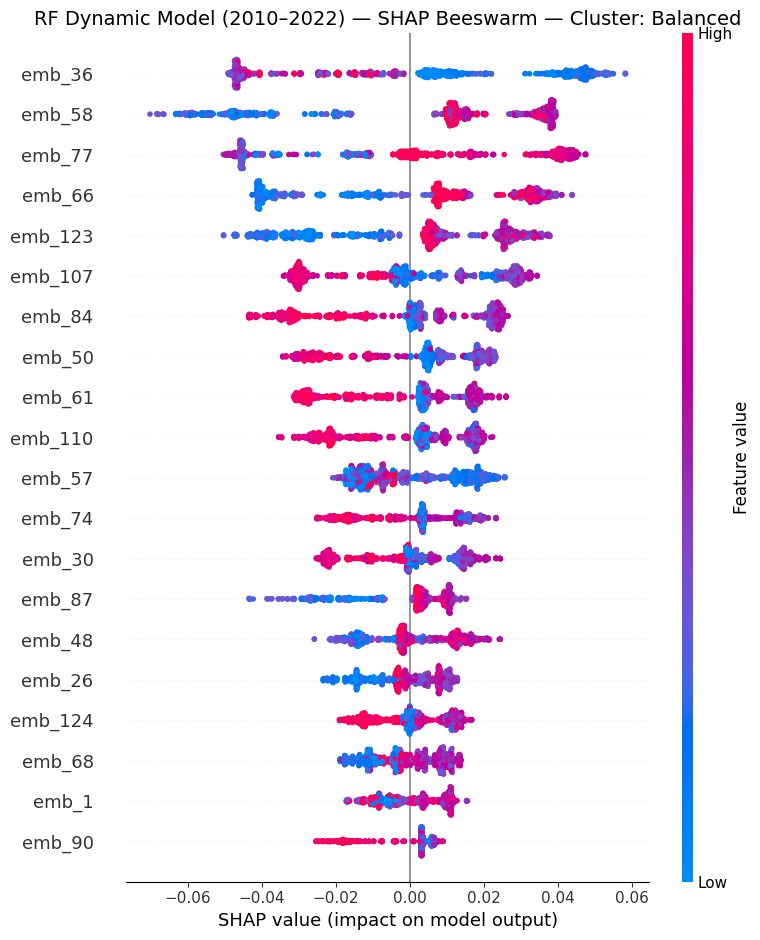

Saved bar plot → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_dynamic_cluster_plots/shap_bar_dynamic_Balanced.png


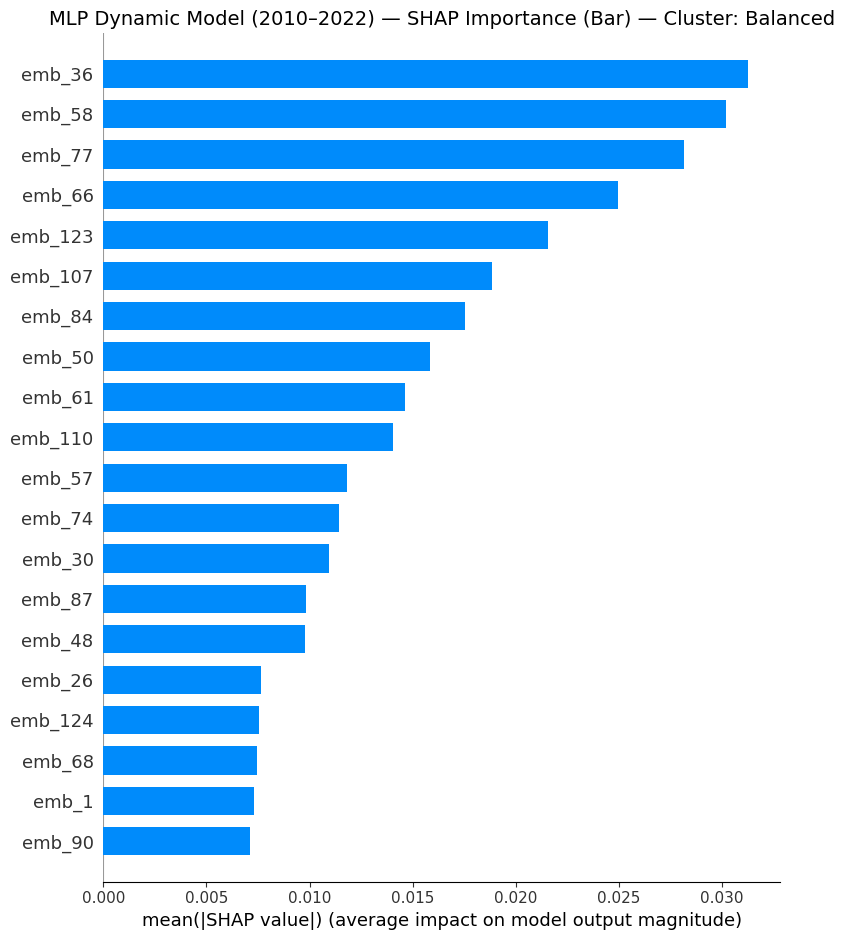

In [ ]:
# 子文件夹名称
folder_name = "MLP_dynamic_cluster_plots"

# 拼接完整路径
save_dir = os.path.join(base, folder_name)

# 创建最终保存目录
os.makedirs(save_dir, exist_ok=True)



# class 名称（与 static 一样）
class_names = target_names    # ['HighOpp', 'Desert', 'Service', 'Balanced']

# shap values: (N_sample, F_dyn, 4)
shap_values_raw = shap_exp_d.values

X_sample = X_shap_d           # (N_sample, F_dyn)
feature_names = feature_names_d

for cname in class_names:
    class_idx = class_names.index(cname)

    # 该 cluster 的 SHAP 值：(N_sample, F_dyn)
    shap_values_for_class = shap_values_raw[:, :, class_idx]

    print(f"\n=== Dynamic MLP — SHAP for cluster: {cname} ===")

    # -----------------------------------------
    # 1️⃣ Beeswarm  (保存文件)
    # -----------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        show=False
    )
    plt.title(
        f"RF Dynamic Model (2010–2022) — "
        f"SHAP Beeswarm — Cluster: {cname}",
        fontsize=14
    )
    plt.tight_layout()

    # 保存 PNG
    beeswarm_path = os.path.join(save_dir, f"shap_beeswarm_dynamic_{cname}.png")
    plt.savefig(beeswarm_path, dpi=300)
    print(f"Saved beeswarm plot → {beeswarm_path}")

    plt.show()

    # -----------------------------------------
    # 2️⃣ Bar plot (保存文件)
    # -----------------------------------------
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample,
        feature_names=feature_names,
        plot_type="bar",
        show=False
    )
    plt.title(
        f"MLP Dynamic Model (2010–2022) — "
        f"SHAP Importance (Bar) — Cluster: {cname}",
        fontsize=14
    )
    plt.tight_layout()

    # 保存 PNG
    bar_path = os.path.join(save_dir, f"shap_bar_dynamic_{cname}.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved bar plot → {bar_path}")

    plt.show()

### RADAR

Saving MLP radar charts to: /content/drive/MyDrive/AI_DATA/dataset/created/MLP_radar_plots

=== MLP Radar for cluster: Desert ===
  MLP Static normalized: [0.4210349  0.34817397 0.2045712  0.02621993]
  MLP Dynamic normalized: [0.57834526 0.35625649 0.03314759 0.03225066]
  Saved MLP radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_radar_plots/radar_SHAP_MLP_Desert.png


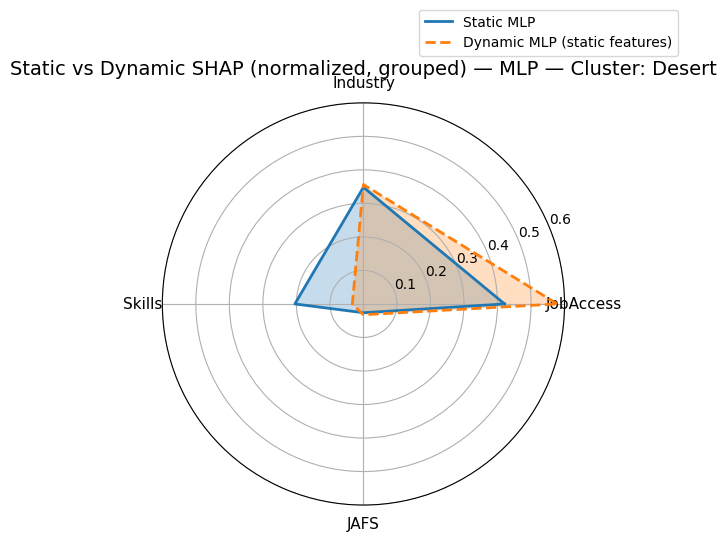


=== MLP Radar for cluster: HighOpp ===
  MLP Static normalized: [0.31464935 0.31111588 0.28355212 0.09068265]
  MLP Dynamic normalized: [0.36590547 0.30959266 0.26652904 0.05797283]
  Saved MLP radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_radar_plots/radar_SHAP_MLP_HighOpp.png


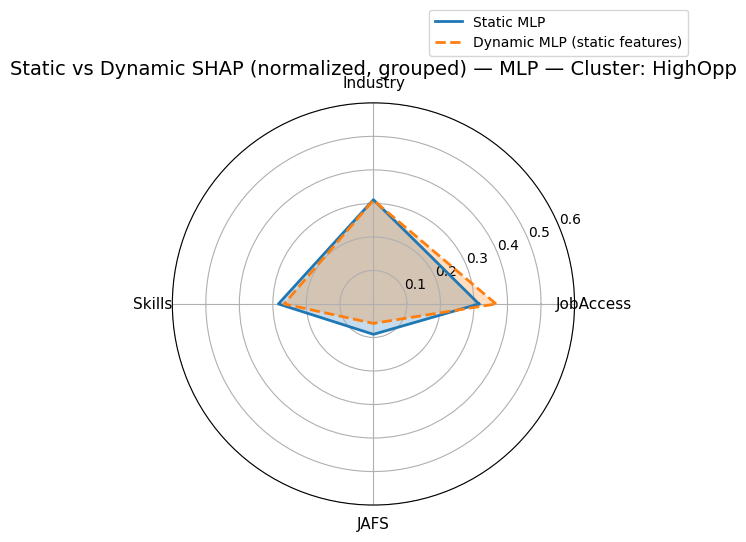


=== MLP Radar for cluster: Service ===
  MLP Static normalized: [0.11322567 0.36311073 0.40134961 0.12231399]
  MLP Dynamic normalized: [0.4334056  0.346925   0.07333223 0.14633718]
  Saved MLP radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_radar_plots/radar_SHAP_MLP_Service.png


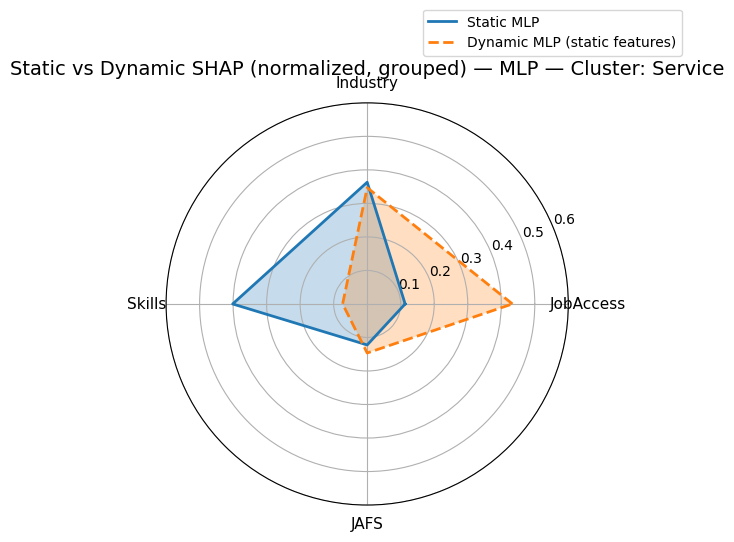


=== MLP Radar for cluster: Balanced ===
  MLP Static normalized: [0.40824455 0.32743521 0.1039984  0.16032183]
  MLP Dynamic normalized: [0.42239012 0.5407236  0.01301335 0.02387293]
  Saved MLP radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/MLP_radar_plots/radar_SHAP_MLP_Balanced.png


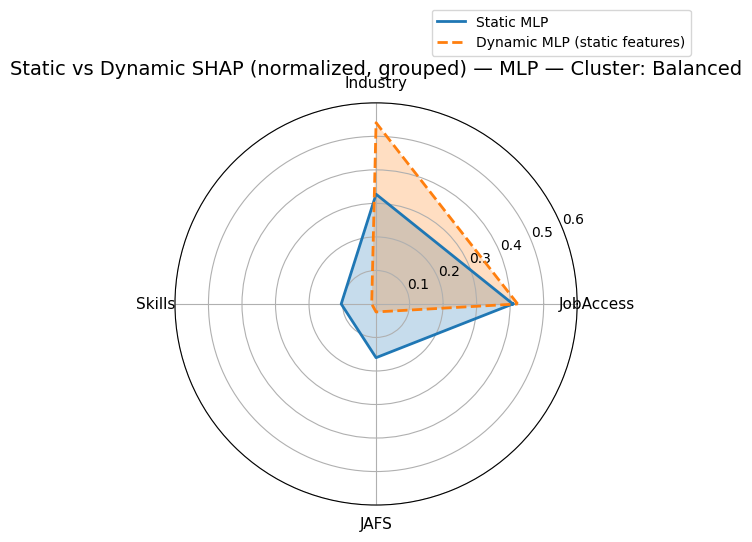

In [ ]:
# 1. 分组定义（和 RF 一样）
groups = {
    "JobAccess": job_access_vars,
    "Industry":  industry_vars,
    "Skills":    skill_vars,
    "JAFS":      jafs_vars,
}
labels = list(groups.keys())   # ["JobAccess", "Industry", "Skills", "JAFS"]

# 2. 输出文件夹（MLP 专用）
folder_name_mlp = "MLP_radar_plots"
save_dir_mlp = os.path.join(base, folder_name_mlp)
os.makedirs(save_dir_mlp, exist_ok=True)
print("Saving MLP radar charts to:", save_dir_mlp)

feature_names_s = static_cols
feature_names_d = static_cols + embed_cols

# 3. 对四个 cluster 逐个画图
for cluster_name in target_names:   # e.g. 'HighOpp','Desert','Service','Balanced'
    print(f"\n=== MLP Radar for cluster: {cluster_name} ===")
    k = target_names.index(cluster_name)

    # --- Static SHAP for this cluster ---
    # shap_values_raw_mlp: (N_s_mlp, 48, 4)
    shap_values_s_k = shap_values_raw_mlp[:, :, k]    # (N_s_mlp, 48)

    # --- Dynamic SHAP for this cluster ---
    # shap_values_raw_mlp_d: (N_d_mlp, 176, 4)
    shap_values_d_k = shap_values_raw_mlp_d[:, :, k]  # (N_d_mlp, 176)

    # --- 按四大组聚合 SHAP（绝对值均值求和） ---
    group_scores_static = grouped_shap_mean_abs(
        shap_values_s_k,
        feature_names_s,
        groups
    )

    group_scores_dynamic = grouped_shap_mean_abs(
        shap_values_d_k,
        feature_names_d,   # 既有 static 也有 emb_，groups 只会匹配 log_* 名称
        groups
    )

    # --- 转成向量，并做归一化（和 = 1） ---
    vals_static_raw  = np.array([group_scores_static[l]  for l in labels], dtype=float)
    vals_dynamic_raw = np.array([group_scores_dynamic[l] for l in labels], dtype=float)

    sum_static  = vals_static_raw.sum()
    sum_dynamic = vals_dynamic_raw.sum()

    if sum_static > 0:
        vals_static_norm = vals_static_raw / sum_static
    else:
        vals_static_norm = np.zeros_like(vals_static_raw)

    if sum_dynamic > 0:
        vals_dynamic_norm = vals_dynamic_raw / sum_dynamic
    else:
        vals_dynamic_norm = np.zeros_like(vals_dynamic_raw)

    print("  MLP Static normalized:", vals_static_norm)
    print("  MLP Dynamic normalized:", vals_dynamic_norm)

    # --- 为雷达图准备闭合数据 ---
    values_static  = vals_static_norm.tolist()
    values_dynamic = vals_dynamic_norm.tolist()

    values_static  += values_static[:1]
    values_dynamic += values_dynamic[:1]

    num_vars = len(labels)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # --- 画雷达图 ---
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Static 曲线
    ax.plot(angles, values_static, linewidth=2, linestyle='solid', label='Static MLP')
    ax.fill(angles, values_static, alpha=0.25)

    # Dynamic 曲线（只看 static 特征的 SHAP）
    ax.plot(angles, values_dynamic, linewidth=2, linestyle='dashed',
            label='Dynamic MLP (static features)')
    ax.fill(angles, values_dynamic, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=11)

    ax.set_ylim(0, 0.6)   # 比例 0~1

    ax.set_title(
        f"Static vs Dynamic SHAP (normalized, grouped) — MLP — Cluster: {cluster_name}",
        fontsize=14,
        pad=20
    )
    ax.legend(loc='lower right', bbox_to_anchor=(1.3, 1.1))

    plt.tight_layout()

    # 保存 PNG
    save_path = os.path.join(save_dir_mlp, f"radar_SHAP_MLP_{cluster_name}.png")
    plt.savefig(save_path, dpi=300)
    print(f"  Saved MLP radar chart → {save_path}")

    plt.show()

  ## Step 4 — XGBoost（Static baseline vs Dynamic enhanced）

In [ ]:
# 训练时就给 XGBoost DataFrame
X_train_s_df = pd.DataFrame(X_train_s, columns=static_cols)
xgb_s.fit(X_train_s_df, y_train)

# SHAP 也用 DataFrame
X_shap_xgb_s = scaler_s.transform(df_full_static[static_cols].values)
X_shap_xgb_s_df = pd.DataFrame(X_shap_xgb_s, columns=static_cols)

explainer_xgb_s = shap.Explainer(xgb_s, X_train_s_df)
shap_exp_xgb_s  = explainer_xgb_s(X_shap_xgb_s_df)

shap_values_xgb_s = shap_exp_xgb_s.values  # (N, 48, 4)

 99%|===================| 3804/3828 [01:32<00:00]       

In [ ]:
# 通用参数（可以以后再调）
xgb_params = dict(
    n_estimators=300,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="multi:softprob",
    num_class=len(np.unique(y_train)),
    reg_lambda=1.0,
    n_jobs=-1,
    random_state=42,
)

# ===========================
# A. XGBoost — Static
# ===========================
# 用带列名的 DataFrame 训练 & 预测
X_train_s_df = pd.DataFrame(X_train_s, columns=static_cols)      # (N_train, 48)
X_test_s_df  = pd.DataFrame(X_test_s,  columns=static_cols)      # (N_test, 48)

xgb_s = XGBClassifier(**xgb_params)
xgb_s.fit(X_train_s_df, y_train)

y_pred_s = xgb_s.predict(X_test_s_df)

print("\n=== XGBoost (Static) — Accuracy ===")
print(accuracy_score(y_test, y_pred_s))

print("\n=== XGBoost (Static) — Classification Report ===")
print(classification_report(y_test, y_pred_s, labels=classes, target_names=target_names))

print("=== Confusion Matrix (XGBoost Static) ===")
print(confusion_matrix(y_test, y_pred_s, labels=classes))


# ===========================
# B. XGBoost — Dynamic
# ===========================
feature_names_d = static_cols + embed_cols  # 48 + 128 = 176

X_train_d_df = pd.DataFrame(X_train_d, columns=feature_names_d)  # (N_train, 176)
X_test_d_df  = pd.DataFrame(X_test_d,  columns=feature_names_d)  # (N_test, 176)

xgb_d = XGBClassifier(**xgb_params)
xgb_d.fit(X_train_d_df, y_train)

y_pred_d = xgb_d.predict(X_test_d_df)

print("\n=== XGBoost (Dynamic) — Accuracy ===")
print(accuracy_score(y_test, y_pred_d))

print("\n=== XGBoost (Dynamic) — Classification Report ===")
print(classification_report(y_test, y_pred_d, labels=classes, target_names=target_names))

print("=== Confusion Matrix (XGBoost Dynamic) ===")
print(confusion_matrix(y_test, y_pred_d, labels=classes))


=== XGBoost (Static) — Accuracy ===
0.828125

=== XGBoost (Static) — Classification Report ===
              precision    recall  f1-score   support

      Desert       0.82      0.82      0.82        40
     HighOpp       0.85      0.92      0.88        50
     Service       0.69      0.75      0.72        36
    Balanced       0.90      0.80      0.85        66

    accuracy                           0.83       192
   macro avg       0.82      0.82      0.82       192
weighted avg       0.83      0.83      0.83       192

=== Confusion Matrix (XGBoost Static) ===
[[33  0  6  1]
 [ 0 46  2  2]
 [ 3  3 27  3]
 [ 4  5  4 53]]

=== XGBoost (Dynamic) — Accuracy ===
1.0

=== XGBoost (Dynamic) — Classification Report ===
              precision    recall  f1-score   support

      Desert       1.00      1.00      1.00        40
     HighOpp       1.00      1.00      1.00        50
     Service       1.00      1.00      1.00        36
    Balanced       1.00      1.00      1.00        66

 

### SHAP for XGBoost — Dynamic model

In [ ]:
# ========= A. Static SHAP =========

# 背景数据：训练集（已经 scale 过）
X_train_s_df = pd.DataFrame(X_train_s, columns=static_cols)

explainer_xgb_s = shap.Explainer(
    xgb_s,
    X_train_s_df,          # background
)

# 需要解释的数据：df_full_static 全部样本 → 先做 scaling，再转成 DF
X_shap_xgb_s = scaler_s.transform(df_full_static[static_cols].values)
X_shap_xgb_s_df = pd.DataFrame(X_shap_xgb_s, columns=static_cols)

shap_exp_xgb_s = explainer_xgb_s(X_shap_xgb_s_df)

print("X_shap_xgb_s.shape:", X_shap_xgb_s_df.shape)
print("shap_exp_xgb_s.values.shape:", shap_exp_xgb_s.values.shape)
# 预期: (N_static, 48, 4)

shap_values_xgb_s = shap_exp_xgb_s.values    # (N_static, 48, 4)


# ========= B. Dynamic SHAP =========

feature_names_d = static_cols + embed_cols   # 48 + 128 = 176

# 背景数据：dynamic 训练集 (已scale)
X_train_d_df = pd.DataFrame(X_train_d, columns=feature_names_d)

explainer_xgb_d = shap.Explainer(
    xgb_d,
    X_train_d_df,
)

# 全 panel 特征矩阵 → scaling → DataFrame
X_all_dyn = scaler_d.transform(
    df_full_dynamic[feature_names_d].values
)
X_all_dyn_df = pd.DataFrame(X_all_dyn, columns=feature_names_d)

# 为了速度，对 dynamic 抽样 1000 条做 SHAP
sample_size_d = min(1000, X_all_dyn_df.shape[0])
idx_sample_d = np.random.choice(X_all_dyn_df.shape[0], sample_size_d, replace=False)

X_shap_xgb_d_df = X_all_dyn_df.iloc[idx_sample_d].reset_index(drop=True)

shap_exp_xgb_d = explainer_xgb_d(X_shap_xgb_d_df)

print("X_shap_xgb_d.shape:", X_shap_xgb_d_df.shape)
print("shap_exp_xgb_d.values.shape:", shap_exp_xgb_d.values.shape)
# 预期: (N_dyn_sample, 176, 4)

shap_values_xgb_d = shap_exp_xgb_d.values    # (N_dyn_sample, 176, 4)

 99%|===================| 3789/3828 [01:32<00:00]       

X_shap_xgb_s.shape: (957, 48)
shap_exp_xgb_s.values.shape: (957, 48, 4)


 98%|===================| 3920/4000 [00:31<00:00]       

X_shap_xgb_d.shape: (1000, 176)
shap_exp_xgb_d.values.shape: (1000, 176, 4)


Saving XGBoost Dynamic SHAP plots to: /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots

=== XGB Dynamic — SHAP for cluster: Desert ===
Saved XGB Dynamic beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_beeswarm_xgb_dynamic_Desert.png


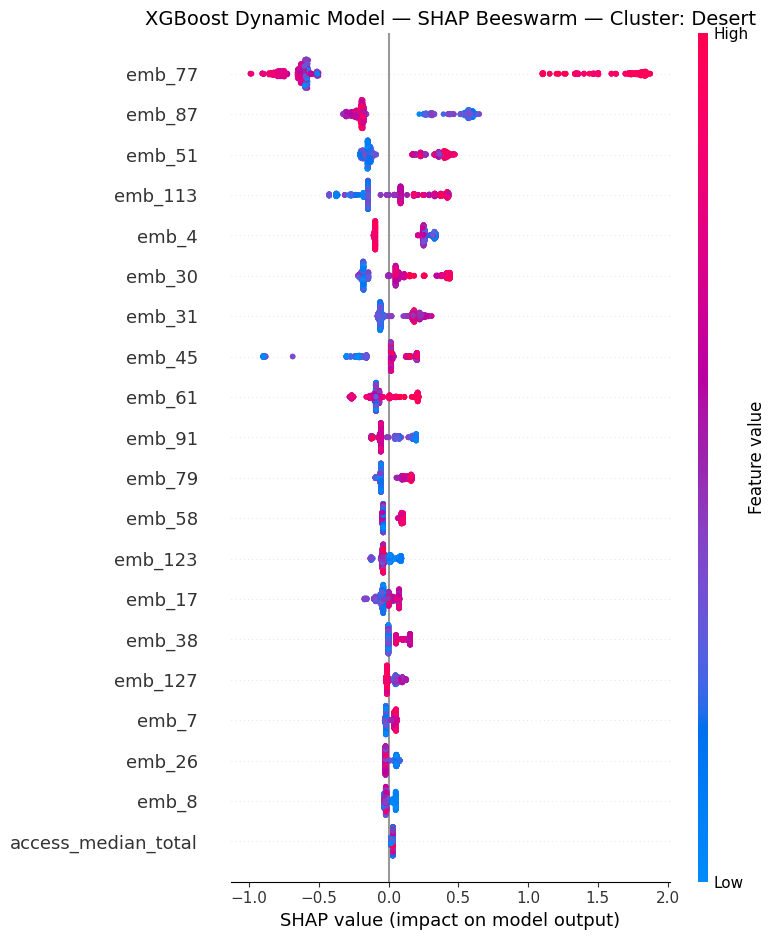

Saved XGB Dynamic bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_bar_xgb_dynamic_Desert.png


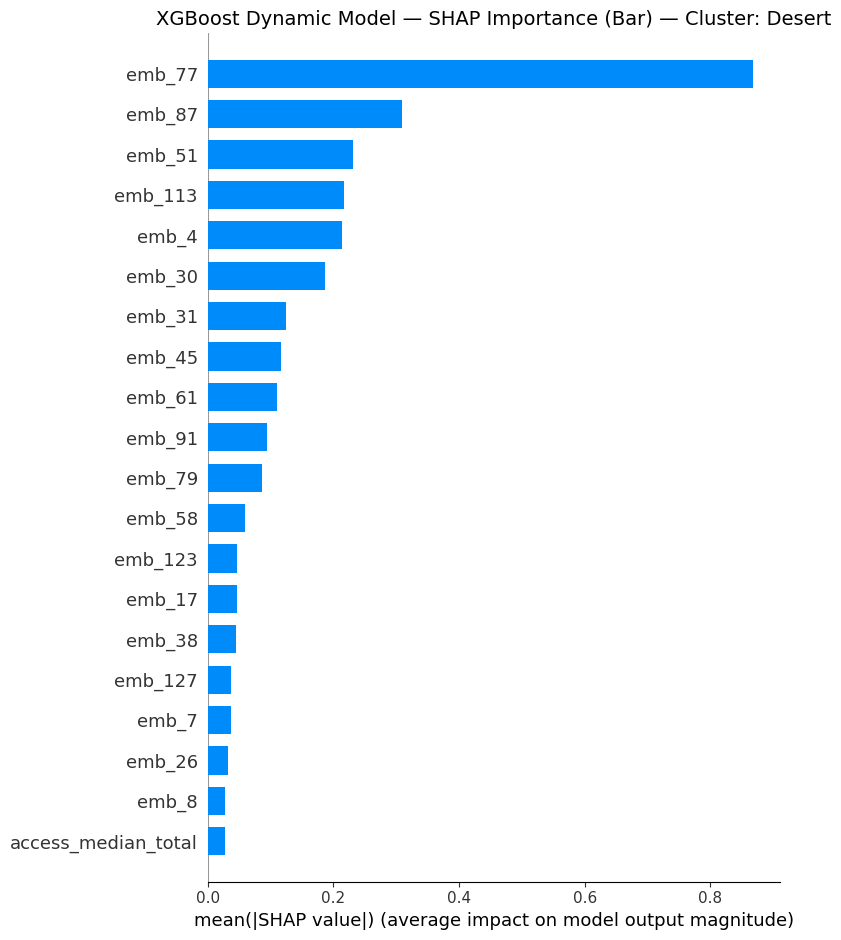


=== XGB Dynamic — SHAP for cluster: HighOpp ===
Saved XGB Dynamic beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_beeswarm_xgb_dynamic_HighOpp.png


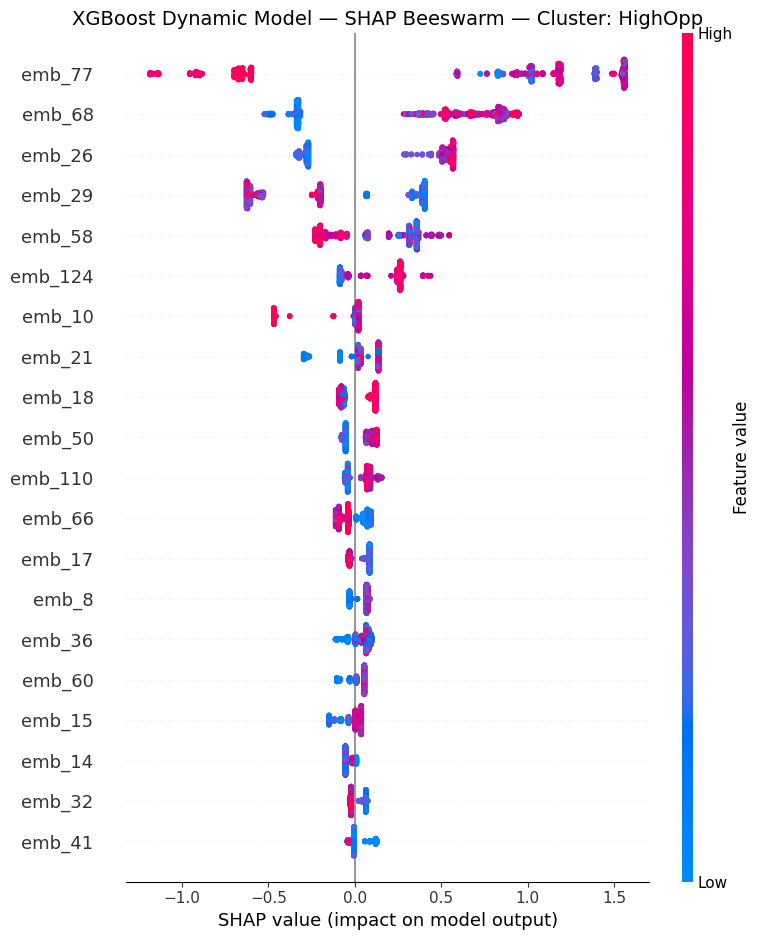

Saved XGB Dynamic bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_bar_xgb_dynamic_HighOpp.png


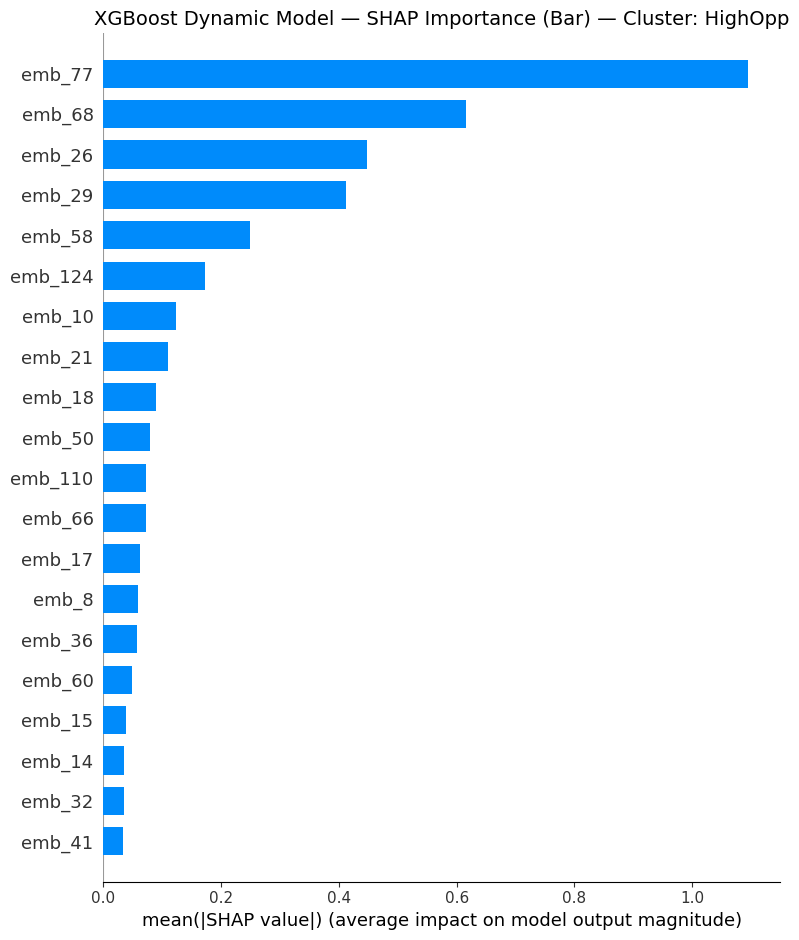


=== XGB Dynamic — SHAP for cluster: Service ===
Saved XGB Dynamic beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_beeswarm_xgb_dynamic_Service.png


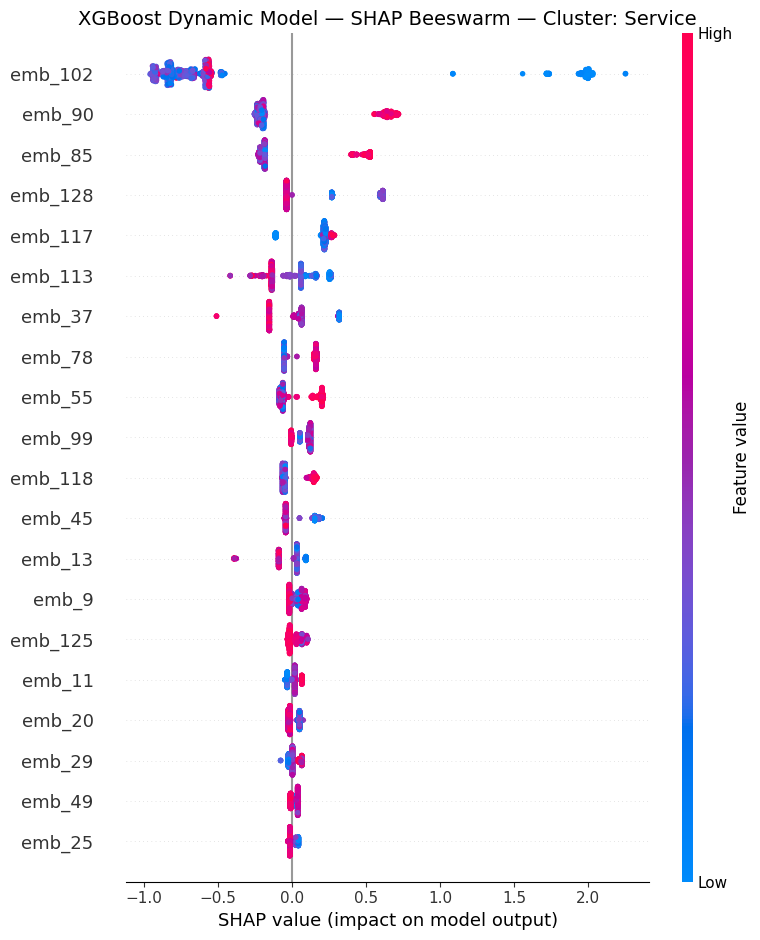

Saved XGB Dynamic bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_bar_xgb_dynamic_Service.png


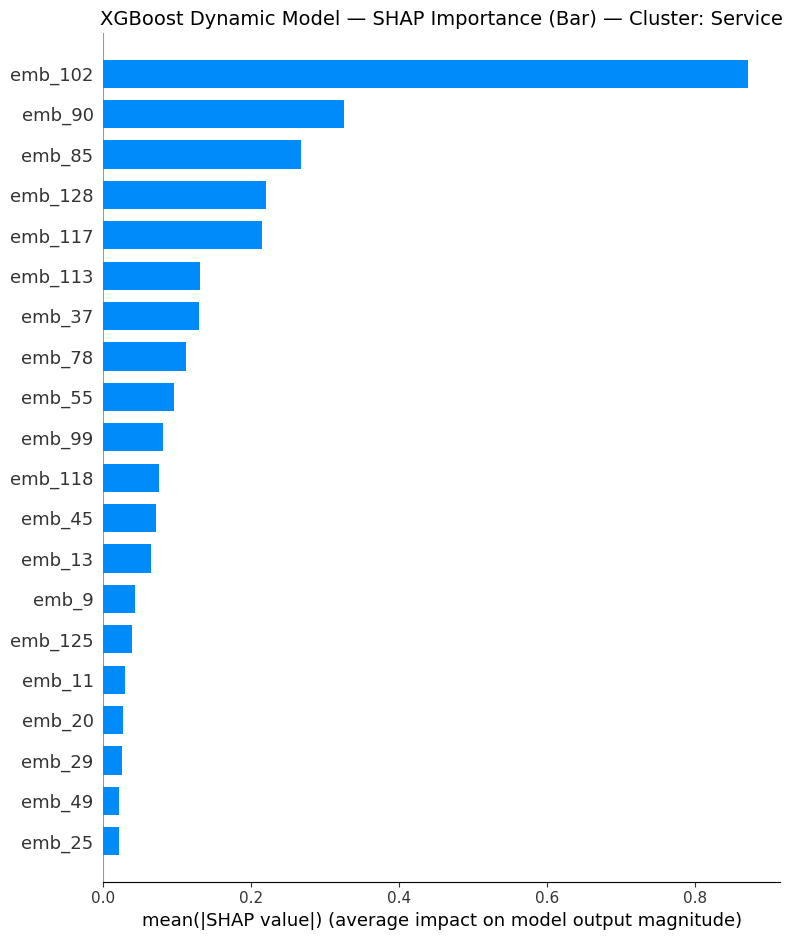


=== XGB Dynamic — SHAP for cluster: Balanced ===
Saved XGB Dynamic beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_beeswarm_xgb_dynamic_Balanced.png


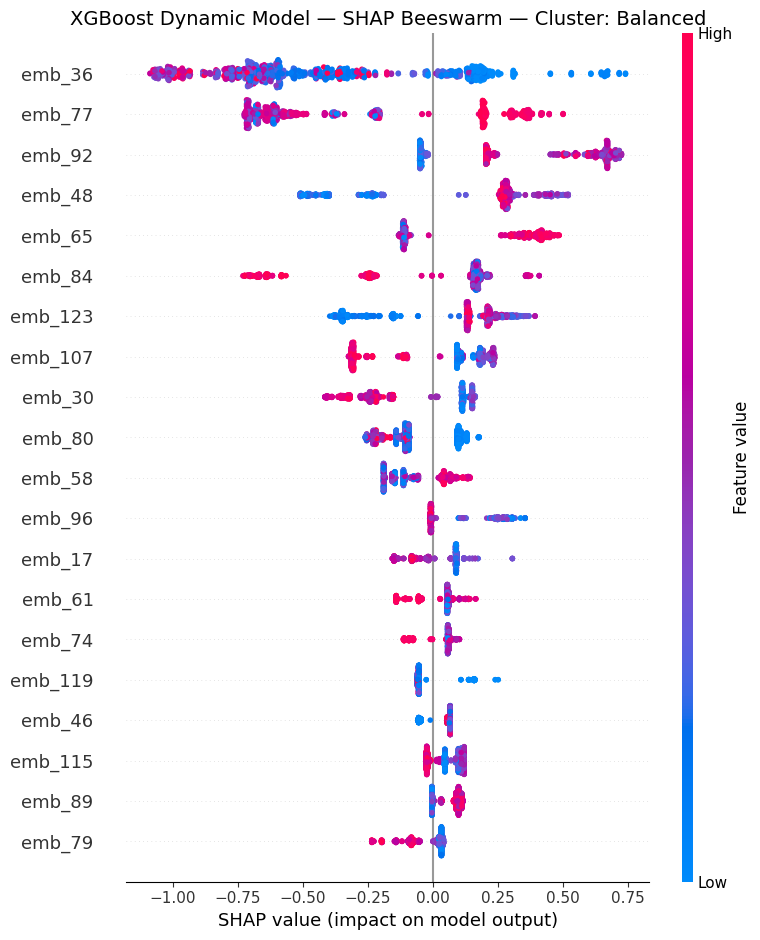

Saved XGB Dynamic bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_dynamic_cluster_plots/shap_bar_xgb_dynamic_Balanced.png


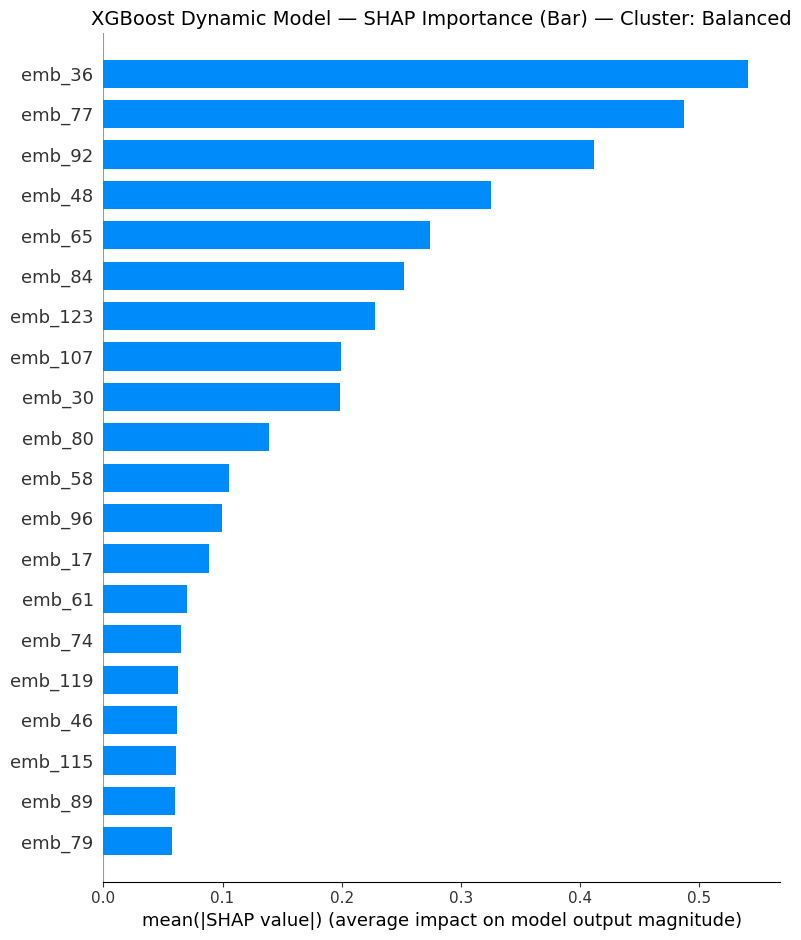

In [ ]:
folder_name_d = "XGB_dynamic_cluster_plots"
save_dir_d = os.path.join(base, folder_name_d)
os.makedirs(save_dir_d, exist_ok=True)
print("Saving XGBoost Dynamic SHAP plots to:", save_dir_d)

class_names     = target_names
X_sample_d      = X_shap_xgb_d_df             # (N_dyn_sample, 176)
feature_names_d = feature_names_d             # static_cols + embed_cols

for cname in class_names:
    class_idx = class_names.index(cname)

    # 当前 cluster 的 SHAP: (N_dyn_sample, 176)
    shap_values_for_class = shap_values_xgb_d[:, :, class_idx]

    print(f"\n=== XGB Dynamic — SHAP for cluster: {cname} ===")

    # 1) Beeswarm
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample_d,
        feature_names=feature_names_d,
        show=False
    )
    plt.title(f"XGBoost Dynamic Model — SHAP Beeswarm — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    beeswarm_path = os.path.join(save_dir_d, f"shap_beeswarm_xgb_dynamic_{cname}.png")
    plt.savefig(beeswarm_path, dpi=300)
    print(f"Saved XGB Dynamic beeswarm → {beeswarm_path}")
    plt.show()

    # 2) Bar plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class,
        X_sample_d,
        feature_names=feature_names_d,
        plot_type="bar",
        show=False
    )
    plt.title(f"XGBoost Dynamic Model — SHAP Importance (Bar) — Cluster: {cname}", fontsize=14)
    plt.tight_layout()

    bar_path = os.path.join(save_dir_d, f"shap_bar_xgb_dynamic_{cname}.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved XGB Dynamic bar → {bar_path}")
    plt.show()

### SHAP for XGBoost — Static model

Training + SHAP: Using DataFrames throughout the entire process.

In [ ]:
cname = "Balanced"
class_idx = class_names.index(cname)

shap_values_for_class_s = shap_values_xgb_s_sample[:, :, class_idx]  # (N, 48)

print(f"\n=== SHAP mean/std for type: {cname} ===")
for j, col in enumerate(feature_names_s):
    vals = shap_values_for_class_s[:, j]
    print(f"{col:25s} | mean = {vals.mean(): .5f}, std = {vals.std(): .5f}")


=== SHAP mean/std for type: Balanced ===
access_jobs_total         | mean = -0.50689, std =  0.00000
access_low_total          | mean =  0.01169, std =  0.00000
access_median_total       | mean = -0.73901, std =  0.00000
access_high_total         | mean = -0.07445, std =  0.00000
access_low30              | mean =  0.00000, std =  0.00000
access_low50              | mean = -0.02891, std =  0.00000
access_low60              | mean = -0.13977, std =  0.00000
access_low80              | mean = -0.01931, std =  0.00000
access_Office             | mean = -0.03992, std =  0.00000
access_Industrial         | mean =  0.14794, std =  0.00000
access_Institutional      | mean = -0.08513, std =  0.00000
access_LocalServices      | mean = -0.02356, std =  0.00000
resident_pop              | mean = -0.41170, std =  0.00000
JAFS_total_pc             | mean =  0.04081, std =  0.00000
JAFS_low_pc               | mean =  0.01172, std =  0.00000
JAFS_median_pc            | mean = -0.04719, std =  0.0000

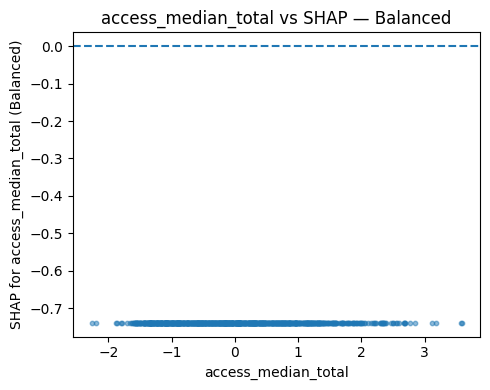

In [ ]:
feat = "access_median_total"
j = feature_names_s.index(feat)

vals_feat = X_sample_s[feat].values
shap_feat = shap_values_for_class_s[:, j]

plt.figure(figsize=(5,4))
plt.scatter(vals_feat, shap_feat, s=10, alpha=0.5)
plt.xlabel(feat)
plt.ylabel(f"SHAP for {feat} ({cname})")
plt.title(f"{feat} vs SHAP — {cname}")
plt.axhline(0, linestyle="--")
plt.tight_layout()
plt.show()

Saving XGBoost Static SHAP plots to: /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots
X_sample_s.shape: (957, 48)
shap_values_xgb_s_sample.shape: (957, 48, 4)

=== XGB Static — SHAP for type/cluster: Desert ===
Saved XGB Static beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_beeswarm_xgb_static_Desert.png


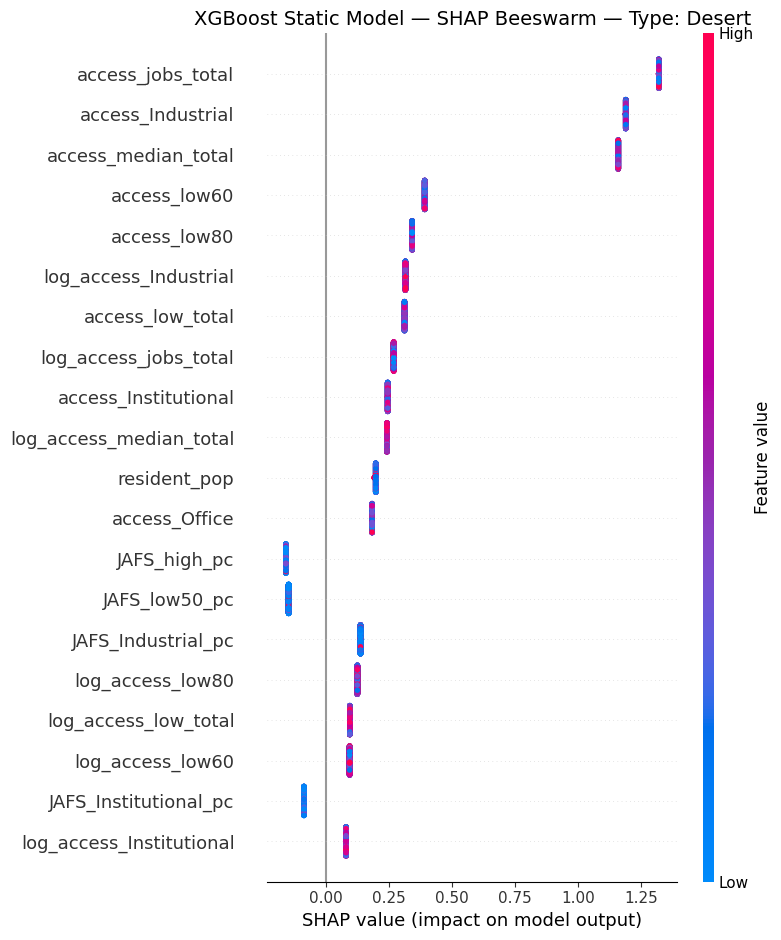

Saved XGB Static bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_bar_xgb_static_Desert.png


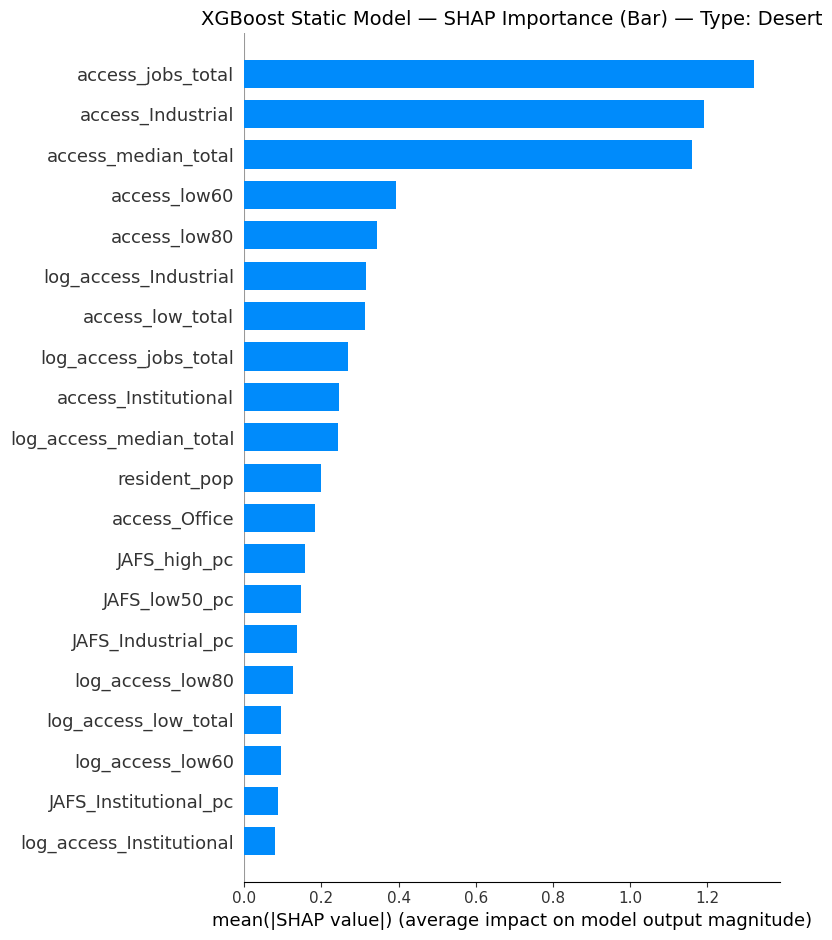


=== XGB Static — SHAP for type/cluster: HighOpp ===
Saved XGB Static beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_beeswarm_xgb_static_HighOpp.png


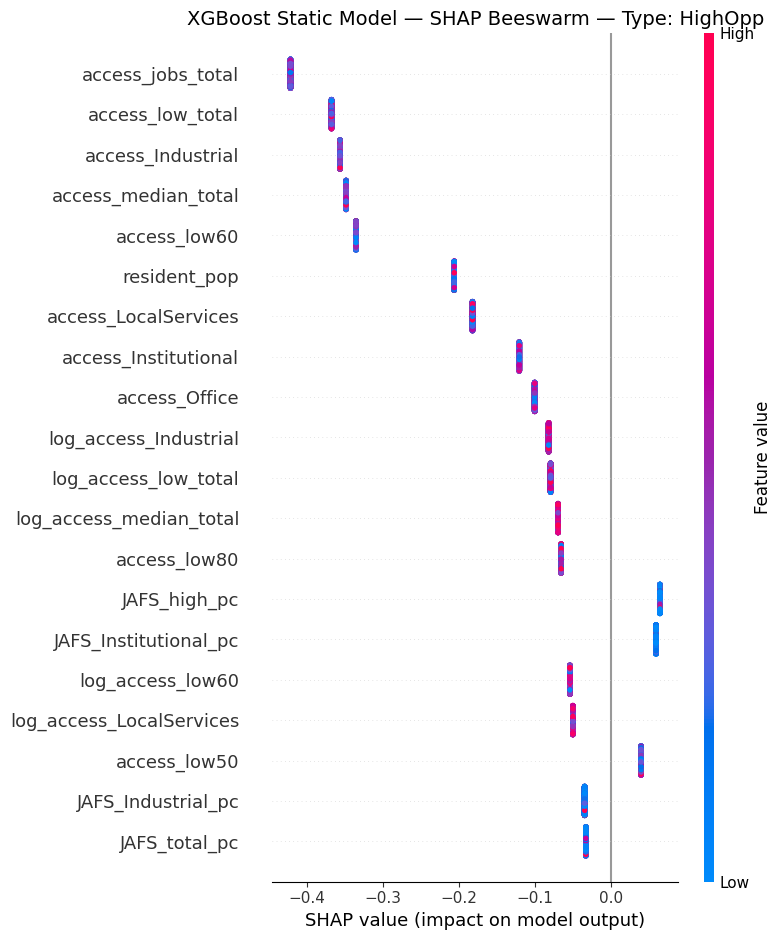

Saved XGB Static bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_bar_xgb_static_HighOpp.png


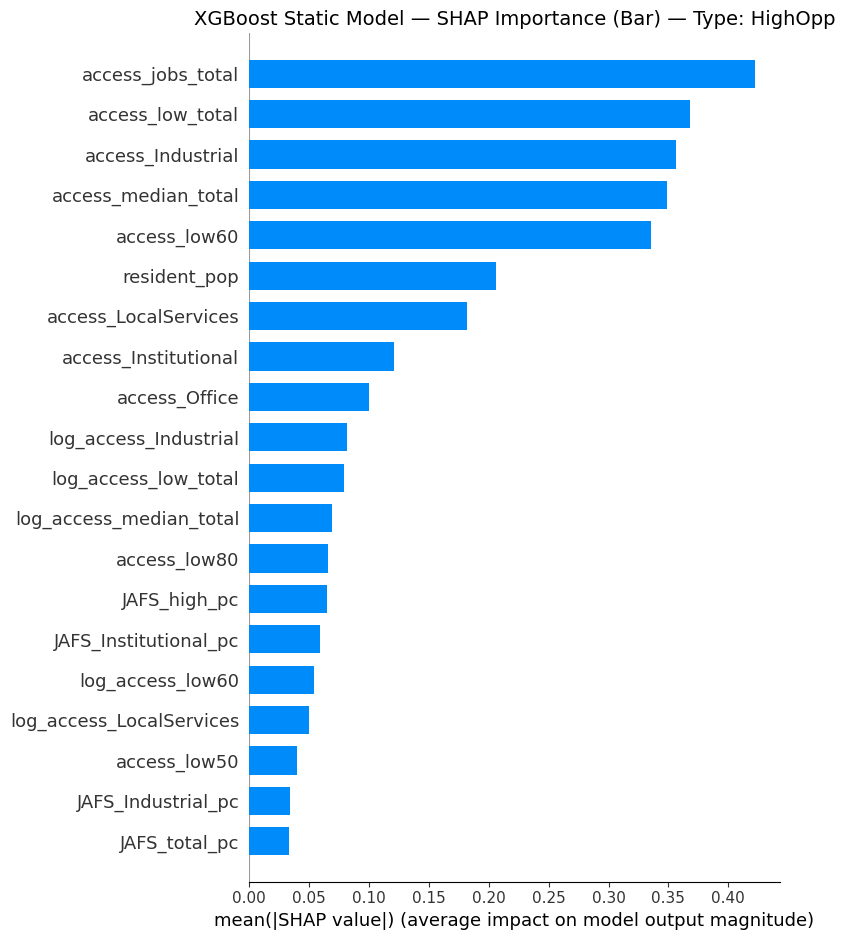


=== XGB Static — SHAP for type/cluster: Service ===
Saved XGB Static beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_beeswarm_xgb_static_Service.png


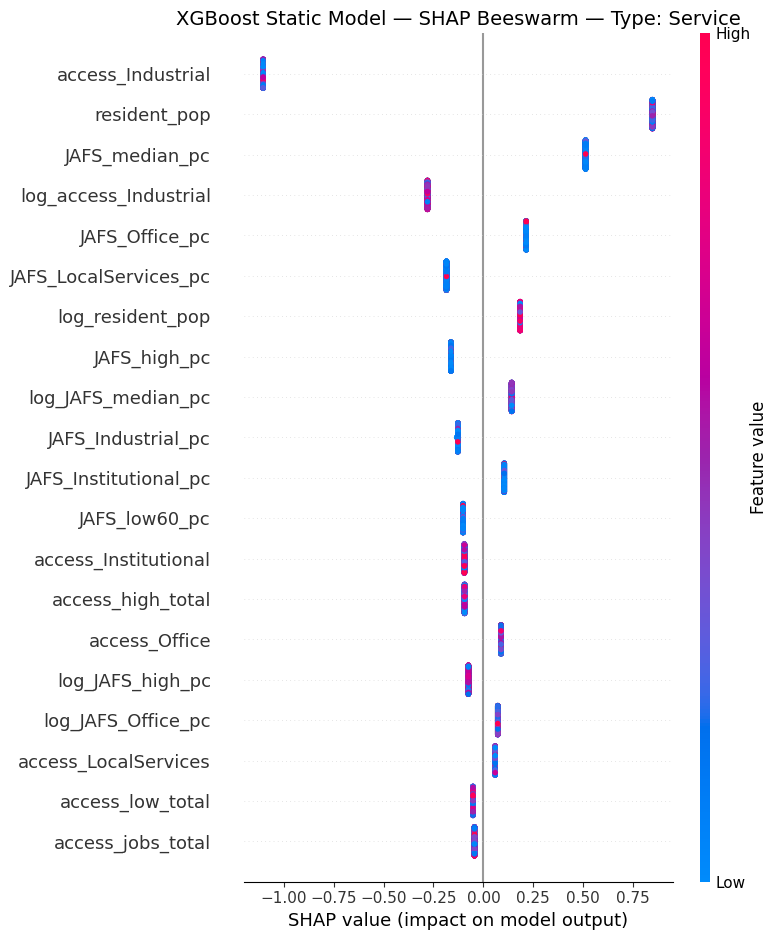

Saved XGB Static bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_bar_xgb_static_Service.png


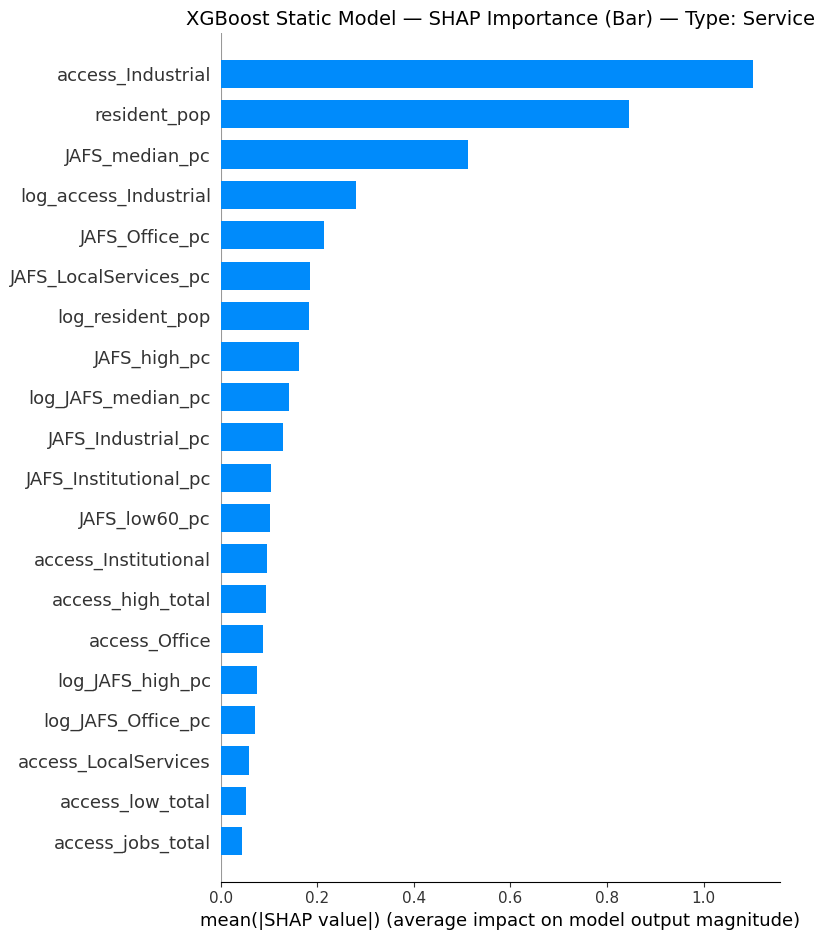


=== XGB Static — SHAP for type/cluster: Balanced ===
Saved XGB Static beeswarm → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_beeswarm_xgb_static_Balanced.png


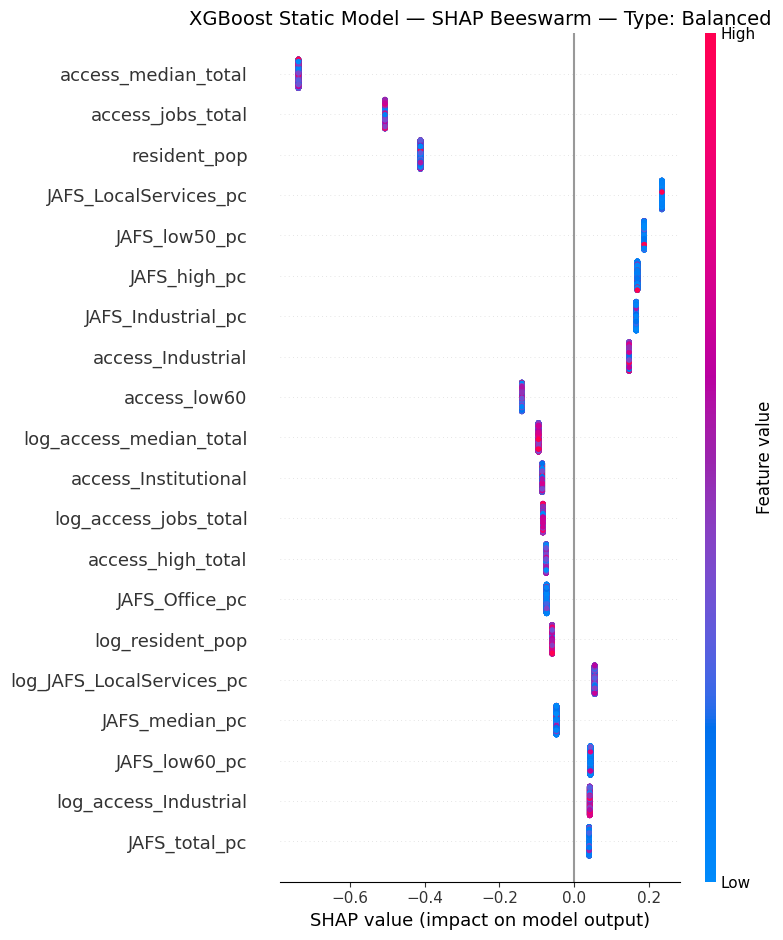

Saved XGB Static bar → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_static_cluster_plots/shap_bar_xgb_static_Balanced.png


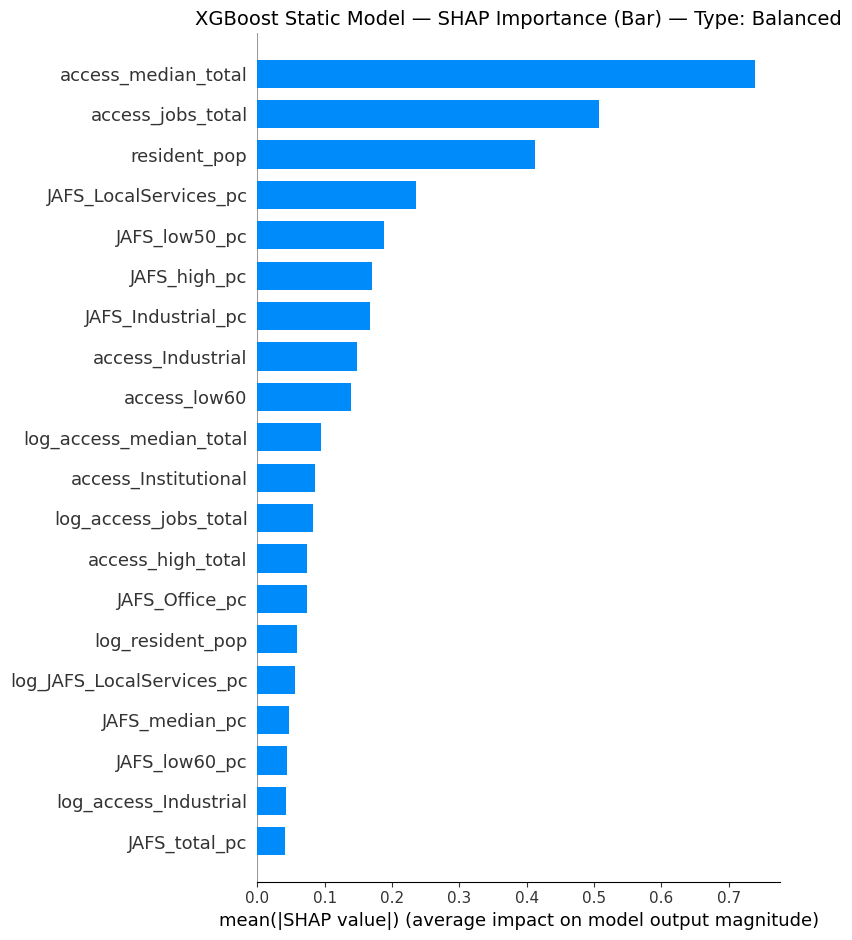

In [ ]:
# ========= 5. Static SHAP 可视化（4 types，全部样本） =========

base = "/content/drive/MyDrive/AI_DATA/dataset/created"  # 按你的路径改
folder_name_s = "XGB_static_cluster_plots"
save_dir_s = os.path.join(base, folder_name_s)
os.makedirs(save_dir_s, exist_ok=True)
print("Saving XGBoost Static SHAP plots to:", save_dir_s)

class_names   = target_names      # 例如 ["Desert", "Local", "Office", "Industrial"]，共 4 类
feature_names_s = static_cols

# 不抽样：直接用全部样本
X_sample_s = X_shap_xgb_s_df.reset_index(drop=True)   # (N_static, n_features)
shap_values_xgb_s_sample = shap_values_xgb_s          # (N_static, n_features, n_classes)

print("X_sample_s.shape:", X_sample_s.shape)
print("shap_values_xgb_s_sample.shape:", shap_values_xgb_s_sample.shape)

for cname in class_names:
    class_idx = class_names.index(cname)

    # 当前 type/cluster 的 SHAP: (N_static, n_features)
    shap_values_for_class_s = shap_values_xgb_s_sample[:, :, class_idx]

    print(f"\n=== XGB Static — SHAP for type/cluster: {cname} ===")

    # 1) Beeswarm
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class_s,
        X_sample_s,               # 用 DataFrame，自动用列名
        feature_names=feature_names_s,
        show=False
    )
    plt.title(f"XGBoost Static Model — SHAP Beeswarm — Type: {cname}", fontsize=14)
    plt.tight_layout()

    beeswarm_path_s = os.path.join(save_dir_s, f"shap_beeswarm_xgb_static_{cname}.png")
    plt.savefig(beeswarm_path_s, dpi=300)
    print(f"Saved XGB Static beeswarm → {beeswarm_path_s}")
    plt.show()

    # 2) Bar plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values_for_class_s,
        X_sample_s,
        feature_names=feature_names_s,
        plot_type="bar",
        show=False
    )
    plt.title(f"XGBoost Static Model — SHAP Importance (Bar) — Type: {cname}", fontsize=14)
    plt.tight_layout()

    bar_path_s = os.path.join(save_dir_s, f"shap_bar_xgb_static_{cname}.png")
    plt.savefig(bar_path_s, dpi=300)
    print(f"Saved XGB Static bar → {bar_path_s}")
    plt.show()

### RADAR

Saving XGBoost radar charts to: /content/drive/MyDrive/AI_DATA/dataset/created/XGB_radar_plots

=== XGBoost Radar for cluster: Desert ===
  XGB Static normalized: [0.42635422 0.27673227 0.1492385  0.14767501]
  XGB Dynamic normalized: [1. 0. 0. 0.]
  Saved XGB radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_radar_plots/radar_SHAP_XGB_Desert.png


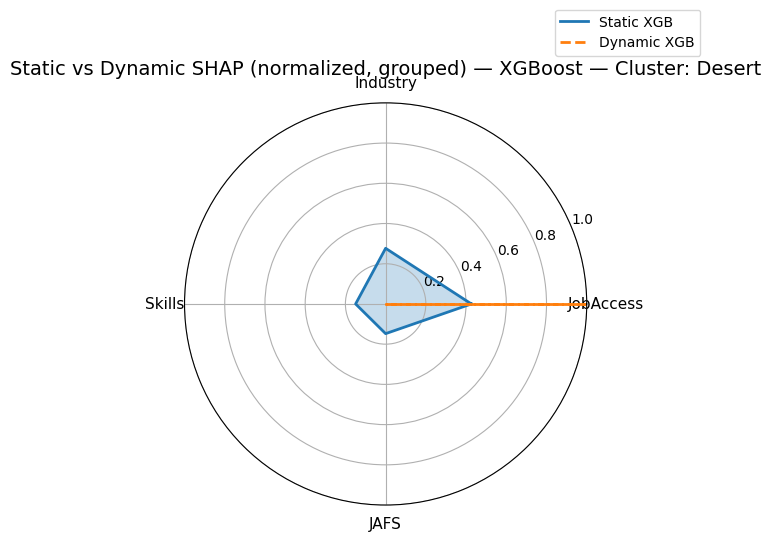


=== XGBoost Radar for cluster: HighOpp ===
  XGB Static normalized: [0.42328013 0.32259937 0.1846848  0.0694357 ]
  XGB Dynamic normalized: [0.61433934 0.38566066 0.         0.        ]
  Saved XGB radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_radar_plots/radar_SHAP_XGB_HighOpp.png


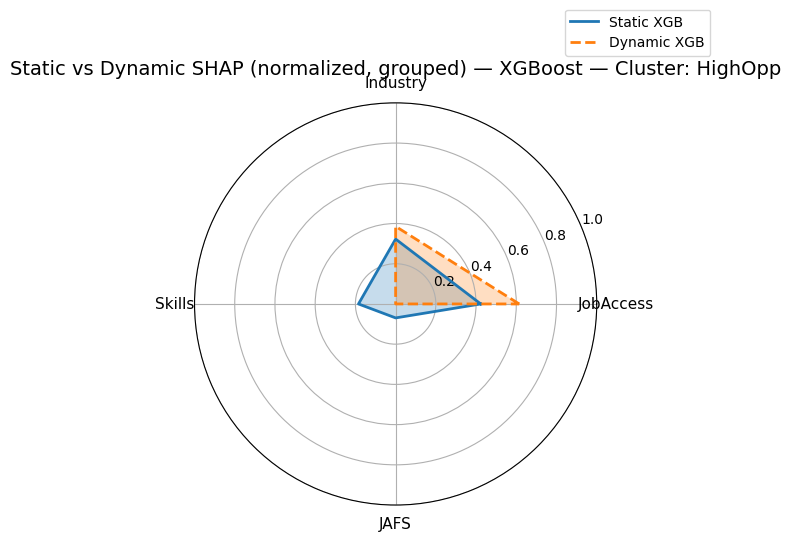


=== XGBoost Radar for cluster: Service ===
  XGB Static normalized: [0.19611317 0.324495   0.07295612 0.40643571]
  XGB Dynamic normalized: [0. 0. 0. 0.]
  Saved XGB radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_radar_plots/radar_SHAP_XGB_Service.png


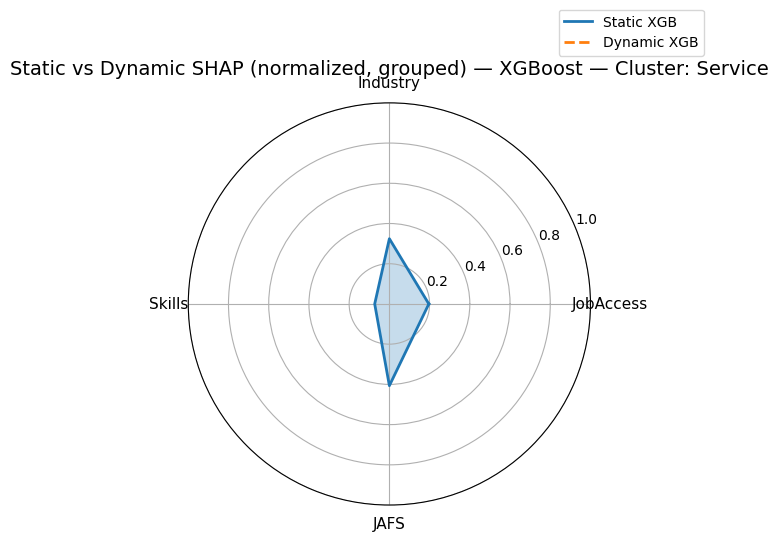


=== XGBoost Radar for cluster: Balanced ===
  XGB Static normalized: [0.41764068 0.13197853 0.07000952 0.38037127]
  XGB Dynamic normalized: [0.         0.82161081 0.17838919 0.        ]
  Saved XGB radar chart → /content/drive/MyDrive/AI_DATA/dataset/created/XGB_radar_plots/radar_SHAP_XGB_Balanced.png


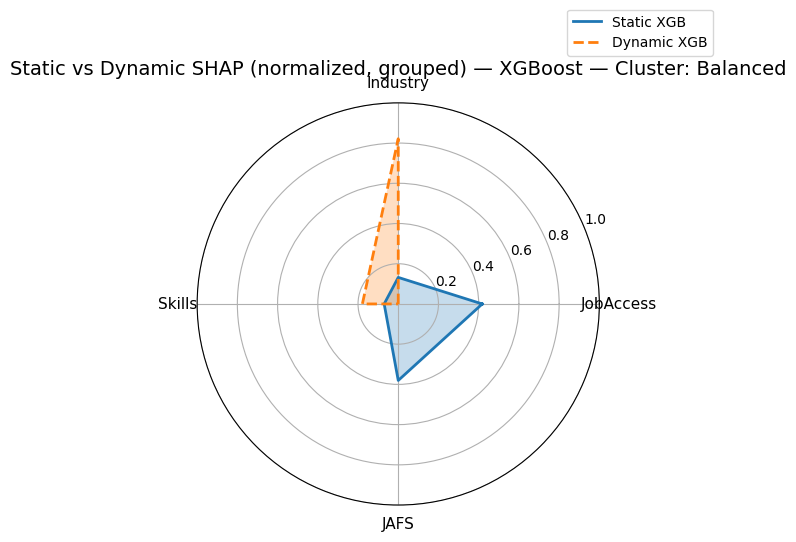

In [ ]:
feature_names_s = static_cols
feature_names_d = static_cols + embed_cols

# 2. 输出文件夹（XGBoost 专用）
folder_name_xgb = "XGB_radar_plots"
save_dir_xgb = os.path.join(base, folder_name_xgb)
os.makedirs(save_dir_xgb, exist_ok=True)
print("Saving XGBoost radar charts to:", save_dir_xgb)

# 3. 对四个 cluster/type 逐个画图
for cluster_name in target_names:   # e.g. ['HighOpp','Desert','Service','Balanced']
    print(f"\n=== XGBoost Radar for cluster: {cluster_name} ===")
    k = target_names.index(cluster_name)

    # --- Static SHAP for this cluster ---
    # shap_values_xgb_s: (N_s_xgb, 48, 4)
    shap_values_s_k = shap_values_xgb_s[:, :, k]    # (N_s_xgb, 48)

    # --- Dynamic SHAP for this cluster ---
    # shap_values_xgb_d: (N_d_xgb_sample, 176, 4)
    shap_values_d_k = shap_values_xgb_d[:, :, k]    # (N_d_xgb_sample, 176)

    # --- 按四大组聚合 SHAP（绝对值均值求和） ---
    group_scores_static = grouped_shap_mean_abs(
        shap_values_s_k,
        feature_names_s,
        groups
    )

    group_scores_dynamic = grouped_shap_mean_abs(
        shap_values_d_k,
        feature_names_d,   # dynamic: static + embed，groups 只会匹配我们给的变量名
        groups
    )

    # --- 转成向量，并做归一化（和 = 1） ---
    vals_static_raw  = np.array([group_scores_static[l]  for l in labels], dtype=float)
    vals_dynamic_raw = np.array([group_scores_dynamic[l] for l in labels], dtype=float)

    sum_static  = vals_static_raw.sum()
    sum_dynamic = vals_dynamic_raw.sum()

    if sum_static > 0:
        vals_static_norm = vals_static_raw / sum_static
    else:
        vals_static_norm = np.zeros_like(vals_static_raw)

    if sum_dynamic > 0:
        vals_dynamic_norm = vals_dynamic_raw / sum_dynamic
    else:
        vals_dynamic_norm = np.zeros_like(vals_dynamic_raw)

    print("  XGB Static normalized:",  vals_static_norm)
    print("  XGB Dynamic normalized:", vals_dynamic_norm)

    # --- 为雷达图准备闭合数据 ---
    values_static  = vals_static_norm.tolist()
    values_dynamic = vals_dynamic_norm.tolist()

    # 闭合首尾
    values_static  += values_static[:1]
    values_dynamic += values_dynamic[:1]

    num_vars = len(labels)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # --- 画雷达图 ---
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Static 曲线
    ax.plot(angles, values_static, linewidth=2, linestyle='solid', label='Static XGB')
    ax.fill(angles, values_static, alpha=0.25)

    # Dynamic 曲线（同样只在四大组上聚合）
    ax.plot(angles, values_dynamic, linewidth=2, linestyle='dashed',
            label='Dynamic XGB')
    ax.fill(angles, values_dynamic, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=11)

    ax.set_ylim(0, 1.0)   # 0~1，如果需要可以改成 0.7 / 1.0

    ax.set_title(
        f"Static vs Dynamic SHAP (normalized, grouped) — XGBoost — Cluster: {cluster_name}",
        fontsize=14,
        pad=20
    )
    ax.legend(loc='lower right', bbox_to_anchor=(1.3, 1.1))

    plt.tight_layout()

    # 保存 PNG
    save_path = os.path.join(save_dir_xgb, f"radar_SHAP_XGB_{cluster_name}.png")
    plt.savefig(save_path, dpi=300)
    print(f"  Saved XGB radar chart → {save_path}")

    plt.show()

# Maps & Graphs

## Mean Trajectory Plots

In [ ]:
profile_cols = [
    "log_access_jobs_total",
    "log_access_low_total",
    "log_access_median_total",
    "log_access_high_total",

    "log_access_Office",
    "log_access_Industrial",
    "log_access_Institutional",
    "log_access_LocalServices",

    "log_access_low50",
    "log_access_low60",
    "log_access_low80",

    "log_JAFS_total_pc",
    "log_JAFS_low_pc",
    "log_JAFS_median_pc",
    "log_JAFS_high_pc",
    "log_JAFS_low50_pc",
    "log_JAFS_low60_pc",
    "log_JAFS_low80_pc",
    "log_JAFS_Office_pc",
    "log_JAFS_Industrial_pc",
    "log_JAFS_Institutional_pc",
    "log_JAFS_LocalServices_pc",
]

In [ ]:
# Calculate the average trajectory for each dynamic cluster.
# df_panel_dyn: 2010–2022 + dyn_cluster
traj_mean = (
    df_panel_dyn
    .groupby(["dyn_cluster", "year"])[profile_cols]
    .mean()
    .reset_index()
)

# 加上语义 label
traj_mean["cluster_type"] = traj_mean["dyn_cluster"].map(mapping_dyn)

print(traj_mean.head())

   dyn_cluster  year  log_access_jobs_total  log_access_low_total  \
0            0  2010              16.418163             14.484038   
1            0  2011              16.382412             14.988197   
2            0  2012              16.328618             14.894872   
3            0  2013              16.394304             15.044176   
4            0  2014              16.424558             14.661307   

   log_access_median_total  log_access_high_total  log_access_Office  \
0                16.011667              13.920566          14.806776   
1                15.817880              13.932951          14.811584   
2                15.668071              14.306753          14.852803   
3                15.787314              14.063383          14.910210   
4                15.916195              14.455078          14.970212   

   log_access_Industrial  log_access_Institutional  log_access_LocalServices  \
0              13.834856                 15.704133                 14.33

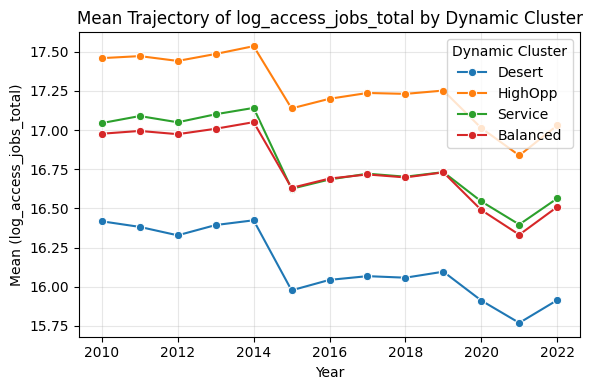

In [ ]:
# Draw a graph for a single variable example (e.g., log_access_jobs_total)

# 一整个 cell 一起运行
fig, ax = plt.subplots(figsize=(6, 4))

sns.lineplot(
    data=traj_mean,
    x="year",
    y="log_access_jobs_total",
    hue="cluster_type",
    marker="o",
    ax=ax          # 👉 很重要：把图画到这个 ax 上
)

ax.set_title("Mean Trajectory of log_access_jobs_total by Dynamic Cluster")
ax.set_xlabel("Year")
ax.set_ylabel("Mean (log_access_jobs_total)")
ax.legend(title="Dynamic Cluster")
ax.grid(True, alpha=0.3)

fig.tight_layout()

# 👉 保存：直接用 fig.savefig，而不是 plt.savefig
fig.savefig(
    "/content/drive/MyDrive/AI_DATA/Data from Task4/log_access_jobs_total_dyn_mean_trajectory.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [ ]:
# 确保输出目录存在
save_dir = "/content/drive/MyDrive/AI_DATA/created/All_Trajectories/"
os.makedirs(save_dir, exist_ok=True)

# # 你要绘图的所有变量
# profile_cols = [
#     "log_access_jobs_total",
#     "log_access_low_total",
#     "log_access_median_total",
#     "log_access_high_total",

#     "log_access_Office",
#     "log_access_Industrial",
#     "log_access_Institutional",
#     "log_access_LocalServices",

#     "log_access_low50",
#     "log_access_low60",
#     "log_access_low80",

#     "log_JAFS_total_pc",
#     "log_JAFS_low_pc",
#     "log_JAFS_median_pc",
#     "log_JAFS_high_pc",
#     "log_JAFS_low50_pc",
#     "log_JAFS_low60_pc",
#     "log_JAFS_low80_pc",
#     "log_JAFS_Office_pc",
#     "log_JAFS_Industrial_pc",
#     "log_JAFS_Institutional_pc",
#     "log_JAFS_LocalServices_pc",
# ]

# 批量生成图
for v in profile_cols:
    fig, ax = plt.subplots(figsize=(6, 4))

    sns.lineplot(
        data=traj_mean,
        x="year",
        y=v,
        hue="cluster_type",
        marker="o",
        ax=ax
    )

    ax.set_title(f"Mean Trajectory of {v} by Dynamic Cluster")
    ax.set_xlabel("Year")
    ax.set_ylabel(f"Mean ({v})")
    ax.grid(True, alpha=0.3)
    ax.legend(title="Dynamic Cluster")
    fig.tight_layout()

    # 保存文件
    file_path = os.path.join(save_dir, f"{v}_dyn_mean_trajectory.png")
    fig.savefig(file_path, dpi=300, bbox_inches="tight")

    plt.close(fig)  # 关闭 figure，防止内存堆积

print("✅ All trajectory plots have been generated and saved!")

✅ All trajectory plots have been generated and saved!


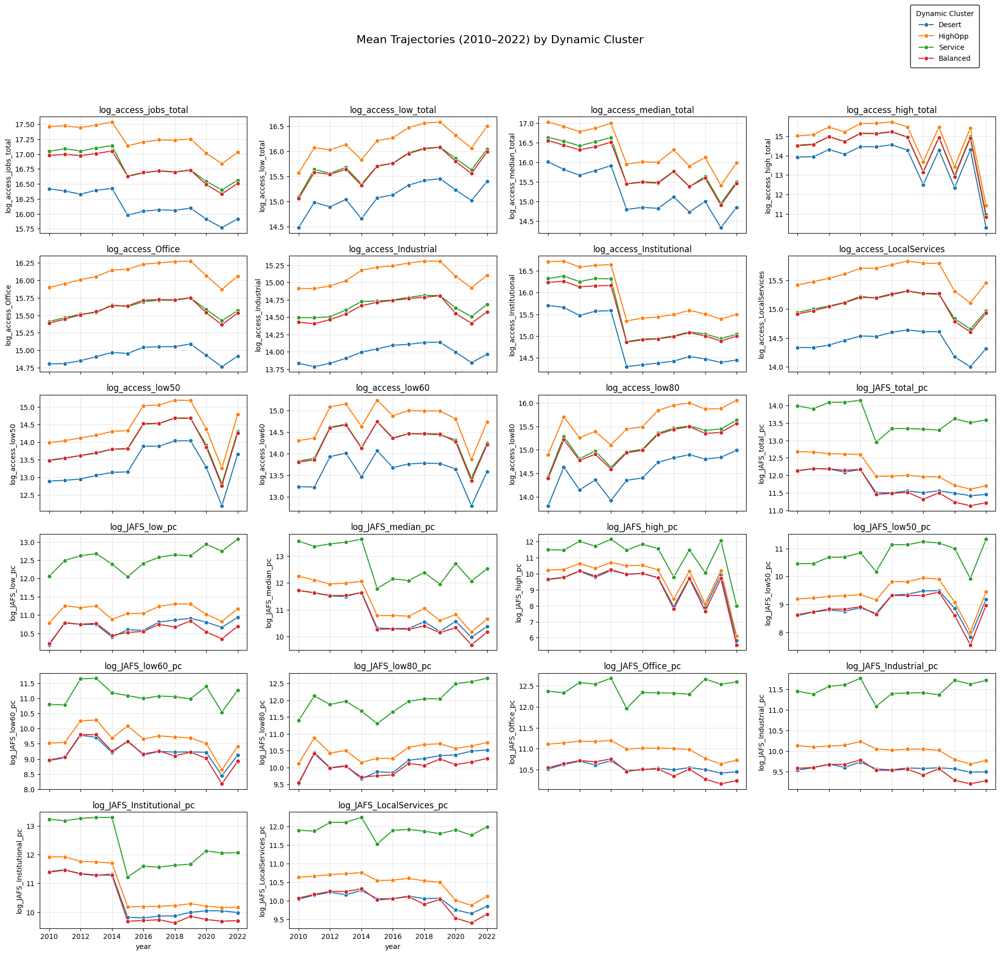

✅ Figure saved to: /content/drive/MyDrive/AI_DATA/created/All_Trajectories/dyn_mean_trajectories_grid.png


In [ ]:
# ====== 可选：确保保存目录存在 ======
save_dir = "/content/drive/MyDrive/AI_DATA/created/All_Trajectories/"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "dyn_mean_trajectories_grid.png")

# ====== 子图网格设置 ======
n_vars = len(profile_cols)          # 22
n_cols = 4
n_rows = (n_vars + n_cols - 1) // n_cols

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(5 * n_cols, 3 * n_rows),
    sharex=True
)
axes = axes.flatten()

for i, var in enumerate(profile_cols):
    ax = axes[i]
    sns.lineplot(
        data=traj_mean,
        x="year",
        y=var,
        hue="cluster_type",
        marker="o",
        ax=ax,
        # 只在第一个子图上生成 legend，后面统一到 fig 上
        legend="brief" if i == 0 else False
    )
    ax.set_title(var)
    ax.grid(True, alpha=0.3)

# 删除多余空子图（22 不是 4 的倍数）
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# 从第一个子图拿到 legend 信息
handles, labels = axes[0].get_legend_handles_labels()
if axes[0].get_legend() is not None:
    axes[0].get_legend().remove()

leg = fig.legend(
    handles,
    labels,
    title="Dynamic Cluster",
    loc="lower right",
    bbox_to_anchor=(0.98, 0.98),
    ncol=1,
    frameon=True,
    fancybox=True,
    borderpad=0.8,
    labelspacing=0.6
)
frame = leg.get_frame()
frame.set_edgecolor("black")
frame.set_linewidth(1.2)

fig.suptitle("Mean Trajectories (2010–2022) by Dynamic Cluster",
             y=1.02, fontsize=16)
fig.tight_layout(rect=(0, 0, 1, 0.97))

fig.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig)

print("✅ Figure saved to:", save_path)

## UMAP Embedding Visualization

In [ ]:
# embedding + label

# 选出所有 emb_ 列
emb_cols = [c for c in df_embed.columns if c.startswith("emb_")]

X_emb = df_embed[emb_cols].values

scaler_emb = StandardScaler()
X_emb_scaled = scaler_emb.fit_transform(X_emb)

# 加 cluster_type
df_embed["cluster_type"] = df_embed["dyn_cluster"].map(mapping_dyn)

In [ ]:
!pip install umap-learn

In [ ]:
# UMAP
import umap.umap_ as umap

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
emb_2d = reducer.fit_transform(X_emb_scaled)

df_embed["umap_x"] = emb_2d[:, 0]
df_embed["umap_y"] = emb_2d[:, 1]

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


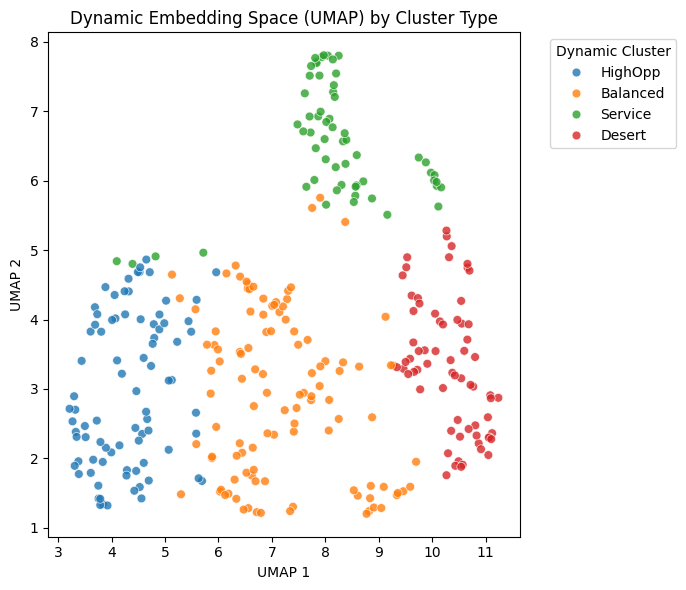

Saved to: /content/drive/MyDrive/AI_DATA/Data from Task4/UMAP_dynamic_clusters.png


In [ ]:
# EXACT color palette you requested
cluster_palette = {
    "HighOpp":  "#1f77b4",   # Blue
    "Balanced": "#ff7f0e",   # Orange
    "Service":  "#2ca02c",   # Green
    "Desert":   "#d62728",   # Red
}

plt.figure(figsize=(7,6))

sns.scatterplot(
    data=df_embed,
    x="umap_x",
    y="umap_y",
    hue="cluster_type",
    palette=cluster_palette,
    s=40,
    alpha=0.8
)

plt.title("Dynamic Embedding Space (UMAP) by Cluster Type")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

# Fix legend order
order = ["HighOpp", "Balanced", "Service", "Desert"]
handles, labels = plt.gca().get_legend_handles_labels()

plt.legend(
    [handles[labels.index(k)] for k in order],
    order,
    title="Dynamic Cluster",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.tight_layout()

# ⭐ Save BEFORE show() — ensures NOT blank
save_path = "/content/drive/MyDrive/AI_DATA/Data from Task4/UMAP_dynamic_clusters.png"
plt.savefig(save_path, dpi=300, bbox_inches="tight")

plt.show()

print("Saved to:", save_path)

## Static vs Dynamic Cross-Tab

In [ ]:
df_full_dynamic = pd.read_parquet(
    "/content/drive/MyDrive/AI_DATA/dataset/created/df_full_dynamic_text.parquet"
)

In [ ]:
df_full_dynamic

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,emb_121,emb_122,emb_123,emb_124,emb_125,emb_126,emb_127,emb_128,dyn_cluster,dyn_cluster_type
0,36005000200,2010,27237182.0,3959411.0,18355470.0,2384769,0,828657.0,1032952.0,2097802,...,-0.477033,0.414980,-0.673223,-0.022596,0.497645,-0.461841,0.477081,0.004471,3,Balanced
1,36005000400,2010,31967034.0,4772822.0,21579992.0,2930698,0,1007148.0,1265549.0,2500125,...,-0.499714,0.287424,-0.448853,0.129265,0.544177,-0.497665,0.569492,-0.027094,1,HighOpp
2,36005001600,2010,39808325.0,5697632.0,26905254.0,3489877,0,1235032.0,1521902.0,2940698,...,-0.454284,0.160410,-0.181611,0.071482,0.548824,-0.558367,0.494291,0.129488,1,HighOpp
3,36005001901,2010,1985105.0,406442.0,910977.0,250150,0,97799.0,117755.0,190888,...,-0.544550,0.503184,-0.825959,-0.263778,0.551727,-0.207290,0.342099,-0.048770,2,Service
4,36005002001,2010,41965318.0,4542983.0,30269082.0,2680302,0,898238.0,1265431.0,2379314,...,-0.541545,0.490232,-0.650155,-0.033524,0.484193,-0.470414,0.414004,0.124628,3,Balanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4142,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,-0.510981,0.518581,-0.505228,-0.143757,0.545836,-0.527041,0.413015,0.067559,3,Balanced
4143,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,-0.571773,0.614241,-0.681262,0.026081,0.393321,-0.459685,0.457362,-0.054270,1,HighOpp
4144,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,-0.579000,0.808243,-0.930730,-0.037507,-0.453308,-0.168311,0.449506,-0.395649,2,Service
4145,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,-0.583787,0.710342,-0.839252,-0.227705,0.460816,-0.341521,0.280334,-0.115110,2,Service


In [ ]:
cols = ["h_tract", "year", "dyn_cluster", "dyn_cluster_type"]

df_dyn_table = df_full_dynamic[cols].copy()

df_dyn_table.head()

,h_tract,year,dyn_cluster,dyn_cluster_type
0,36005000200,2010,3,Balanced
1,36005000400,2010,1,HighOpp
2,36005001600,2010,1,HighOpp
3,36005001901,2010,2,Service
4,36005002001,2010,3,Balanced


Result: 0: 'Desert', 1: 'HighOpp', 2: 'Service', 3: 'Balanced'

In [ ]:
df_dyn_table.to_parquet("/content/drive/MyDrive/AI_DATA/dataset/created/df_dyn_table.parquet", index=False)

In [ ]:
df_panel_3years = df_panel[df_panel["year"].isin([2015, 2019, 2022])].copy()

In [ ]:
# without 'log_JAFS_total_pc'
static_features = [
    'log_access_jobs_total',
    'log_access_low_total',
    'log_access_median_total',
    'log_access_high_total',
    'log_access_low50',
    'log_access_low60',
    'log_access_low80',
    'log_access_Office',
    'log_access_Industrial',
    'log_access_Institutional',
    'log_access_LocalServices',
    'log_resident_pop',
    'log_JAFS_low_pc',
    'log_JAFS_median_pc',
    'log_JAFS_high_pc',
    'log_JAFS_low50_pc',
    'log_JAFS_low60_pc',
    'log_JAFS_low80_pc',
    'log_JAFS_Office_pc',
    'log_JAFS_Industrial_pc',
    'log_JAFS_Institutional_pc',
    'log_JAFS_LocalServices_pc'
]

In [ ]:
# Performing static clustering in 2022 (generating static_cluster_type)

X = df_panel_3years[static_features].values
X_scaled = StandardScaler().fit_transform(X)

km_static = KMeans(n_clusters=4, random_state=0)
km_static.fit(X_scaled)


df_panel_3years["static_cluster_type"] = km_static.labels_

In [ ]:
df_panel_3years[["h_tract", "static_cluster_type"]].head()

,h_tract,static_cluster_type
1595,36005000200,0
1596,36005000400,0
1597,36005001600,2
1598,36005001901,1
1599,36005002001,0


In [ ]:
df_panel_3years

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,log_JAFS_median_pc,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc,static_cluster_type
1595,36005000200,2015,18889558.0,7313222.0,6175993.0,4495346,0,1122365.0,2974248.0,3216609,...,10.815919,10.498299,9.110778,10.085262,10.163595,11.011487,10.097680,10.050211,10.519420,0
1596,36005000400,2015,24230714.0,9796001.0,7747923.0,5280163,0,1335853.0,3507170.0,4952978,...,10.839074,10.455616,9.081314,10.046483,10.391650,10.942032,10.234063,10.304937,10.489754,0
1597,36005001600,2015,25818114.0,10507877.0,8233708.0,5405155,0,1454138.0,3579344.0,5474395,...,9.153063,8.732236,7.419734,8.320144,8.744962,9.240555,8.451721,8.730033,8.782537,2
1598,36005001901,2015,4049787.0,1776856.0,1077489.0,924481,0,270799.0,692749.0,813308,...,13.196999,13.043843,11.815992,12.755279,12.915720,13.570882,12.288850,12.766585,13.197188,1
1599,36005002001,2015,19020244.0,7280173.0,5773231.0,4272674,0,1127893.0,2893574.0,3258706,...,10.973640,10.672654,9.340830,10.282917,10.401751,11.160994,10.330816,10.257688,10.725866,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4142,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,10.061236,5.875456,8.782998,8.846481,10.508005,10.128714,9.555923,9.961792,9.508316,2
4143,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,11.179981,6.841081,10.036676,9.945355,11.602107,11.249129,10.723548,10.997401,10.685182,0
4144,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,13.406971,9.342158,12.225462,12.245639,13.766192,13.475981,12.980630,13.085443,12.928746,1
4145,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,11.533598,7.113793,10.388381,10.255018,11.898492,11.602310,10.837931,11.408634,11.017052,1


In [ ]:
df_dyn_table

,h_tract,year,dyn_cluster,dyn_cluster_type
0,36005000200,2010,3,Balanced
1,36005000400,2010,1,HighOpp
2,36005001600,2010,1,HighOpp
3,36005001901,2010,2,Service
4,36005002001,2010,3,Balanced
...,...,...,...,...
4142,36005046206,2022,3,Balanced
4143,36005046208,2022,1,HighOpp
4144,36005046209,2022,2,Service
4145,36005048401,2022,2,Service


In [ ]:
# Dynamic cluster type data merged into 2022 data.
# 从 dynamic label 表里取出 tract → dyn_cluster_type
df_dyn_map = df_dyn_table[["h_tract", "dyn_cluster_type"]].drop_duplicates()

# 合到 2022 的 panel 上
df_panel_3years = df_panel_3years.merge(
    df_dyn_map,
    on="h_tract",
    how="left"
)

df_panel_3years[["h_tract", "static_cluster_type", "dyn_cluster_type"]].head()

,h_tract,static_cluster_type,dyn_cluster_type
0,36005000200,0,Balanced
1,36005000400,0,HighOpp
2,36005001600,2,HighOpp
3,36005001901,1,Service
4,36005002001,0,Balanced


Result: 0: 'Desert', 1: 'HighOpp', 2: 'Service', 3: 'Balanced'

In [ ]:
mapping_static = {
    3: "Balanced",
    0: "Desert",
    2: "Service",
    1: "HighOpp"
}

In [ ]:
df_panel_3years["static_cluster_type"] = \
    df_panel_3years["static_cluster_type"].map(mapping_static)

In [ ]:
 df_panel_3years

,h_tract,year,access_jobs_total,access_low_total,access_median_total,access_high_total,access_low30,access_low50,access_low60,access_low80,...,log_JAFS_high_pc,log_JAFS_low50_pc,log_JAFS_low60_pc,log_JAFS_low80_pc,log_JAFS_Office_pc,log_JAFS_Industrial_pc,log_JAFS_Institutional_pc,log_JAFS_LocalServices_pc,static_cluster_type,dyn_cluster_type
0,36005000200,2015,18889558.0,7313222.0,6175993.0,4495346,0,1122365.0,2974248.0,3216609,...,10.498299,9.110778,10.085262,10.163595,11.011487,10.097680,10.050211,10.519420,Desert,Balanced
1,36005000400,2015,24230714.0,9796001.0,7747923.0,5280163,0,1335853.0,3507170.0,4952978,...,10.455616,9.081314,10.046483,10.391650,10.942032,10.234063,10.304937,10.489754,Desert,HighOpp
2,36005001600,2015,25818114.0,10507877.0,8233708.0,5405155,0,1454138.0,3579344.0,5474395,...,8.732236,7.419734,8.320144,8.744962,9.240555,8.451721,8.730033,8.782537,Service,HighOpp
3,36005001901,2015,4049787.0,1776856.0,1077489.0,924481,0,270799.0,692749.0,813308,...,13.043843,11.815992,12.755279,12.915720,13.570882,12.288850,12.766585,13.197188,HighOpp,Service
4,36005002001,2015,19020244.0,7280173.0,5773231.0,4272674,0,1127893.0,2893574.0,3258706,...,10.672654,9.340830,10.282917,10.401751,11.160994,10.330816,10.257688,10.725866,Desert,Balanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,36005046206,2022,18155927.0,11517638.0,5385779.0,81693,0,1499923.0,1598245.0,8419470,...,5.875456,8.782998,8.846481,10.508005,10.128714,9.555923,9.961792,9.508316,Service,Balanced
953,36005046208,2022,19196387.0,12242346.0,5734400.0,74760,0,1827864.0,1668330.0,8746152,...,6.841081,10.036676,9.945355,11.602107,11.249129,10.723548,10.997401,10.685182,Desert,HighOpp
954,36005046209,2022,15252979.0,9547041.0,4652336.0,79856,0,1427403.0,1456497.0,6663141,...,9.342158,12.225462,12.245639,13.766192,13.475981,12.980630,13.085443,12.928746,HighOpp,Service
955,36005048401,2022,13193852.0,8317865.0,4083509.0,49112,0,1299162.0,1136953.0,5881750,...,7.113793,10.388381,10.255018,11.898492,11.602310,10.837931,11.408634,11.017052,HighOpp,Service


In [ ]:
# Creating a cross-tabulation (comparison table) for static vs. dynamic data.
# 计数版
ct_counts = pd.crosstab(
    df_panel_3years["static_cluster_type"],
    df_panel_3years["dyn_cluster_type"]
)

# 行标准化（每个 static cluster 内部的比例）
ct_row_norm = pd.crosstab(
    df_panel_3years["static_cluster_type"],
    df_panel_3years["dyn_cluster_type"],
    normalize="index"
).round(3)

print("Counts:")
print(ct_counts)

print("\nRow-normalized proportions:")
print(ct_row_norm)

Counts:
dyn_cluster_type     Balanced  Desert  HighOpp  Service
static_cluster_type                                    
Balanced                   41     183        0       11
Desert                     62       0      193       29
HighOpp                     9      13       10      132
Service                   218       5       46        5

Row-normalized proportions:
dyn_cluster_type     Balanced  Desert  HighOpp  Service
static_cluster_type                                    
Balanced                0.174   0.779    0.000    0.047
Desert                  0.218   0.000    0.680    0.102
HighOpp                 0.055   0.079    0.061    0.805
Service                 0.796   0.018    0.168    0.018


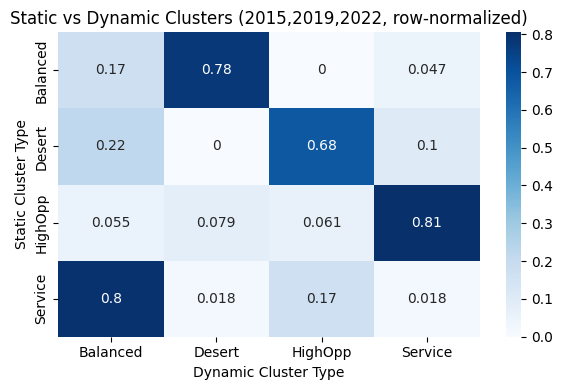

Saved to: /content/drive/MyDrive/AI_DATA/static_vs_dynamic_heatmap_2022.png


In [ ]:
plt.figure(figsize=(6,4))

sns.heatmap(ct_row_norm, annot=True, cmap="Blues")

plt.title("Static vs Dynamic Clusters (2015,2019,2022, row-normalized)")
plt.xlabel("Dynamic Cluster Type")
plt.ylabel("Static Cluster Type")

plt.tight_layout()

# ⭐ 保存图像（必须在 show() 前）
save_path = "/content/drive/MyDrive/AI_DATA/static_vs_dynamic_heatmap_2022.png"
plt.savefig(save_path, dpi=300, bbox_inches="tight")

plt.show()

print("Saved to:", save_path)

## Load different dataset for Map

In [ ]:
# 读取纽约市普查区
gdf_nta = gpd.read_file("/content/drive/MyDrive/AI_DATA/nynta2020_25d/nynta2020.shp")

In [ ]:
gdf_nta.shape

(262, 12)

In [ ]:
gdf_nta.columns

Index(['NTAName', 'geometry'], dtype='object')

In [ ]:
gdf_nta = gdf_nta[["NTAName", "geometry"]]
gdf_nta = gdf_nta.to_crs(epsg=4326)

In [ ]:
df_full_dynamic=pd.read_parquet("/content/drive/MyDrive/AI_DATA/dataset/created/df_full_dynamic_text.parquet")

In [ ]:
df_full_dynamic.shape

(4147, 180)

In [ ]:
df_full_dynamic.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125', 'emb_126',
       'emb_127', 'emb_128', 'dyn_cluster', 'dyn_cluster_type'],
      dtype='object', length=180)

In [ ]:
valid_tracts = (
    df_panel["h_tract"]
    .astype(str)
    .str.zfill(11)
    .unique()
)

len(valid_tracts)

319

In [ ]:
df_full_dynamic["h_tract"] = (
    df_full_dynamic["h_tract"]
    .astype(str)
    .str.strip()
    .str.zfill(11)
)

In [ ]:
df_full_dynamic = df_full_dynamic[
    df_full_dynamic["h_tract"].isin(valid_tracts)
].copy()

print(df_full_dynamic.shape)

(4147, 180)


In [ ]:
gdf_tract = gpd.read_file("/content/drive/MyDrive/AI_DATA/nyct2020_25d/nyct2020.shp")

In [ ]:
gdf_tract.columns

Index(['CTLabel', 'BoroCode', 'BoroName', 'CT2020', 'BoroCT2020', 'CDEligibil',
       'NTAName', 'NTA2020', 'CDTA2020', 'CDTANAME', 'GEOID', 'PUMA',
       'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object')

In [ ]:
gdf_tract.shape

(2325, 15)

In [ ]:
gdf_tract_filtered = gdf_tract[gdf_tract["GEOID"].isin(valid_tracts)].copy()
print(gdf_tract_filtered.shape)

(319, 15)


In [ ]:
gdf_tract_filtered.to_file("/content/drive/MyDrive/AI_DATA/dataset/created/gdf_tract_filtered.shp", driver="ESRI Shapefile")

In [ ]:
gdf_tract_filtered.columns

Index(['CTLabel', 'BoroCode', 'BoroName', 'CT2020', 'BoroCT2020', 'CDEligibil',
       'NTAName', 'NTA2020', 'CDTA2020', 'CDTANAME', 'GEOID', 'PUMA',
       'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object')

## Bronx Dynamic Cluster Map

In [ ]:
from matplotlib.patches import Patch

In [ ]:
!pip install contextily

In [ ]:
import contextily as ctx

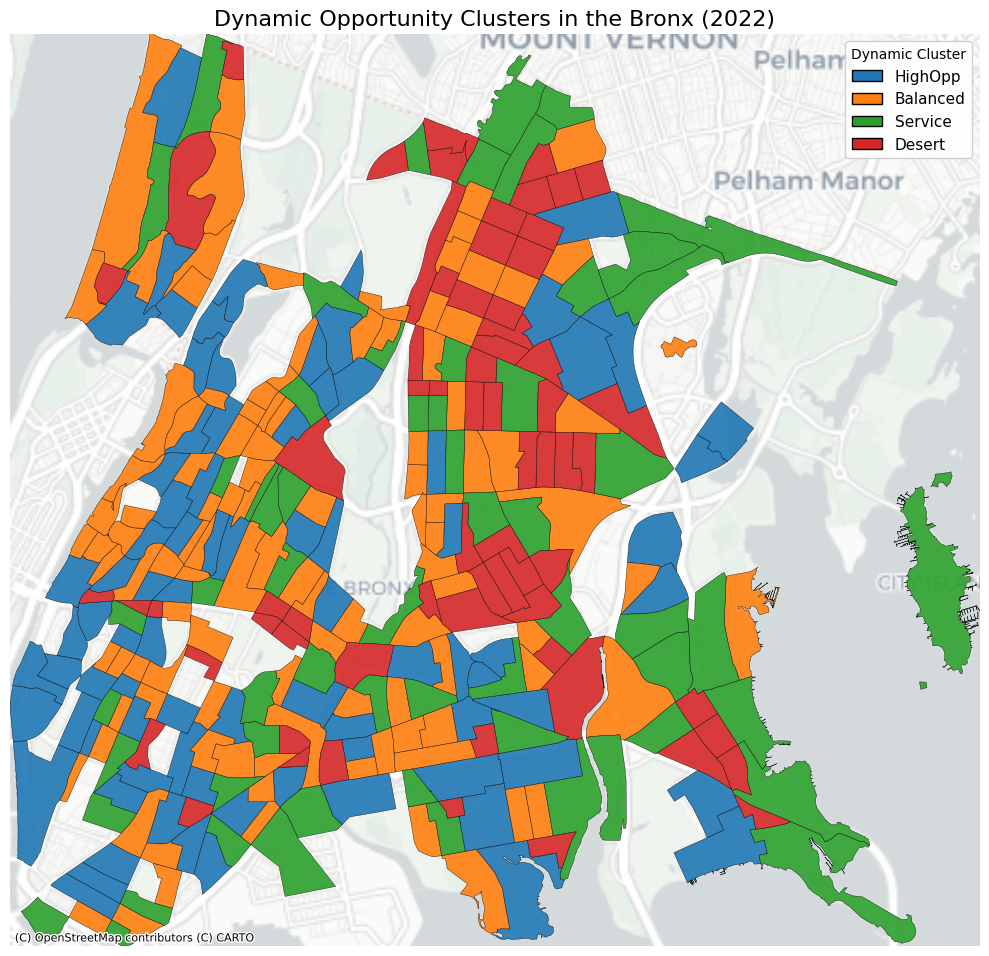

In [ ]:
# 0. 选择年份
# ================================
year_sel = 2022

# ================================
# 1. 配色方案（和你 Folium 一致）
# ================================
cluster_colors = {
    "HighOpp":  "#1f77b4",   # Blue
    "Balanced": "#ff7f0e",   # Orange
    "Service":  "#2ca02c",   # Green
    "Desert":   "#d62728",   # Red
}
cluster_order = ["HighOpp", "Balanced", "Service", "Desert"]

# ================================
# 2. 取该年的动态簇并 merge 到 Bronx tracts
# ================================
cols_keep = ["h_tract", "year", "dyn_cluster_type"]
df_dyn_year = (
    df_full_dynamic.loc[df_full_dynamic["year"] == year_sel, cols_keep]
    .drop_duplicates(subset=["h_tract"])
)

gdf_dyn = gdf_tract_filtered.merge(
    df_dyn_year,
    left_on="GEOID",    # 如果 h_tract 不是 GEOID，请改这里
    right_on="h_tract",
    how="left"
)

gdf_dyn["dyn_cluster_type"] = pd.Categorical(
    gdf_dyn["dyn_cluster_type"],
    categories=cluster_order,
    ordered=True
)

# ================================
# 3. 转成 Web Mercator（EPSG:3857）给底图用
# ================================
gdf_dyn_web = gdf_dyn.to_crs(epsg=3857)

# ================================
# 4. 画图：先画 polygon，再加底图
# ================================
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# 按 cluster 分层画，确保颜色干净
for cl in cluster_order:
    sub = gdf_dyn_web[gdf_dyn_web["dyn_cluster_type"] == cl]
    if len(sub) == 0:
        continue
    sub.plot(
        ax=ax,
        color=cluster_colors[cl],
        edgecolor="black",
        linewidth=0.3,
        alpha=0.9,
        zorder=2
    )

# 没有 cluster 的区域（公园/机场等）灰色
sub_na = gdf_dyn_web[gdf_dyn_web["dyn_cluster_type"].isna()]
if len(sub_na) > 0:
    sub_na.plot(
        ax=ax,
        color="lightgray",
        edgecolor="none",
        alpha=0.6,
        zorder=2
    )

# 设定范围（用 polygon 的范围），然后加底图
ax.set_xlim(gdf_dyn_web.total_bounds[0], gdf_dyn_web.total_bounds[2])
ax.set_ylim(gdf_dyn_web.total_bounds[1], gdf_dyn_web.total_bounds[3])

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,  # 和你 p2 一样的底图
    zoom=12,
    zorder=1
)

# 标题 & 去坐标轴
ax.set_title(f"Dynamic Opportunity Clusters in the Bronx ({year_sel})", fontsize=16)
ax.set_axis_off()

# ================================
# 5. 自定义图例
# ================================
legend_elements = [
    Patch(facecolor=cluster_colors["HighOpp"],  edgecolor="black", label="HighOpp"),
    Patch(facecolor=cluster_colors["Balanced"], edgecolor="black", label="Balanced"),
    Patch(facecolor=cluster_colors["Service"],  edgecolor="black", label="Service"),
    Patch(facecolor=cluster_colors["Desert"],   edgecolor="black", label="Desert"),
]
if len(sub_na) > 0:
    legend_elements.append(
        Patch(facecolor="lightgray", edgecolor="none", label="No Data / Excluded")
    )

ax.legend(
    handles=legend_elements,
    title="Dynamic Cluster",
    loc="upper right",
    frameon=True,
    framealpha=0.9,
    fontsize=11
)

plt.tight_layout()
plt.show()

## Median job accessibility quintile map

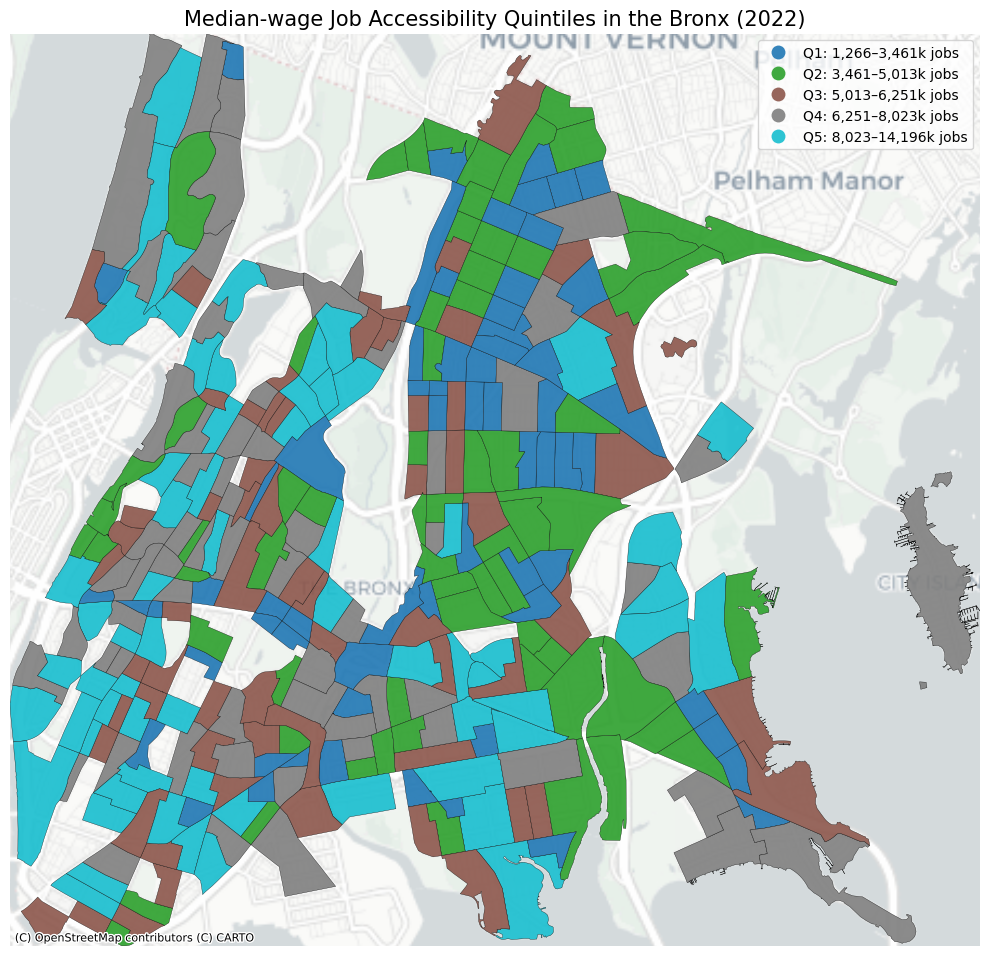

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx

year_sel = 2022

# 1. 取该年的 median job access
df_acc_year = (
    df_full_dynamic.loc[
        df_full_dynamic["year"] == year_sel,
        ["h_tract", "year", "access_median_total"]
    ]
    .drop_duplicates(subset=["h_tract"])
)

# 2. 合并到 Bronx tracts
gdf_acc = gdf_tract_filtered.merge(
    df_acc_year,
    left_on="GEOID",
    right_on="h_tract",
    how="left"
)

# 只保留有值的 tract
gdf_acc = gdf_acc[gdf_acc["access_median_total"].notna()].copy()

# 3. 五分位区间（先用 qcut 得到 bins）
gdf_acc["acc_q_raw"] = pd.qcut(
    gdf_acc["access_median_total"],
    q=5
)

bins = gdf_acc["acc_q_raw"].cat.categories  # IntervalIndex

# 4. 把区间变成人类可读的标签
#    这里我按“千个 job”显示，例如 1,266k–3,461k
labels = []
for i, interval in enumerate(bins):
    low = interval.left
    high = interval.right
    label = f"Q{i+1}: {low/1000:,.0f}–{high/1000:,.0f}k jobs"
    labels.append(label)

# 建立从 Interval -> 文本标签的映射
label_map = {bins[i]: labels[i] for i in range(len(bins))}

gdf_acc["acc_q"] = gdf_acc["acc_q_raw"].map(label_map)
gdf_acc["acc_q"] = pd.Categorical(gdf_acc["acc_q"], categories=labels, ordered=True)

# 5. 投影到 EPSG:3857
gdf_acc_web = gdf_acc.to_crs(epsg=3857)
bounds = gdf_acc_web.total_bounds

# 6. 画图（带底图 + 好看的 legend）
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

gdf_acc_web.plot(
    column="acc_q",
    ax=ax,
    legend=True,
    categorical=True,
    edgecolor="black",
    linewidth=0.25,
    alpha=0.9,
    zorder=2
)

ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=12,
    zorder=1
)

ax.set_axis_off()
ax.set_title(
    f"Median-wage Job Accessibility Quintiles in the Bronx ({year_sel})",
    fontsize=15
)

plt.tight_layout()
plt.show()

all features maps

In [ ]:
# ============================================
# Basic settings
# ============================================
year_sel = 2022  # <- change year here if needed

# output folder (change to your own path)
out_dir = "/content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final"
os.makedirs(out_dir, exist_ok=True)

# ============================================
# Variables to map (your list)
# ============================================
vars_to_map = [
    # --- total + wage tiers ---
    "access_jobs_total", "access_low_total",
    "access_median_total", "access_high_total",
    "access_low50", "access_low60", "access_low80",

    # --- sectors ---
    "access_Office", "access_Industrial",
    "access_Institutional", "access_LocalServices",

    # --- population & JAFS per capita ---
    "resident_pop", "JAFS_total_pc", "JAFS_low_pc", "JAFS_median_pc",
    "JAFS_high_pc", "JAFS_low50_pc", "JAFS_low60_pc",
    "JAFS_low80_pc", "JAFS_Office_pc", "JAFS_Industrial_pc",
    "JAFS_Institutional_pc", "JAFS_LocalServices_pc",
]

# ============================================
# Pretty titles for each variable
# ============================================
var_titles = {
    "access_jobs_total":          "Total Job Accessibility",
    "access_low_total":           "Low-Wage Job Accessibility",
    "access_median_total":        "Median-Wage Job Accessibility",
    "access_high_total":          "High-Wage Job Accessibility",
    "access_low50":               "Bottom 50% Wage Job Accessibility",
    "access_low60":               "Bottom 60% Wage Job Accessibility",
    "access_low80":               "Bottom 80% Wage Job Accessibility",

    "access_Office":              "Office Job Accessibility",
    "access_Industrial":          "Industrial Job Accessibility",
    "access_Institutional":       "Institutional Job Accessibility",
    "access_LocalServices":       "Local Services Job Accessibility",

    "resident_pop":               "Residential Population",

    "JAFS_total_pc":              "Total Job Accessibility per Capita",
    "JAFS_low_pc":                "Low-Wage Job Accessibility per Capita",
    "JAFS_median_pc":             "Median-Wage Job Accessibility per Capita",
    "JAFS_high_pc":               "High-Wage Job Accessibility per Capita",
    "JAFS_low50_pc":              "Bottom 50% Wage Job Accessibility per Capita",
    "JAFS_low60_pc":              "Bottom 60% Wage Job Accessibility per Capita",
    "JAFS_low80_pc":              "Bottom 80% Wage Job Accessibility per Capita",
    "JAFS_Office_pc":             "Office Job Accessibility per Capita",
    "JAFS_Industrial_pc":         "Industrial Job Accessibility per Capita",
    "JAFS_Institutional_pc":      "Institutional Job Accessibility per Capita",
    "JAFS_LocalServices_pc":      "Local Services Job Accessibility per Capita",
}

# ============================================
# Colormap design for each variable
# ============================================
colormap_map = {

    # Wage-based accessibility
    "access_high_total":    "Reds",
    "access_median_total":  "Purples",
    "access_low_total":     "Blues",

    "access_low50":         "Blues",
    "access_low60":         "Blues",
    "access_low80":         "Blues",

    # Total accessibility
    "access_jobs_total":    "YlGnBu",

    # Sector-based accessibility (thematic colors)
    "access_Office":        "Blues",      # Office = blue
    "access_Industrial":    "Greens",     # Industrial = green
    "access_Institutional": "Oranges",    # Institutional = orange
    "access_LocalServices": "Reds",       # Local Services = red

    # Population
    "resident_pop":         "Greys",

    # JAFS per capita
    "JAFS_total_pc":        "YlGnBu",
    "JAFS_low_pc":          "Blues",
    "JAFS_median_pc":       "Purples",
    "JAFS_high_pc":         "Reds",
    "JAFS_low50_pc":        "Blues",
    "JAFS_low60_pc":        "Blues",
    "JAFS_low80_pc":        "Blues",
    "JAFS_Office_pc":       "Blues",
    "JAFS_Industrial_pc":   "Greens",
    "JAFS_Institutional_pc":"Oranges",
    "JAFS_LocalServices_pc":"Reds",
}

# ============================================
# Quintile map function (RAW values)
# ============================================
def plot_quintile_map_raw(var_name):
    print(f"Processing {var_name} ...")

    # 1. pull that year's data for this variable
    df_var_year = (
        df_full_dynamic.loc[df_full_dynamic["year"] == year_sel, ["h_tract", "year", var_name]]
        .drop_duplicates(subset=["h_tract"])
    )

    # 2. merge onto Bronx tracts
    gdf_var = gdf_tract_filtered.merge(
        df_var_year,
        left_on="GEOID",      # make sure GEOID ↔ h_tract
        right_on="h_tract",
        how="left"
    )

    # drop missing
    gdf_var = gdf_var[gdf_var[var_name].notna()].copy()
    if gdf_var.empty:
        print(f"  >> {var_name}: no data, skipped.")
        return

    # if no variation, skip
    if gdf_var[var_name].nunique() == 1:
        val = gdf_var[var_name].iloc[0]
        print(f"  >> {var_name}: only one unique value ({val}), skipped (no variation).")
        return

    # 3. quintiles with readable labels (k units)
    q_raw = pd.qcut(gdf_var[var_name], q=5, duplicates="drop")
    bins = q_raw.cat.categories
    labels = []
    for i, interval in enumerate(bins):
        low = interval.left
        high = interval.right
        label = f"Q{i+1}: {low/1000:,.0f}–{high/1000:,.0f}k"
        labels.append(label)

    label_map = {bins[i]: labels[i] for i in range(len(bins))}
    gdf_var["quintile"] = q_raw.map(label_map)
    gdf_var["quintile"] = pd.Categorical(gdf_var["quintile"], categories=labels, ordered=True)

    # 4. reproject to Web Mercator for basemap
    gdf_web = gdf_var.to_crs(epsg=3857)
    bounds = gdf_web.total_bounds

    # 5. plot
    fig, ax = plt.subplots(1, 1, figsize=(9, 9))

    gdf_web.plot(
        column="quintile",
        ax=ax,
        legend=True,
        categorical=True,
        edgecolor="black",
        linewidth=0.25,
        alpha=0.9,
        zorder=2,
        cmap=colormap_map.get(var_name, "YlGnBu")  # default if missing mapping
    )

    ax.set_xlim(bounds[0], bounds[2])
    ax.set_ylim(bounds[1], bounds[3])

    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        zoom=12,
        zorder=1
    )

    ax.set_axis_off()

    title_en = var_titles.get(var_name, var_name)
    ax.set_title(f"{title_en} Quintiles in the Bronx ({year_sel})", fontsize=14)

    plt.tight_layout()

    # 6. save PNG
    fname = f"{var_name}_quintiles_raw_{year_sel}.png"
    fpath = os.path.join(out_dir, fname)
    plt.savefig(fpath, dpi=300, bbox_inches="tight")
    plt.close(fig)

    print(f"  >> Saved: {fpath}")

# ============================================
# Run for all variables
# ============================================
for v in vars_to_map:
    plot_quintile_map_raw(v)

Processing access_jobs_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_jobs_total_quintiles_raw_2022.png
Processing access_low_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low_total_quintiles_raw_2022.png
Processing access_median_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_median_total_quintiles_raw_2022.png
Processing access_high_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_high_total_quintiles_raw_2022.png
Processing access_low50 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low50_quintiles_raw_2022.png
Processing access_low60 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low60_quintiles_raw_2022.png
Processing access_low80 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low80_quintiles_raw_2022.png
Processing access_Office ...
  >> Saved: 

In [ ]:
# ============================================
# Basic settings
# ============================================
year_sel = 2019  # <- change year here if needed

# output folder (change to your own path)
out_dir = "/content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final"
os.makedirs(out_dir, exist_ok=True)

# ============================================
# Variables to map (your list)
# ============================================
vars_to_map = [
    # --- total + wage tiers ---
    "access_jobs_total", "access_low_total",
    "access_median_total", "access_high_total",
    "access_low50", "access_low60", "access_low80",

    # --- sectors ---
    "access_Office", "access_Industrial",
    "access_Institutional", "access_LocalServices",

    # --- population & JAFS per capita ---
    "resident_pop", "JAFS_total_pc", "JAFS_low_pc", "JAFS_median_pc",
    "JAFS_high_pc", "JAFS_low50_pc", "JAFS_low60_pc",
    "JAFS_low80_pc", "JAFS_Office_pc", "JAFS_Industrial_pc",
    "JAFS_Institutional_pc", "JAFS_LocalServices_pc",
]

# ============================================
# Pretty titles for each variable
# ============================================
var_titles = {
    "access_jobs_total":          "Total Job Accessibility",
    "access_low_total":           "Low-Wage Job Accessibility",
    "access_median_total":        "Median-Wage Job Accessibility",
    "access_high_total":          "High-Wage Job Accessibility",
    "access_low50":               "Bottom 50% Wage Job Accessibility",
    "access_low60":               "Bottom 60% Wage Job Accessibility",
    "access_low80":               "Bottom 80% Wage Job Accessibility",

    "access_Office":              "Office Job Accessibility",
    "access_Industrial":          "Industrial Job Accessibility",
    "access_Institutional":       "Institutional Job Accessibility",
    "access_LocalServices":       "Local Services Job Accessibility",

    "resident_pop":               "Residential Population",

    "JAFS_total_pc":              "Total Job Accessibility per Capita",
    "JAFS_low_pc":                "Low-Wage Job Accessibility per Capita",
    "JAFS_median_pc":             "Median-Wage Job Accessibility per Capita",
    "JAFS_high_pc":               "High-Wage Job Accessibility per Capita",
    "JAFS_low50_pc":              "Bottom 50% Wage Job Accessibility per Capita",
    "JAFS_low60_pc":              "Bottom 60% Wage Job Accessibility per Capita",
    "JAFS_low80_pc":              "Bottom 80% Wage Job Accessibility per Capita",
    "JAFS_Office_pc":             "Office Job Accessibility per Capita",
    "JAFS_Industrial_pc":         "Industrial Job Accessibility per Capita",
    "JAFS_Institutional_pc":      "Institutional Job Accessibility per Capita",
    "JAFS_LocalServices_pc":      "Local Services Job Accessibility per Capita",
}

# ============================================
# Colormap design for each variable
# ============================================
colormap_map = {

    # Wage-based accessibility
    "access_high_total":    "Reds",
    "access_median_total":  "Purples",
    "access_low_total":     "Blues",

    "access_low50":         "Blues",
    "access_low60":         "Blues",
    "access_low80":         "Blues",

    # Total accessibility
    "access_jobs_total":    "YlGnBu",

    # Sector-based accessibility (thematic colors)
    "access_Office":        "Blues",      # Office = blue
    "access_Industrial":    "Greens",     # Industrial = green
    "access_Institutional": "Oranges",    # Institutional = orange
    "access_LocalServices": "Reds",       # Local Services = red

    # Population
    "resident_pop":         "Greys",

    # JAFS per capita
    "JAFS_total_pc":        "YlGnBu",
    "JAFS_low_pc":          "Blues",
    "JAFS_median_pc":       "Purples",
    "JAFS_high_pc":         "Reds",
    "JAFS_low50_pc":        "Blues",
    "JAFS_low60_pc":        "Blues",
    "JAFS_low80_pc":        "Blues",
    "JAFS_Office_pc":       "Blues",
    "JAFS_Industrial_pc":   "Greens",
    "JAFS_Institutional_pc":"Oranges",
    "JAFS_LocalServices_pc":"Reds",
}

# ============================================
# Quintile map function (RAW values)
# ============================================
def plot_quintile_map_raw(var_name):
    print(f"Processing {var_name} ...")

    # 1. pull that year's data for this variable
    df_var_year = (
        df_full_dynamic.loc[df_full_dynamic["year"] == year_sel, ["h_tract", "year", var_name]]
        .drop_duplicates(subset=["h_tract"])
    )

    # 2. merge onto Bronx tracts
    gdf_var = gdf_tract_filtered.merge(
        df_var_year,
        left_on="GEOID",      # make sure GEOID ↔ h_tract
        right_on="h_tract",
        how="left"
    )

    # drop missing
    gdf_var = gdf_var[gdf_var[var_name].notna()].copy()
    if gdf_var.empty:
        print(f"  >> {var_name}: no data, skipped.")
        return

    # if no variation, skip
    if gdf_var[var_name].nunique() == 1:
        val = gdf_var[var_name].iloc[0]
        print(f"  >> {var_name}: only one unique value ({val}), skipped (no variation).")
        return

    # 3. quintiles with readable labels (k units)
    q_raw = pd.qcut(gdf_var[var_name], q=5, duplicates="drop")
    bins = q_raw.cat.categories
    labels = []
    for i, interval in enumerate(bins):
        low = interval.left
        high = interval.right
        label = f"Q{i+1}: {low/1000:,.0f}–{high/1000:,.0f}k"
        labels.append(label)

    label_map = {bins[i]: labels[i] for i in range(len(bins))}
    gdf_var["quintile"] = q_raw.map(label_map)
    gdf_var["quintile"] = pd.Categorical(gdf_var["quintile"], categories=labels, ordered=True)

    # 4. reproject to Web Mercator for basemap
    gdf_web = gdf_var.to_crs(epsg=3857)
    bounds = gdf_web.total_bounds

    # 5. plot
    fig, ax = plt.subplots(1, 1, figsize=(9, 9))

    gdf_web.plot(
        column="quintile",
        ax=ax,
        legend=True,
        categorical=True,
        edgecolor="black",
        linewidth=0.25,
        alpha=0.9,
        zorder=2,
        cmap=colormap_map.get(var_name, "YlGnBu")  # default if missing mapping
    )

    ax.set_xlim(bounds[0], bounds[2])
    ax.set_ylim(bounds[1], bounds[3])

    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        zoom=12,
        zorder=1
    )

    ax.set_axis_off()

    title_en = var_titles.get(var_name, var_name)
    ax.set_title(f"{title_en} Quintiles in the Bronx ({year_sel})", fontsize=14)

    plt.tight_layout()

    # 6. save PNG
    fname = f"{var_name}_quintiles_raw_{year_sel}.png"
    fpath = os.path.join(out_dir, fname)
    plt.savefig(fpath, dpi=300, bbox_inches="tight")
    plt.close(fig)

    print(f"  >> Saved: {fpath}")

# ============================================
# Run for all variables
# ============================================
for v in vars_to_map:
    plot_quintile_map_raw(v)

Processing access_jobs_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_jobs_total_quintiles_raw_2019.png
Processing access_low_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low_total_quintiles_raw_2019.png
Processing access_median_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_median_total_quintiles_raw_2019.png
Processing access_high_total ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_high_total_quintiles_raw_2019.png
Processing access_low50 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low50_quintiles_raw_2019.png
Processing access_low60 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low60_quintiles_raw_2019.png
Processing access_low80 ...
  >> Saved: /content/drive/MyDrive/AI_DATA/quintile_maps_RAW_final/access_low80_quintiles_raw_2019.png
Processing access_Office ...
  >> Saved: 

## Static vs Dynamic Cluster Spatial Overlay

In [ ]:
df_panel.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80', 'access_Office',
       'access_Industrial', 'access_Institutional', 'access_LocalServices',
       'resident_pop', 'JAFS_total_pc', 'JAFS_low_pc', 'JAFS_median_pc',
       'JAFS_high_pc', 'JAFS_low30_pc', 'JAFS_low50_pc', 'JAFS_low60_pc',
       'JAFS_low80_pc', 'JAFS_Office_pc', 'JAFS_Industrial_pc',
       'JAFS_Institutional_pc', 'JAFS_LocalServices_pc',
       'log_access_jobs_total', 'log_access_low_total',
       'log_access_median_total', 'log_access_high_total', 'log_access_low50',
       'log_access_low60', 'log_access_low80', 'log_access_Office',
       'log_access_Industrial', 'log_access_Institutional',
       'log_access_LocalServices', 'log_resident_pop', 'log_JAFS_total_pc',
       'log_JAFS_low_pc', 'log_JAFS_median_pc', 'log_JAFS_high_pc',
       'log_JAFS_low50_pc', 'log_JAFS_low60

In [ ]:
df_full_dynamic.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125', 'emb_126',
       'emb_127', 'emb_128', 'dyn_cluster', 'dyn_cluster_type'],
      dtype='object', length=180)

In [ ]:
df_full_static.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80',
       ...
       'emb_121', 'emb_122', 'emb_123', 'emb_124', 'emb_125', 'emb_126',
       'emb_127', 'emb_128', 'dyn_cluster', 'dyn_cluster_type'],
      dtype='object', length=180)

In [ ]:
df_embed.columns

Index(['emb_1', 'emb_2', 'emb_3', 'emb_4', 'emb_5', 'emb_6', 'emb_7', 'emb_8',
       'emb_9', 'emb_10',
       ...
       'emb_124', 'emb_125', 'emb_126', 'emb_127', 'emb_128', 'h_tract',
       'dyn_cluster', 'cluster_type', 'umap_x', 'umap_y'],
      dtype='object', length=133)

In [ ]:
df_panel_3years.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80', 'access_Office',
       'access_Industrial', 'access_Institutional', 'access_LocalServices',
       'resident_pop', 'JAFS_total_pc', 'JAFS_low_pc', 'JAFS_median_pc',
       'JAFS_high_pc', 'JAFS_low30_pc', 'JAFS_low50_pc', 'JAFS_low60_pc',
       'JAFS_low80_pc', 'JAFS_Office_pc', 'JAFS_Industrial_pc',
       'JAFS_Institutional_pc', 'JAFS_LocalServices_pc',
       'log_access_jobs_total', 'log_access_low_total',
       'log_access_median_total', 'log_access_high_total', 'log_access_low50',
       'log_access_low60', 'log_access_low80', 'log_access_Office',
       'log_access_Industrial', 'log_access_Institutional',
       'log_access_LocalServices', 'log_resident_pop', 'log_JAFS_total_pc',
       'log_JAFS_low_pc', 'log_JAFS_median_pc', 'log_JAFS_high_pc',
       'log_JAFS_low50_pc', 'log_JAFS_low60

In [ ]:
df_panel_dyn.columns

Index(['h_tract', 'year', 'access_jobs_total', 'access_low_total',
       'access_median_total', 'access_high_total', 'access_low30',
       'access_low50', 'access_low60', 'access_low80', 'access_Office',
       'access_Industrial', 'access_Institutional', 'access_LocalServices',
       'resident_pop', 'JAFS_total_pc', 'JAFS_low_pc', 'JAFS_median_pc',
       'JAFS_high_pc', 'JAFS_low30_pc', 'JAFS_low50_pc', 'JAFS_low60_pc',
       'JAFS_low80_pc', 'JAFS_Office_pc', 'JAFS_Industrial_pc',
       'JAFS_Institutional_pc', 'JAFS_LocalServices_pc',
       'log_access_jobs_total', 'log_access_low_total',
       'log_access_median_total', 'log_access_high_total', 'log_access_low50',
       'log_access_low60', 'log_access_low80', 'log_access_Office',
       'log_access_Industrial', 'log_access_Institutional',
       'log_access_LocalServices', 'log_resident_pop', 'log_JAFS_total_pc',
       'log_JAFS_low_pc', 'log_JAFS_median_pc', 'log_JAFS_high_pc',
       'log_JAFS_low50_pc', 'log_JAFS_low60

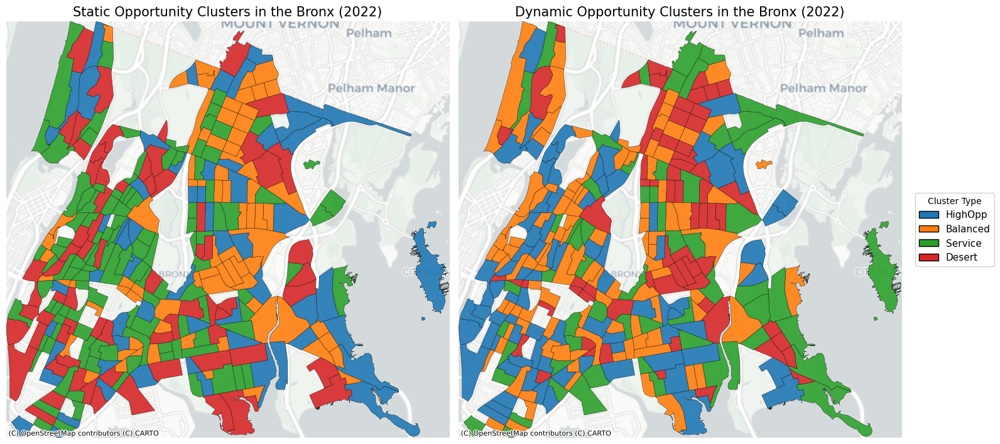

In [ ]:
# ================================
# 0. 选择年份
# ================================
year_sel = 2022   # 改成 2015 / 2019 也可以

# ================================
# 1. 颜色 & 顺序（和之前一致）
# ================================
cluster_colors = {
    "HighOpp":  "#1f77b4",   # Blue
    "Balanced": "#ff7f0e",   # Orange
    "Service":  "#2ca02c",   # Green
    "Desert":   "#d62728",   # Red
}
cluster_order = ["HighOpp", "Balanced", "Service", "Desert"]

# ================================
# 2. 从 df_panel_3years 取这一年的静态 & 动态簇
# ================================
df_sd_year = (
    df_panel_3years.loc[
        df_panel_3years["year"] == year_sel,
        ["h_tract", "year", "static_cluster_type", "dyn_cluster_type"]
    ]
    .drop_duplicates(subset=["h_tract"])
)

# ================================
# 3. merge 到 Bronx tracts（gdf_tract_filtered）
# ================================
gdf_sd = gdf_tract_filtered[["GEOID", "geometry"]].merge(
    df_sd_year,
    left_on="GEOID",
    right_on="h_tract",
    how="left"
)

# 设为有序分类，保证颜色顺序稳定
gdf_sd["static_cluster_type"] = pd.Categorical(
    gdf_sd["static_cluster_type"], categories=cluster_order, ordered=True
)
gdf_sd["dyn_cluster_type"] = pd.Categorical(
    gdf_sd["dyn_cluster_type"], categories=cluster_order, ordered=True
)

# 投影到 Web Mercator（EPSG:3857）以便加底图
gdf_sd_web = gdf_sd.to_crs(epsg=3857)
bounds = gdf_sd_web.total_bounds

# ================================
# 4. 画左右两个子图
# ================================
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

# ---------- 左：Static ----------
ax = axes[0]
for cl in cluster_order:
    sub = gdf_sd_web[gdf_sd_web["static_cluster_type"] == cl]
    if len(sub) == 0:
        continue
    sub.plot(
        ax=ax,
        color=cluster_colors[cl],
        edgecolor="black",
        linewidth=0.3,
        alpha=0.9,
        zorder=2
    )

sub_na_s = gdf_sd_web[gdf_sd_web["static_cluster_type"].isna()]
if len(sub_na_s) > 0:
    sub_na_s.plot(
        ax=ax,
        color="lightgray",
        edgecolor="none",
        alpha=0.6,
        zorder=2
    )

ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12, zorder=1)
ax.set_axis_off()
ax.set_title(f"Static Opportunity Clusters in the Bronx ({year_sel})", fontsize=15)

# ---------- 右：Dynamic ----------
ax = axes[1]
for cl in cluster_order:
    sub = gdf_sd_web[gdf_sd_web["dyn_cluster_type"] == cl]
    if len(sub) == 0:
        continue
    sub.plot(
        ax=ax,
        color=cluster_colors[cl],
        edgecolor="black",
        linewidth=0.3,
        alpha=0.9,
        zorder=2
    )

sub_na_d = gdf_sd_web[gdf_sd_web["dyn_cluster_type"].isna()]
if len(sub_na_d) > 0:
    sub_na_d.plot(
        ax=ax,
        color="lightgray",
        edgecolor="none",
        alpha=0.6,
        zorder=2
    )

ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12, zorder=1)
ax.set_axis_off()
ax.set_title(f"Dynamic Opportunity Clusters in the Bronx ({year_sel})", fontsize=15)

# ================================
# 5. label
# ================================
legend_elements = [
    Patch(facecolor=cluster_colors["HighOpp"],  edgecolor="black", label="HighOpp"),
    Patch(facecolor=cluster_colors["Balanced"], edgecolor="black", label="Balanced"),
    Patch(facecolor=cluster_colors["Service"],  edgecolor="black", label="Service"),
    Patch(facecolor=cluster_colors["Desert"],   edgecolor="black", label="Desert"),
]
if len(sub_na_s) + len(sub_na_d) > 0:
    legend_elements.append(
        Patch(facecolor="lightgray", edgecolor="none", label="No Data / Excluded")
    )

axes[1].legend(
    handles=legend_elements,
    title="Cluster Type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    framealpha=0.9,
    fontsize=11
)

plt.tight_layout()
plt.show()


## Static vs Dynamic Mismatch Map

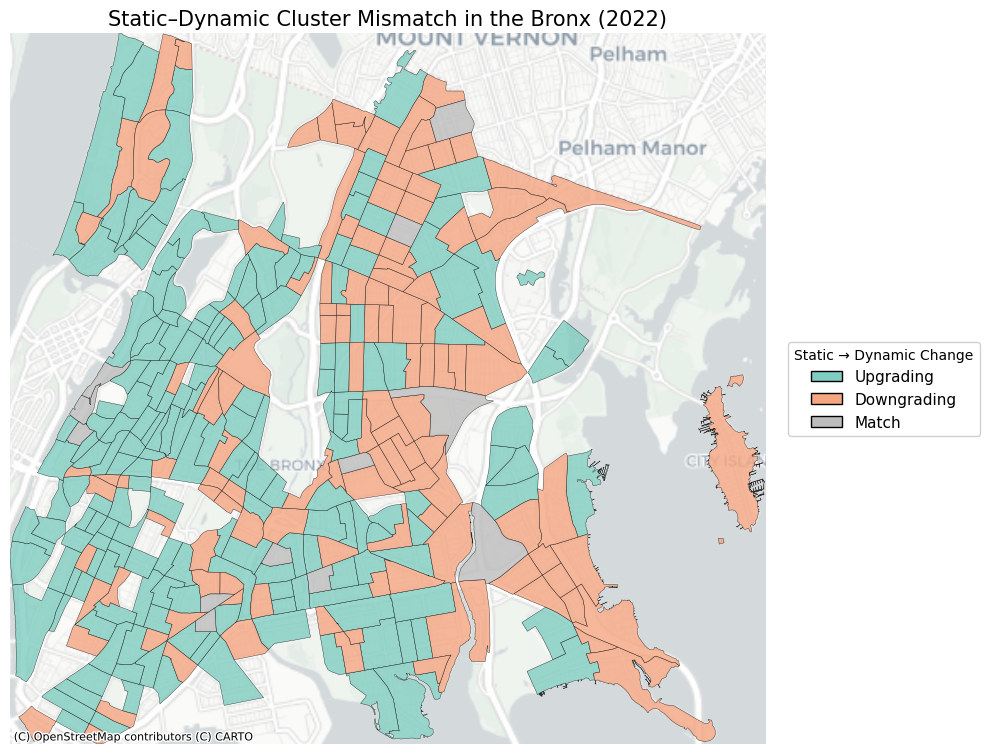

In [ ]:
# ================================
# 0. 选择年份
# ================================
year_sel = 2022  # 可以改 2015 / 2019

# ================================
# 1. 定义 cluster 等级顺序（越大越“好”）
# ================================
cluster_order = ["Desert", "Service", "Balanced", "HighOpp"]
cluster_rank = {c: i for i, c in enumerate(cluster_order)}

# Mismatch 颜色
mismatch_colors = {
"Upgrading":   "#80cdc1",
    "Downgrading": "#f4a582",
    "Match":       "#bdbdbd",
}

# ================================
# 2. 取该年的 static & dynamic cluster
# ================================
df_sd_year = (
    df_panel_3years.loc[
        df_panel_3years["year"] == year_sel,
        ["h_tract", "year", "static_cluster_type", "dyn_cluster_type"]
    ]
    .drop_duplicates(subset=["h_tract"])
)

# ================================
# 3. merge 到 Bronx tracts
# ================================
gdf_mis = gdf_tract_filtered[["GEOID", "geometry"]].merge(
    df_sd_year,
    left_on="GEOID",
    right_on="h_tract",
    how="left"
)

# ================================
# 4. 计算 Mismatch 类型
# ================================
def classify_mismatch(row):
    s = row["static_cluster_type"]
    d = row["dyn_cluster_type"]

    if pd.isna(s) or pd.isna(d):
        return "NoData"

    if (s not in cluster_rank) or (d not in cluster_rank):
        return "NoData"

    diff = cluster_rank[d] - cluster_rank[s]

    if diff > 0:
        return "Upgrading"
    elif diff < 0:
        return "Downgrading"
    else:
        return "Match"

gdf_mis["mismatch_type"] = gdf_mis.apply(classify_mismatch, axis=1)

# 设为有序分类（方便 legend 排序）
mismatch_order = ["Upgrading", "Downgrading", "Match", "NoData"]
gdf_mis["mismatch_type"] = pd.Categorical(
    gdf_mis["mismatch_type"],
    categories=mismatch_order,
    ordered=True
)

# 投影到 Web Mercator
gdf_mis_web = gdf_mis.to_crs(epsg=3857)
bounds = gdf_mis_web.total_bounds

# ================================
# 5. 画图
# ================================
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for m in mismatch_order:
    sub = gdf_mis_web[gdf_mis_web["mismatch_type"] == m]
    if len(sub) == 0:
        continue
    sub.plot(
        ax=ax,
        color=mismatch_colors[m],
        edgecolor="black" if m != "NoData" else "none",
        linewidth=0.3 if m != "NoData" else 0,
        alpha=0.8 if m != "NoData" else 0.6,
        zorder=2
    )

ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=12,
    zorder=1
)

ax.set_axis_off()
ax.set_title(
    f"Static–Dynamic Cluster Mismatch in the Bronx ({year_sel})",
    fontsize=15
)

# ================================
# 6. 图例
# ================================
legend_elements = [
    Patch(facecolor=mismatch_colors["Upgrading"],   edgecolor="black", label="Upgrading"),
    Patch(facecolor=mismatch_colors["Downgrading"], edgecolor="black", label="Downgrading"),
    Patch(facecolor=mismatch_colors["Match"],       edgecolor="black", label="Match"),

]

ax.legend(
    handles=legend_elements,
    title="Static → Dynamic Change",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),  # 图外右侧，不挡地图
    frameon=True,
    framealpha=0.9,
    fontsize=11
)

plt.tight_layout()
plt.show()

## NTA (Neighborhood Tabulation Area) level spatial aggregation map

In [ ]:
# 1. Prepare mismatch categories
df_mismatch = df_panel_3years[df_panel_3years["year"] == 2022][["h_tract", "static_cluster_type", "dyn_cluster_type"]].copy()

category_priority = {"HighOpp": 3, "Balanced": 2, "Service": 1, "Desert": 0}

df_mismatch["static_num"] = df_mismatch["static_cluster_type"].map(category_priority)
df_mismatch["dynamic_num"] = df_mismatch["dyn_cluster_type"].map(category_priority)

df_mismatch["mismatch_cat"] = np.where(
    df_mismatch["dynamic_num"] > df_mismatch["static_num"], "Upgrading",
    np.where(df_mismatch["dynamic_num"] < df_mismatch["static_num"], "Downgrading", "Match")
)

# 2. merge tract → NTA
df_mismatch = df_mismatch.merge(gdf_tract_filtered[["GEOID", "NTAName"]], left_on="h_tract", right_on="GEOID")

# 3. NTA aggregation
nta_summary = df_mismatch.groupby("NTAName")["mismatch_cat"].value_counts(normalize=True).unstack(fill_value=0)

nta_summary = nta_summary.reset_index()

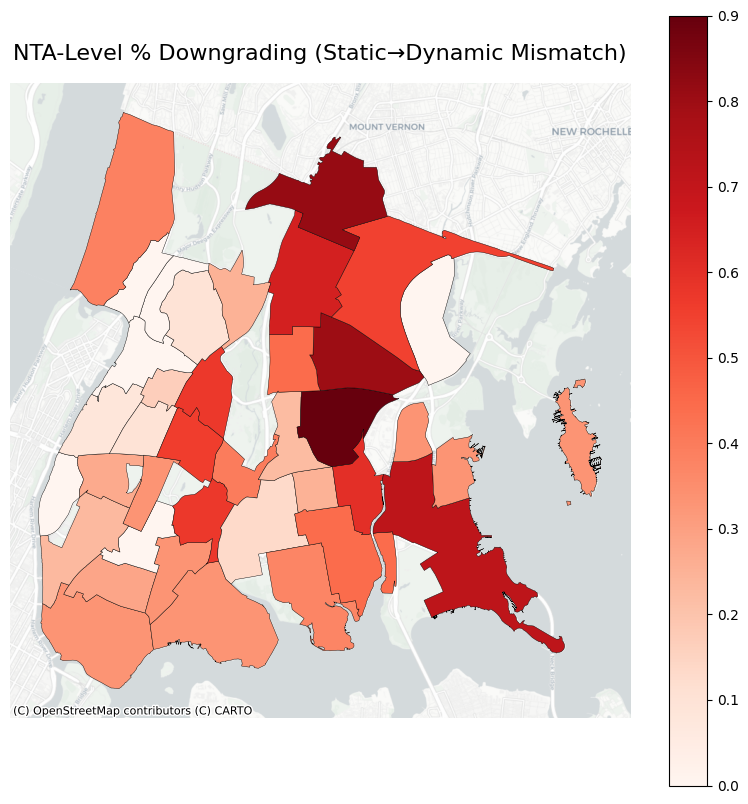

In [ ]:
# Choropleth map: Displays the proportion of NTA areas being upgraded/downgraded.

gdf_nta_map = gdf_nta.merge(nta_summary, on="NTAName", how="left")

fig, ax = plt.subplots(1,1, figsize=(10,10))

gdf_nta_map.to_crs(epsg=3857).plot(
    column="Downgrading",
    cmap="Reds",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    ax=ax
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("NTA-Level % Downgrading (Static→Dynamic Mismatch)", fontsize=16)
ax.set_axis_off()
plt.show()

## Cluster Flow Sankey Diagram（2015→2019→2022）

In [ ]:
# Organize the cluster sequence data.

df_sankey = df_full_dynamic[df_full_dynamic["year"].isin([2015,2019,2022])]
df_sankey = df_sankey.pivot(index="h_tract", columns="year", values="dyn_cluster_type")
df_sankey.columns = ["c2015","c2019","c2022"]

In [ ]:
# Statistical flow (source → target)

flow_15_19 = df_sankey.groupby(["c2015","c2019"]).size().reset_index(name="count")
flow_19_22 = df_sankey.groupby(["c2019","c2022"]).size().reset_index(name="count")

In [ ]:
# Drawing a Sankey diagram (using Plotly)

import plotly.graph_objects as go

In [ ]:
# ===== Step 0: 先只做三年 sankey：2015, 2019, 2022 =====
years = [2015, 2019, 2022]

df_flow = (
    df_panel_3years[df_panel_3years["year"].isin(years)]
    .pivot(index="h_tract", columns="year", values="dyn_cluster_type")
)

# 关键修正：不再用 subset=years，直接把有任何 NA 的行丢掉
df_flow = df_flow.dropna(how="any")

df_flow.head()

year,2015,2019,2022
h_tract,,,
36005000200,Balanced,Balanced,Balanced
36005000400,HighOpp,HighOpp,HighOpp
36005001600,HighOpp,HighOpp,HighOpp
36005001901,Service,Service,Service
36005002001,Balanced,Balanced,Balanced


In [ ]:
# ================================
sources = []
targets = []
values  = []
link_colors = []

def node_index(year, cluster):
    y_idx = years.index(year)
    c_idx = cluster_order.index(cluster)
    return y_idx * len(cluster_order) + c_idx

for i in range(len(years) - 1):
    y_from = years[i]
    y_to   = years[i+1]

    flow = df_flow.groupby([y_from, y_to]).size().reset_index(name="count")

    for _, row in flow.iterrows():
        c_from = row[y_from]
        c_to   = row[y_to]
        cnt    = int(row["count"])

        if pd.isna(c_from) or pd.isna(c_to):
            continue

        sources.append(node_index(y_from, c_from))
        targets.append(node_index(y_to,   c_to))
        values.append(cnt)

        # 直接用纯色，不加 "80"
        link_colors.append(cluster_colors[c_from])

In [ ]:
import plotly.graph_objects as go

In [ ]:
nodes = []
node_colors = []
x_pos = []
y_pos = []

for i, y in enumerate(years):
    x = i / (len(years) - 1)   # 0, 0.5, 1 ...
    for j, c in enumerate(cluster_order):
        # label 如 "Desert 2015"
        nodes.append(f"{c} {y}")
        node_colors.append(cluster_colors[c])
        x_pos.append(x)
        y_pos.append(j / (len(cluster_order) - 1))  # 0~1 竖直均匀排布

# ================================
# 2. 画 Sankey 图
# ================================
fig = go.Figure(data=[go.Sankey(
    arrangement="fixed",
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=nodes,
        color=node_colors,
        x=x_pos,
        y=y_pos,
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=link_colors,
    )
)])

fig.update_layout(
    title_text=f"Cluster Transition Flow: {years[0]} → {years[1]} → {years[-1]}",
    font=dict(size=12),
    width=1000,
    height=500,
)

fig.show()